<a href="https://colab.research.google.com/github/MarkovMarkowitz/MarkovMarkowitz/blob/main/Markov_Regime_Change_Detector.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Stochastic Modelling

Markov Regime Change Detector

## Regime Changes and the EM Algorithm: An Application for VIX**

Now we are going to develop a specific application where we will estimate a regime-switching model for the daily realizations of the CBOE's VIX index, which is a popular measure of the stock market's expectation of volatility based on S&P 500 index option volatilities.

Assume that the observable VIX process is $y_{t}= \mu_t + \varepsilon_t$, where $\varepsilon_t$ is drawn from a normal distribution with mean zero and variance $\sigma_t^2$. The conditional mean and variance of the process at each time both depend on the outcome of a Markov process with $N$ possible realizations, i.e., we have a tuple $\{(\mu_i,\sigma_i)_{i=1}^N\}$ and an associated transition matrix P.

As in the previous example, we are going to follow the Hamilton filter process. However, we are going to apply a smoothing method that allows us to obtain inferences about the probability of each state that conditions on the whole observable process $\mathcal{Y}_T$:
$$
\begin{align}
\xi_{t|T}(j) = \xi_{t|t}(j) \sum_{i=1}^N p_{ji} \frac{\xi_{t+1|T}(i)}{\xi_{t+1|t}(i)}
\end{align}
$$
These smoothed probabilities are computed backwards, starting with $\xi_{T|T}(j)$ as it arose from the forward recursion developed above. This procedure is called the Kim smoother, as developed by Kim (1993).

Thus, the log-likelihood function can be expressed as:
$$
\begin{align}
\mathcal{L}(\theta) = \sum_{t=1}^T log\ f(y_t|\mathcal{Y}_{t-1};\theta) = \sum_{t=1}^T log\ \sum_{i=1}^N \xi_{t|T}(i) \times \phi_{t}(i)
\end{align}
$$
where $\phi_{t}(i)=\phi\left(\frac{y_t-\mu_i}{\sigma_i}\right)$.

In the previous example, we opted for a "brute force" maximization of the likelihood, but we are now going to develop a particular procedure that reduces the computational burden of this type of problem. This procedure is a version of the Expectation-Maximization (EM) algorithm.

In the first step, Expectation (E), we assume that we know the actual path of the unobservable Markov process $\mathcal{S}_t$. In that case, we would have that:
$$
\begin{align}
\mathbb{P}(y_t,s_t=i|\mathcal{Y}_{t-1},\mathcal{S}_{t-1};\theta) & = \mathbb{P}(y_t|\mathcal{S}_{t};\theta)\mathbb{P}(s_t=i|\mathcal{S}_{t-1};\theta) \\ & = \phi_{t}(i)\prod_{j=1}^N \mathbb{P}(s_t=i|s_{t-1}=j;\theta)^{\mathbb{I}(s_{t-1}=j;\theta)} \\ & = \phi_{t}(i)\prod_{j=1}^N p_{ji}^{\mathbb{I}(s_{t-1}=j;\theta)}
\end{align}
$$
where $\mathbb{I}(s_{t-1}=j;\theta)$ is an indicator variable that denotes if state $j$ was realized at $t-1$. Then, the joint log-likelihood of the observations can be expressed as:
$$
\begin{align}
log\ \mathbb{P}(y_t,s_t=i|\mathcal{Y}_{t-1},\mathcal{S}_{t-1};\theta) = log\ \phi_{t}(i) +  \sum_{j=1}^M  log\ p_{ji} \times {\mathbb{I}(s_{t-1}=j;\theta)}
\end{align}
$$
Because at $t=1$ we do not observe any past history, we need to estimate or fix in advance an initial probability $\pi_j$ such that:
$$
\begin{align}
log\ \mathbb{P}(y_1,s_1=i;\theta) = log\ \phi_{t}(i) + log\ \pi_{i}
\end{align}
$$
We can now build the following log-likelihood function that considers all the potential realizations of $s_t$ (the "complete" likelihood):
$$
\begin{align}
\mathcal{L}(\theta;\mathcal{Y}_T,\mathcal{S}_T) = & \sum_{t=1}^T \sum_{i=1}^N \mathbb{I}(s_{t}=i;\theta) log\ \phi_{t}(i) + \\ & +  \sum_{t=2}^T \sum_{i=1,j=1}^N \mathbb{I}(s_{t}=i;\theta)\mathbb{I}(s_{t-1}=j;\theta) log\ p_{ji} + \\
& +  \sum_{i=1}^N \mathbb{I}(s_{1}=i;\theta)log\ \pi_{ij}
\end{align}
$$
The crucial step now is to take the expectation of the expression above by substituting the indicators $\mathbb{I}(s_{t}=j;\theta)$ with the corresponding probabilities estimated above $\xi_{t|T}(j)$. The terms $\mathbb{I}(s_{t}=j;\theta)\mathbb{I}(s_{t-1}=i;\theta)$ can be replaced by $p_{ij}\xi_{t|t}(i)\xi_{t+1|T}(j)/\xi_{t+1|t}(j)$ that arises from the each specific component of the Kim filter that arises from each state $j$.

With all these ingredients, we have completed the E step, given a guess for the parameter vector $\theta=\{(\mu_i,\sigma_i)_{i=1}^N,(p_{ij})_{i,j=1}^N\}$.

In the maximization step, instead of trying to optimize in a single step as we did in the previous lecture, we generate a series of parameter estimates $\theta^{(k)}$, such that:
$$
\begin{align}
\theta^{(k)} = \arg\underset{\theta}{\max} E\left[\mathcal{L}(\theta;\mathcal{Y}_T,\mathcal{S}_T)|\mathcal{Y}_T;\theta^{(k-1)}\right]
\end{align}
$$
Until we reach convergence.

Indeed, the assumption of normality allows us to reach a sequence of estimates with analytical expressions. At step $k$, with the guessed vector of parameters $\theta^{(k-1)}$, differentiation of the log-likelihood function with respect to $\sigma_i$ yields:
$$
\begin{align}
\frac{\partial \sum_{t=1}^T \xi_{t|T}^{(k-1)}(i)\ log\ \phi_{it}}{\partial \sigma_i} = \sum_{t=1}^T \xi_{t|T}^{(k-1)}(i)\ \left(\frac{(y_t-\mu_i)^2}{\sigma_i^2}-1\right) = 0
\end{align}
$$
So that,
$$
\begin{align}
\sigma_i^{(k)} = \sqrt{\frac{\sum_{t=1}^T \xi_{t|T}^{(k-1)}(i) \left(y_t-\mu^{(k)}_{-1}\right)^2}{\sum_{t=1}^T \xi_{t|T}^{(k-1)}(i)}}
\end{align}
$$
The expression is just the squared root of a weighted average of the squared deviations of the process, where the weights are the relative estimated probability of state $i$ occurring. Differentiation with respect to $\mu_i^{(k)}$ yields:
$$
\begin{align}
\sum_{t=1}^T \xi_{t|T}^{(k-1)}(i) \frac{y_t-\mu_i^{(k)}}{\left(\sigma_i^{(k)}\right)^2} = 0
\end{align}
$$
The corresponding estimates $\mu_i^{(k)}$, are just averages that are weighted by the estimated probability that the process is in state $i$ at each date $t$:
$$
\begin{align}
\mu_i^{(k)} = \frac{\sum_{t=1}^T \xi_{t|T}^{(k-1)}(i) y_t}{\sum_{i=1}^M \xi_{t|T}^{(k-1)}(i)}
\end{align}
$$
Finally, we can show that the estimates for the transition matrix and the initial distribution are given by:
$$
\begin{align}
& p_{ij}^{(k)} = \frac{\sum_{t=2}^T p_{ij}^{(k-1)}\xi_{t-1|t-1}(i)\xi_{t|T}(j)/\xi_{t|t}(j)}{\sum_{t=2}^T \xi_{t-1|T}^{(k-1)}(i)} \\
& \pi_i^{(k)} = \xi_{1|T}^{(k-1)}(i)
\end{align}
$$
Notice the resemblance of the solution $p_{ij}^{(k)}$ with the MLE estimate for the transition probabilities we learned in the first lesson. We now have all the ingredients to set the optimization algorithm and estimate the parameters. First, define again the functions needed to estimate the model:

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
from pandas_datareader import data as pdr
import yfinance as yf
yf.pdr_override()


START = '2019-01-01'
END = '2022-12-31'

# STEP 1. Data Download



In [ ]:
aapl = pdr.get_data_yahoo("AAPL", start= START, end=END)
btcusd = pdr.get_data_yahoo("BTC-USD", start=START, end=END)
tsla = pdr.get_data_yahoo("TSLA", start=START, end=END)
vix = pdr.get_data_yahoo("^VIX", start=START, end=END)


In [ ]:
aapl_close = aapl['Adj Close']
aapl_log_returns = aapl_close.pct_change().apply(lambda x: np.log(1+x))
print(aapl_log_returns)

btcusd_close = btcusd['Adj Close']
btcusd_log_returns = btcusd_close.pct_change().apply(lambda x: np.log(1+x))
print(btcusd_log_returns)

tsla_close = tsla['Adj Close']
tsla_log_returns = tsla_close.pct_change().apply(lambda x: np.log(1+x))
print(tsla_log_returns)





In [ ]:
df = pd.DataFrame()
df["aapl"] = aapl_log_returns
df["btc"] = btcusd_log_returns
df["tsla"] = tsla_log_returns
df["vix"] = vix['Adj Close']


window = 10 # mean days for calculating volatility

# defining volatility for each log returns data
df["aapl.vlt"] = df["aapl"].rolling(window).std()*(252**0.5)
df["btc.vlt"] = df["btc"].rolling(window).std()*(252**0.5)
df["tsla.vlt"] = df["tsla"].rolling(window).std()*(252**0.5)
df["vix.vlt"] = df["vix"]/100

print(df)


# STEP 2.a. Data Selection Decision

## Let us plot for all 4 data decide for one of them.

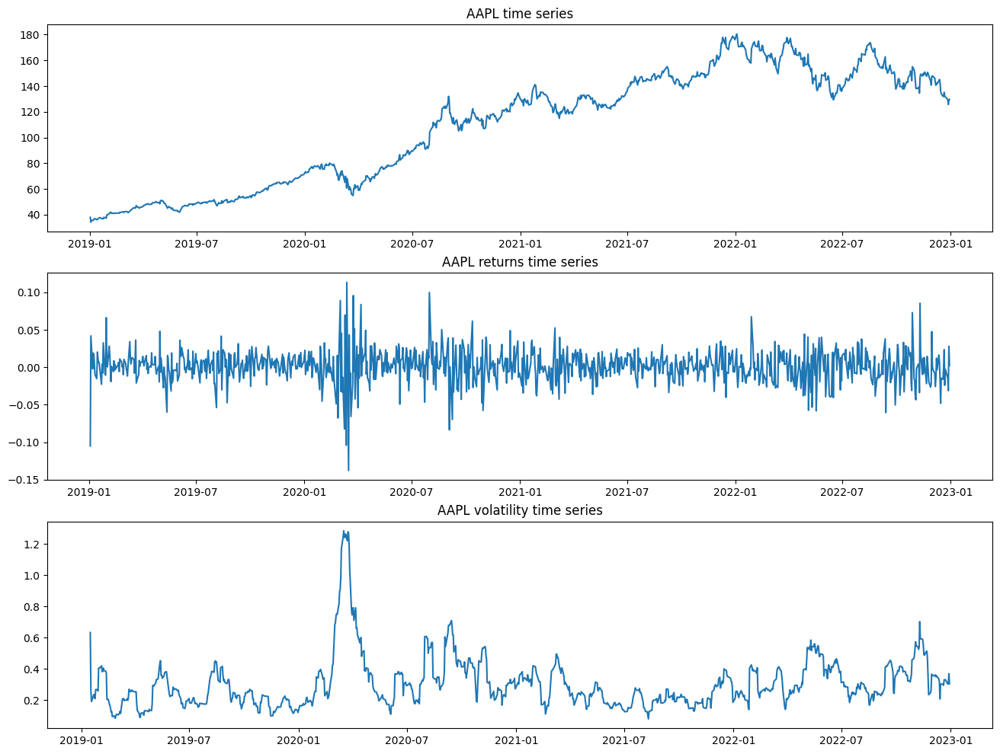

In [ ]:
plt.subplot(3, 1, 1)
plt.plot(aapl_close)
plt.title("AAPL time series")

plt.subplot(3, 1, 2)
plt.plot(df["aapl"])
plt.title("AAPL returns time series")


plt.subplot(3, 1, 3)
plt.plot(df["aapl.vlt"])
plt.title("AAPL volatility time series")

fig = plt.gcf()
fig.set_size_inches(16, 12)
plt.show()

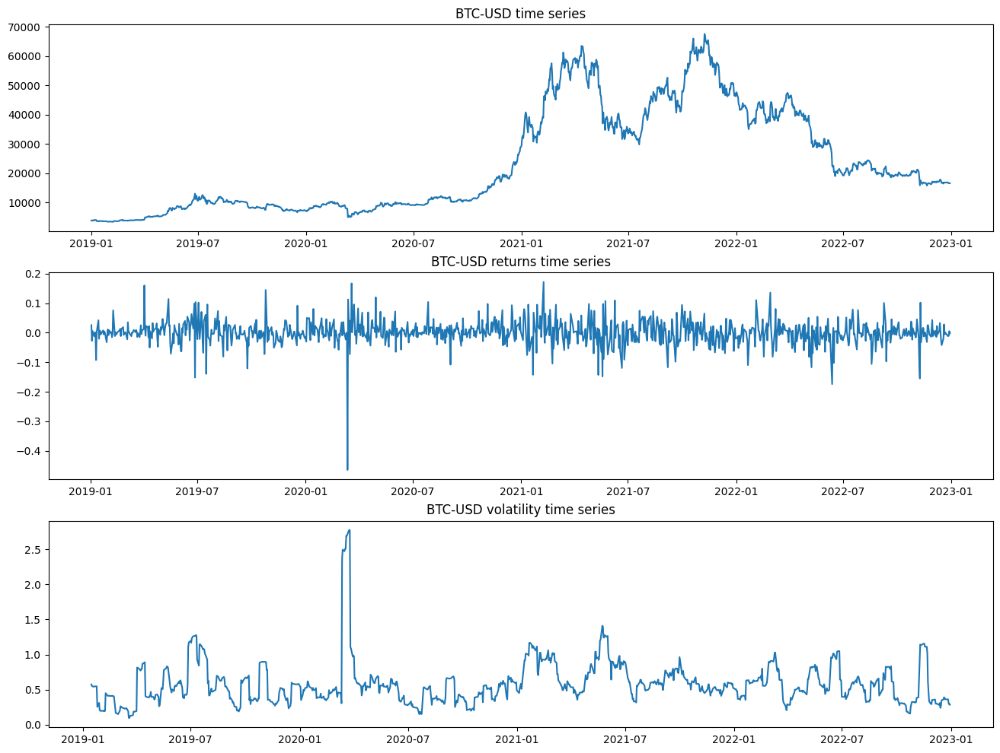

In [ ]:
plt.subplot(3, 1, 1)
plt.plot(btcusd_close)
plt.title("BTC-USD time series")

plt.subplot(3, 1, 2)
plt.plot(df["btc"])
plt.title("BTC-USD returns time series")


plt.subplot(3, 1, 3)
plt.plot(df["btc.vlt"])
plt.title("BTC-USD volatility time series")

fig = plt.gcf()
fig.set_size_inches(16, 12)
plt.show()

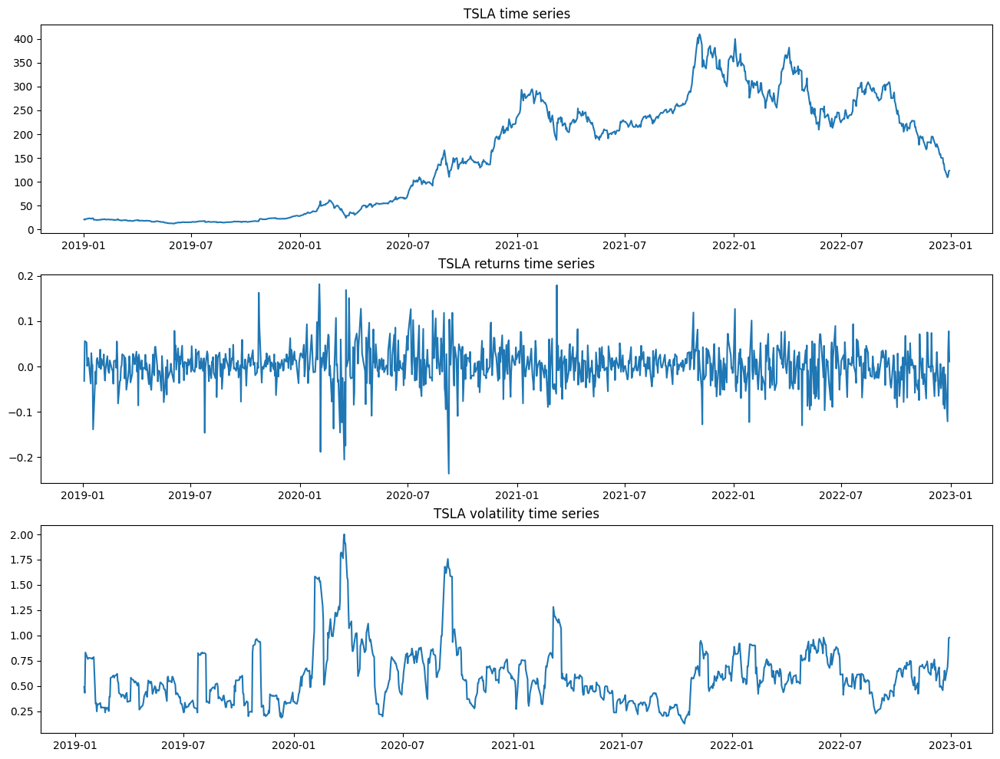

In [ ]:
plt.subplot(3, 1, 1)
plt.plot(tsla_close)
plt.title("TSLA time series")

plt.subplot(3, 1, 2)
plt.plot(df["tsla"])
plt.title("TSLA returns time series")


plt.subplot(3, 1, 3)
plt.plot(df["tsla.vlt"])
plt.title("TSLA volatility time series")

fig = plt.gcf()
fig.set_size_inches(16, 12)
plt.show()

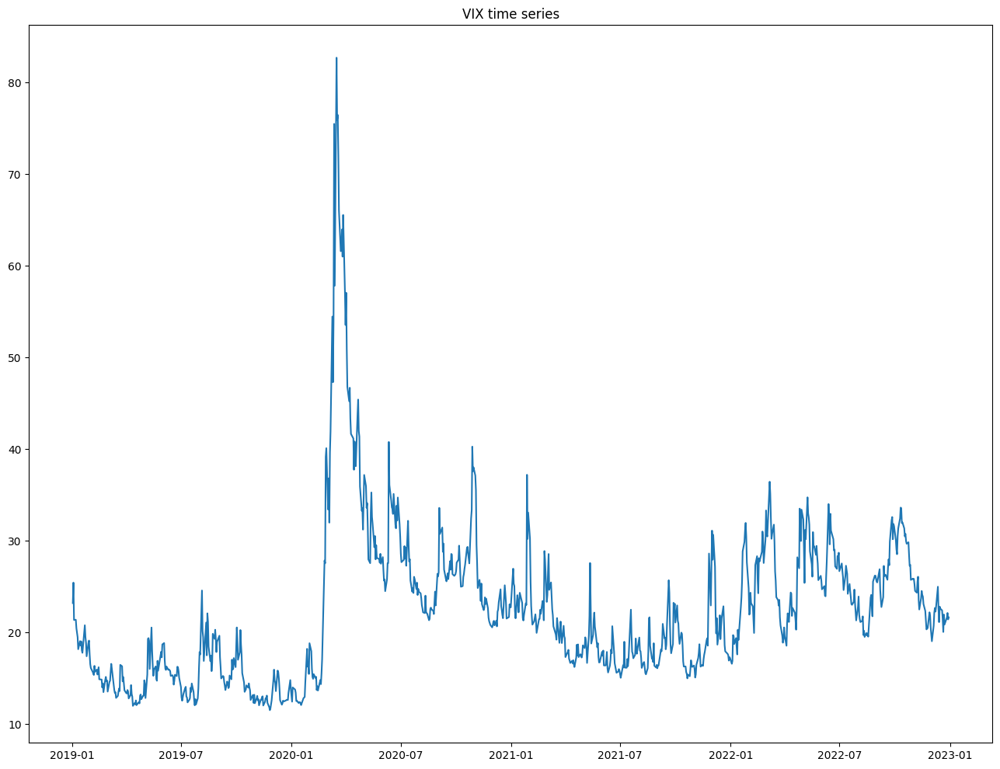

In [ ]:
plt.plot(vix["Adj Close"])
plt.title("VIX time series")


fig = plt.gcf()
fig.set_size_inches(16, 12)
plt.show()

Among these 4 data, we think all can be used for volatility modelling and estimation but we selected VIX as it is a common universal data set for volatility and it is capable of showing the significant volatility change within post-COVID19 markets.

# STEP 2.b Estimate a Markov-regime switching model for VIX

In [ ]:
# Estimation of model with changes in volatility regimes

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.stats import norm

# Estimation of model with changes in volatility regimes
# Build function that performs the E step
# Likelihood of an observation


def likelihood(xi_prob, mu, sigma, y):
    phi = norm.pdf((y - mu) / sigma)
    y_like = np.dot(xi_prob, phi)

    return y_like


# Hamilton filtering
def forward_alg(pi_hat0, N, T, P, mu, sigma, Y):
    xi_prob_t = np.zeros((T, N))
    xi_prob_t1 = np.zeros((T, N))

    # Case t=1
    y_like = likelihood(pi_hat0, mu, sigma, Y[0])
    for ss in range(0, N):
        phi = np.zeros((N))
        for ss2 in range(0, N):
            phi[ss2] = norm.pdf((Y[0] - mu[ss2]) / sigma[ss2])
    xi_prob_t[0, :] = np.multiply(pi_hat0, phi) / y_like
    for ss in range(0, N):
        xi_prob_t1[0, ss] = np.dot(P[:, ss], xi_prob_t[0, :])

    for tt in range(1, T):
        y_like = likelihood(xi_prob_t1[tt - 1, :], mu, sigma, Y[tt])
        for ss in range(0, N):
            phi = np.zeros((N))
            for ss2 in range(0, N):
                phi[ss2] = norm.pdf((Y[tt] - mu[ss2]) / sigma[ss2])
        xi_prob_t[tt, :] = np.multiply(xi_prob_t1[tt - 1, :], phi) / y_like
        for ss in range(0, N):
            xi_prob_t1[tt, ss] = np.dot(P[:, ss], xi_prob_t[tt, :])

    return xi_prob_t, xi_prob_t1


# Kim filtering
def backward_alg(xi_prob_t, xi_prob_t1, N, T, P, mu, sigma, Y):
    xi_prob_T = np.zeros((T, N))
    xi_prob_T[T - 1, :] = xi_prob_t[T - 1, :]

    for tt in range(T - 2, -1, -1):
        xi_T_xi = np.divide(xi_prob_T[tt + 1, :], xi_prob_t1[tt, :])
        for ss in range(0, N):
            xi_prob_T[tt, ss] = xi_prob_t[tt, ss] * np.dot(P[ss, :], xi_T_xi)

    return xi_prob_T  # , xi_prob_T1


def M_step_func(xi_prob, P, N, T, Y):  #
    mu_hat = np.zeros((N))
    sigma_hat = np.zeros((N))
    P_hat = np.zeros((N, N))
    pi_hat = np.zeros((N))

    for ss in range(0, N):
        xi_y = np.dot(xi_prob[:, ss], Y)
        mu_hat[ss] = xi_y / np.sum(xi_prob[:, ss])

        xi_y_mu2 = np.dot(xi_prob[:, ss], (Y - mu_hat[ss]) ** 2)
        sigma_hat[ss] = (xi_y_mu2 / np.sum(xi_prob[:, ss])) ** 0.5

        for ss2 in range(0, N):
            P_hat[ss, ss2] = np.sum(P[ss, ss2, 1:]) / np.sum(
                P[ss, :, 1:]
            )  # /np.sum(xi_prob[0:T-1,ss]) #np.sum(P[ss,:,1:T])
            # print( np.sum(xi_prob[0:T-1,ss]), np.sum(P[ss,:,1:T]))

        pi_hat[ss] = xi_prob[0, ss]

    return mu_hat, sigma_hat, P_hat, pi_hat

                 Open       High        Low      Close  Adj Close  Volume
Date                                                                     
2019-01-02  27.540001  28.530001  23.049999  23.219999  23.219999       0
2019-01-03  25.680000  26.600000  24.049999  25.450001  25.450001       0
2019-01-04  24.360001  24.480000  21.190001  21.379999  21.379999       0
2019-01-07  22.059999  22.709999  20.910000  21.400000  21.400000       0
2019-01-08  20.959999  22.030001  20.090000  20.469999  20.469999       0
...               ...        ...        ...        ...        ...     ...
2022-12-23  22.170000  22.639999  20.780001  20.870001  20.870001       0
2022-12-27  21.670000  22.799999  21.590000  21.650000  21.650000       0
2022-12-28  21.469999  22.260000  20.959999  22.139999  22.139999       0
2022-12-29  22.250000  22.309999  21.360001  21.440001  21.440001       0
2022-12-30  21.830000  22.400000  21.590000  21.670000  21.670000       0

[1008 rows x 6 columns]


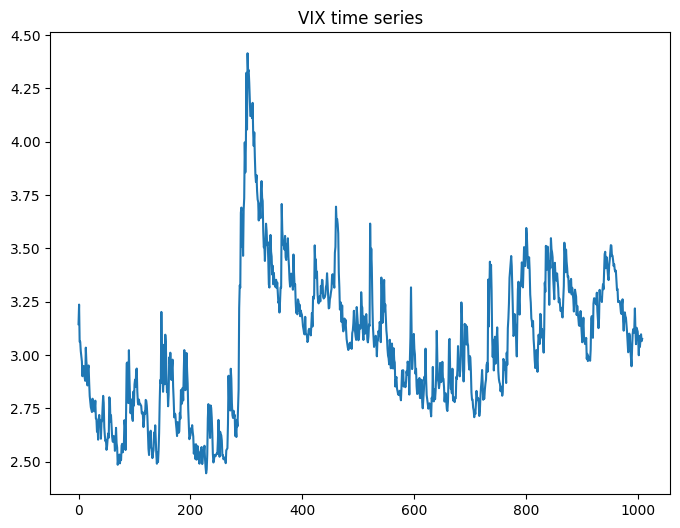

In [ ]:
## Read data for VIX
print (vix)
YDatapd = vix['Adj Close']

#YDatapd = df["tsla.vlt"]
#YDatapd = aapl['Adj Close'] # PRICE DATA IS NOT GOOD FOR REGIME ESTIMATION


YData = YDatapd.to_numpy()
YData = np.log(YData)
plt.plot(YData)
plt.title("VIX time series")

fig = plt.gcf()
fig.set_size_inches(8, 6)
plt.show()

## STEP 2.b.i Different number of states. We will try 3 states instead of 2


mu_hat0 = [2.5 3.  3.5], 
sigma_hat0 = [0.1 0.1 0.1], 
P_hat0 = 
[[0.85  0.075 0.075]
 [0.05  0.9   0.05 ]
 [0.15  0.15  0.7  ]], 
pi_hat0 = [0.33333333 0.5        0.16666667]



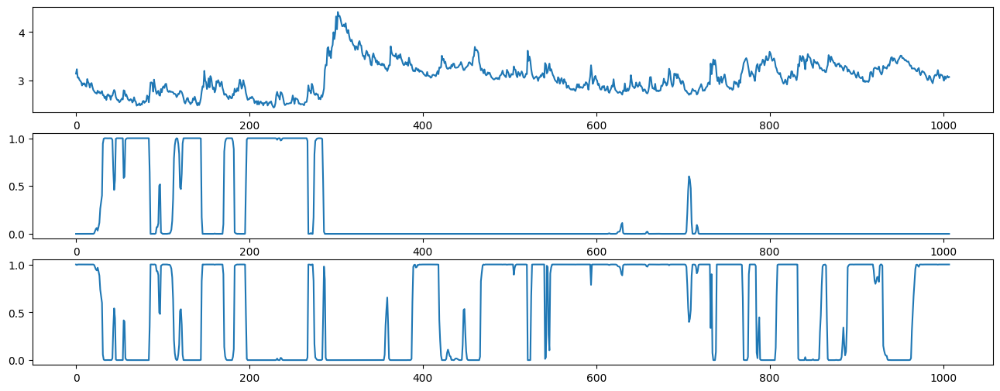


ite=0, max(diff) = 16.329974398142586

mu_hat0 = [2.61669347 2.99722118 3.46366184], 
sigma_hat0 = [0.08223747 0.15154768 0.22681317], 
P_hat0 = 
[[9.54794356e-01 4.51161524e-02 8.94921007e-05]
 [1.49307394e-02 9.58494581e-01 2.65746797e-02]
 [6.16176416e-11 5.42230777e-02 9.45776922e-01]], 
pi_hat0 = [1.58712539e-10 9.99593581e-01 4.06418960e-04]



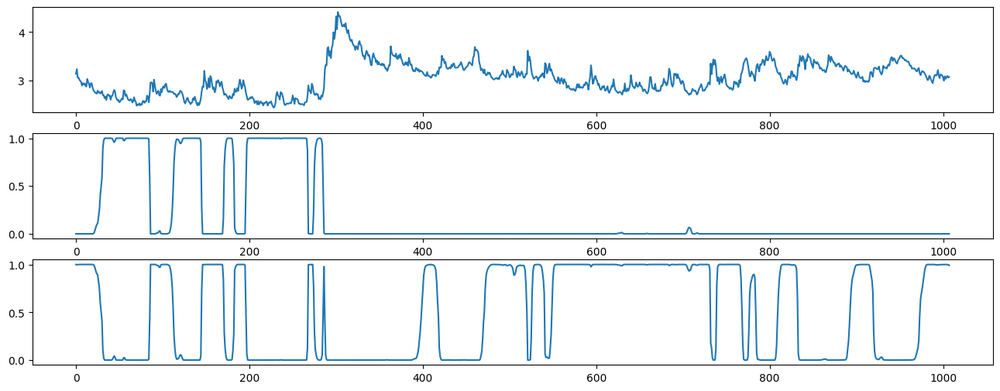


ite=1, max(diff) = 1063.7281041623744

mu_hat0 = [2.6180851  2.96894806 3.41332296], 
sigma_hat0 = [0.08461114 0.13969586 0.22917535], 
P_hat0 = 
[[9.70778311e-01 2.92116352e-02 1.00533803e-05]
 [1.09186980e-02 9.69643342e-01 1.94379597e-02]
 [5.84383156e-14 2.81693571e-02 9.71830643e-01]], 
pi_hat0 = [1.30681788e-20 9.99949438e-01 5.05620394e-05]



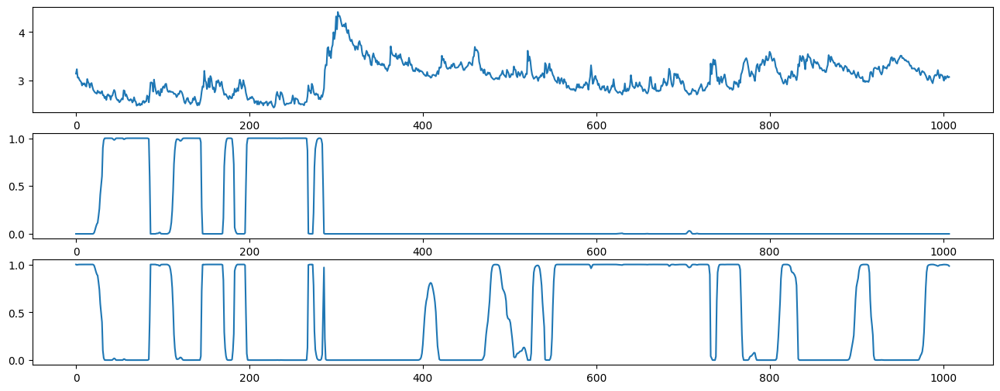


ite=2, max(diff) = 188.1849149760487

mu_hat0 = [2.61816787 2.94408946 3.37219814], 
sigma_hat0 = [0.0847261  0.12969564 0.23324291], 
P_hat0 = 
[[9.71765797e-01 2.82297754e-02 4.42790606e-06]
 [1.20510934e-02 9.68424003e-01 1.95249033e-02]
 [8.65249426e-17 2.09669357e-02 9.79033064e-01]], 
pi_hat0 = [3.28480304e-30 9.99986278e-01 1.37219212e-05]



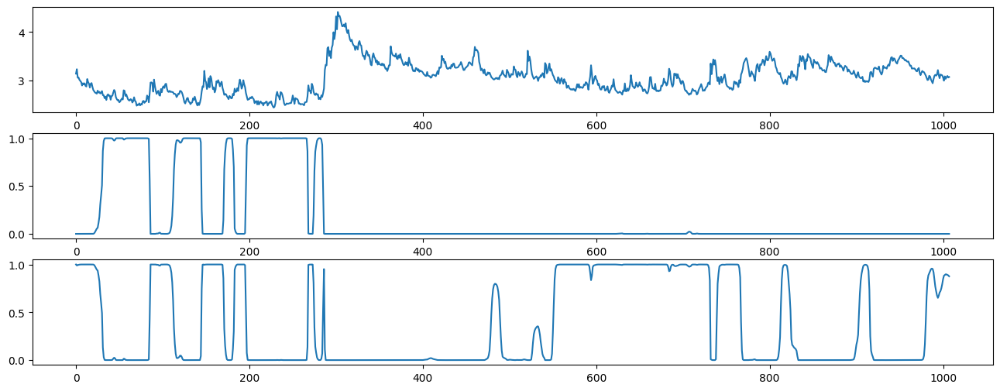


ite=3, max(diff) = 158.43390067678033

mu_hat0 = [2.61700482 2.91819066 3.33891758], 
sigma_hat0 = [0.08414983 0.11952427 0.23585296], 
P_hat0 = 
[[9.71470303e-01 2.85268856e-02 2.81168864e-06]
 [1.38676487e-02 9.67285818e-01 1.88465331e-02]
 [1.74213343e-19 1.51589061e-02 9.84841094e-01]], 
pi_hat0 = [1.26322124e-39 9.99984492e-01 1.55079175e-05]



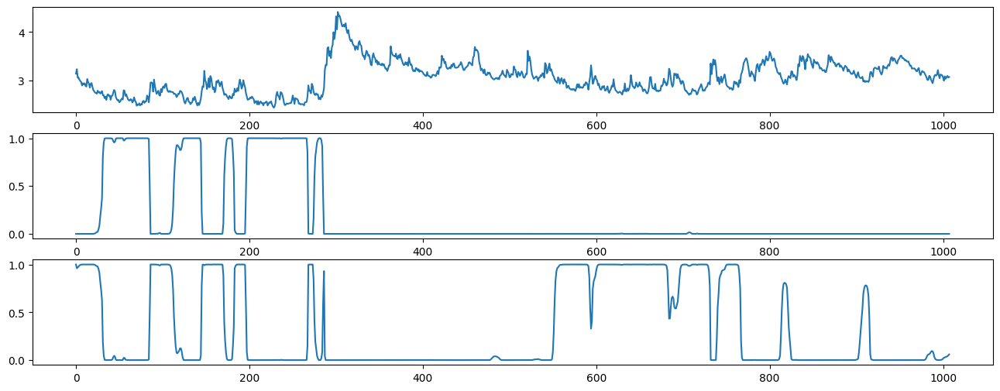


ite=4, max(diff) = 170.19456216246326

mu_hat0 = [2.61510478 2.89134617 3.30982499], 
sigma_hat0 = [0.08322065 0.1076191  0.23915048], 
P_hat0 = 
[[9.70748084e-01 2.92497753e-02 2.14067262e-06]
 [1.62387531e-02 9.64073097e-01 1.96881502e-02]
 [3.76800083e-22 1.05847893e-02 9.89415211e-01]], 
pi_hat0 = [6.11465693e-49 9.99860360e-01 1.39640101e-04]



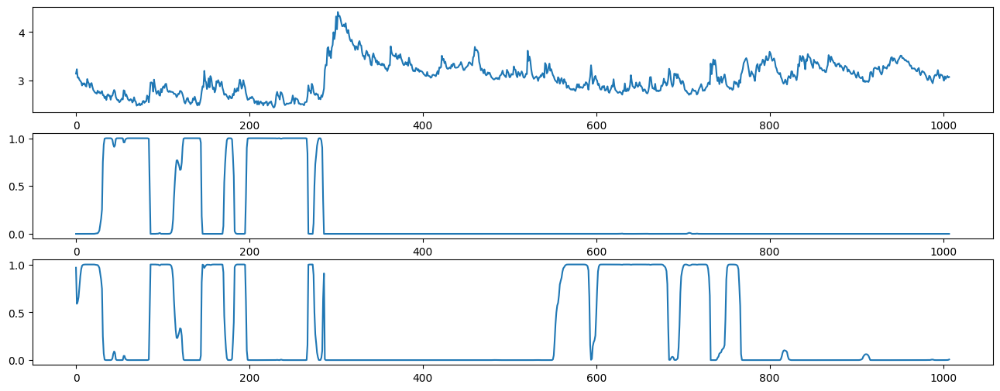


ite=5, max(diff) = 670.1742607570092

mu_hat0 = [2.61249039 2.86956227 3.2889724 ], 
sigma_hat0 = [0.0819251  0.09668331 0.24250332], 
P_hat0 = 
[[9.69419597e-01 3.05787031e-02 1.70001418e-06]
 [1.88023685e-02 9.61087495e-01 2.01101370e-02]
 [9.59540324e-25 8.64887968e-03 9.91351120e-01]], 
pi_hat0 = [2.76290937e-58 9.66351647e-01 3.36483531e-02]



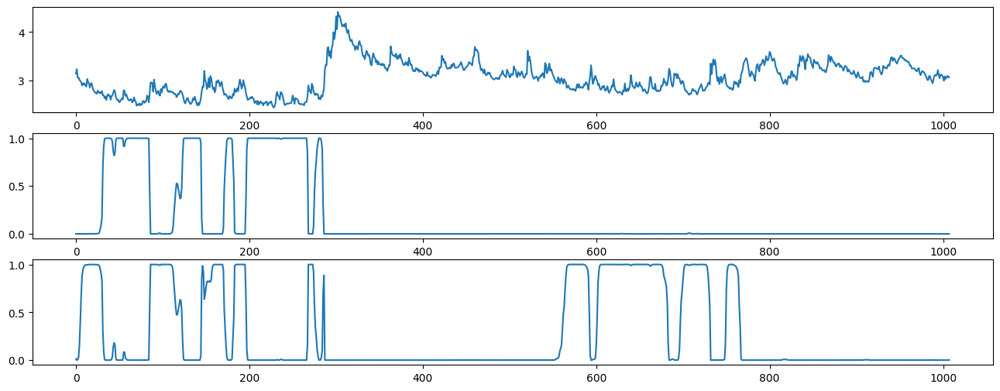


ite=6, max(diff) = 19084.534046102697

mu_hat0 = [2.60930438 2.85607871 3.27880316], 
sigma_hat0 = [0.08021314 0.08901199 0.24405509], 
P_hat0 = 
[[9.67490994e-01 3.25075815e-02 1.42483317e-06]
 [2.07205761e-02 9.58680046e-01 2.05993784e-02]
 [2.94601542e-27 9.63202107e-03 9.90367979e-01]], 
pi_hat0 = [1.04898844e-70 1.21249446e-02 9.87875055e-01]



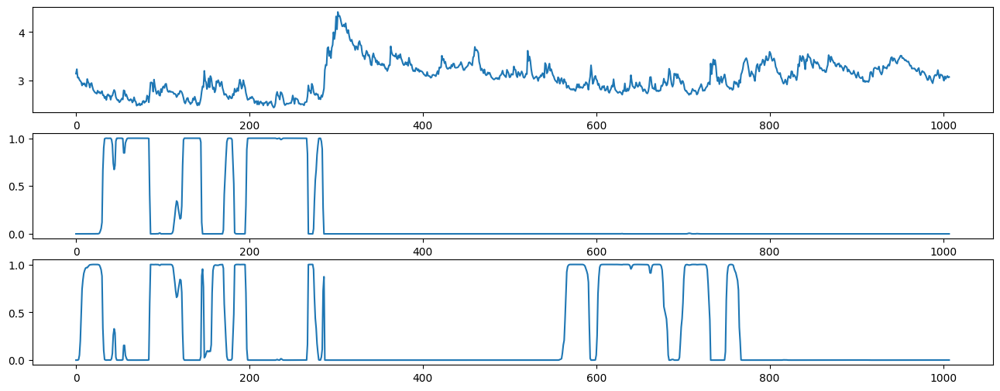


ite=7, max(diff) = 242.4683098827267

mu_hat0 = [2.60646776 2.84712872 3.27062407], 
sigma_hat0 = [0.07849247 0.08441092 0.24612566], 
P_hat0 = 
[[9.65288217e-01 3.47105580e-02 1.22498317e-06]
 [2.26889595e-02 9.52960509e-01 2.43505317e-02]
 [1.09511990e-29 1.05965989e-02 9.89403401e-01]], 
pi_hat0 = [4.26749504e-86 1.52906140e-06 9.99998471e-01]



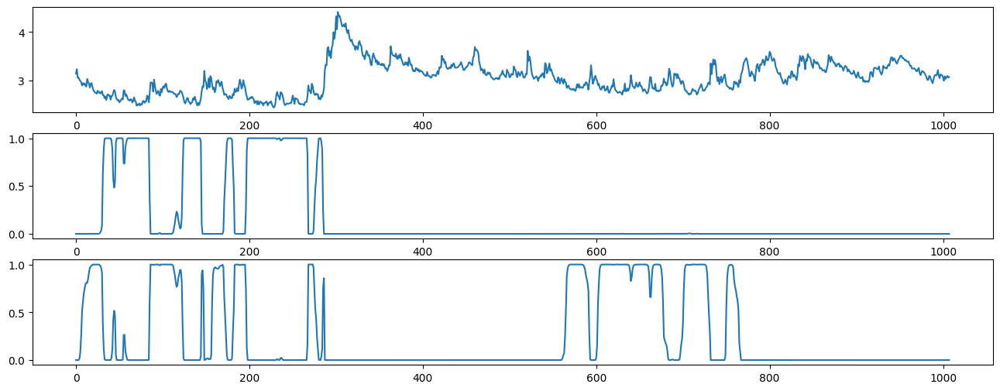


ite=8, max(diff) = 148.64251011177697

mu_hat0 = [2.60398089 2.84128802 3.2651303 ], 
sigma_hat0 = [0.07683249 0.08240464 0.24758351], 
P_hat0 = 
[[9.62804449e-01 3.71946757e-02 8.75542028e-07]
 [2.45847754e-02 9.48563450e-01 2.68517743e-02]
 [6.77628967e-32 1.11475481e-02 9.88852452e-01]], 
pi_hat0 = [3.68012654e-102 8.46894952e-011 1.00000000e+000]



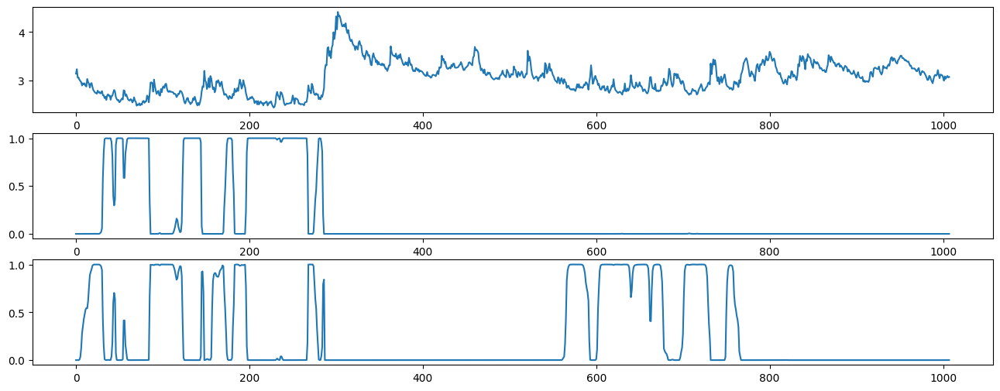


ite=9, max(diff) = 157.52983827824605

mu_hat0 = [2.60156061 2.83628415 3.26054389], 
sigma_hat0 = [0.07513624 0.08074667 0.2488404 ], 
P_hat0 = 
[[9.60118872e-01 3.98805902e-02 5.37823835e-07]
 [2.65194480e-02 9.44002543e-01 2.94780087e-02]
 [6.89769784e-34 1.17772185e-02 9.88222781e-01]], 
pi_hat0 = [6.33832946e-119 2.90292775e-015 1.00000000e+000]



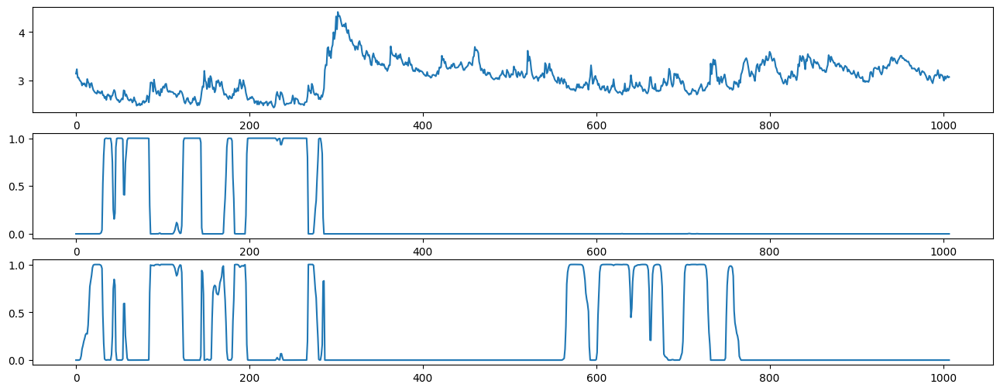


ite=10, max(diff) = 169.41689526482995

mu_hat0 = [2.59931071 2.83122079 3.25579727], 
sigma_hat0 = [0.0734779  0.07881299 0.25016574], 
P_hat0 = 
[[9.57386995e-01 4.26127179e-02 2.86817699e-07]
 [2.86383145e-02 9.38916474e-01 3.24452111e-02]
 [1.21651247e-35 1.24298668e-02 9.87570133e-01]], 
pi_hat0 = [1.69447427e-136 6.45481424e-020 1.00000000e+000]



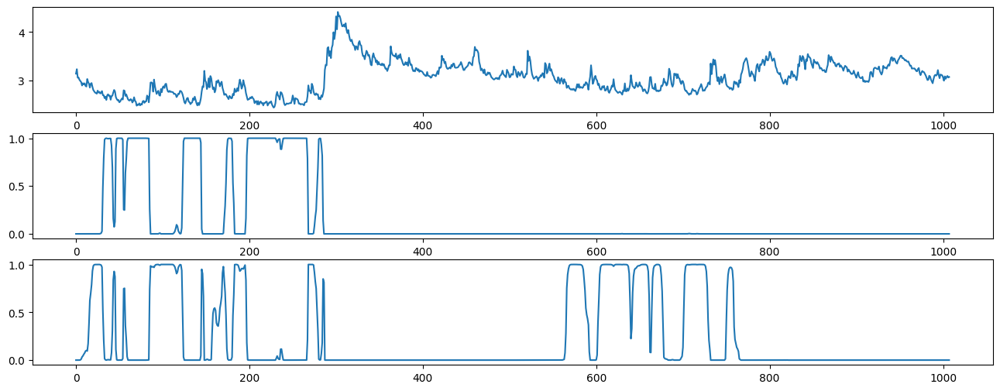


ite=11, max(diff) = 173.7768410350879

mu_hat0 = [2.59734577 2.82583811 3.25050971], 
sigma_hat0 = [0.0720004  0.0764826  0.25168112], 
P_hat0 = 
[[9.54935786e-01 4.50640748e-02 1.39476511e-07]
 [3.08835474e-02 9.33296731e-01 3.58197215e-02]
 [3.88451554e-37 1.30476086e-02 9.86952391e-01]], 
pi_hat0 = [5.77222301e-155 8.44842568e-025 1.00000000e+000]



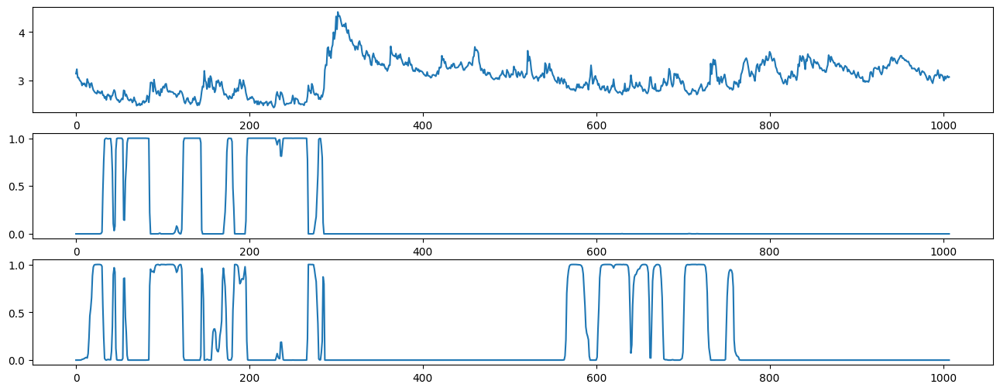


ite=12, max(diff) = 164.0117064242217

mu_hat0 = [2.59573727 2.82060183 3.24525177], 
sigma_hat0 = [0.07079782 0.07413606 0.25320133], 
P_hat0 = 
[[9.52908693e-01 4.70912364e-02 7.08009360e-08]
 [3.30896670e-02 9.27639319e-01 3.92710139e-02]
 [2.31765965e-38 1.35636204e-02 9.86436380e-01]], 
pi_hat0 = [2.44750714e-174 5.53397304e-030 1.00000000e+000]



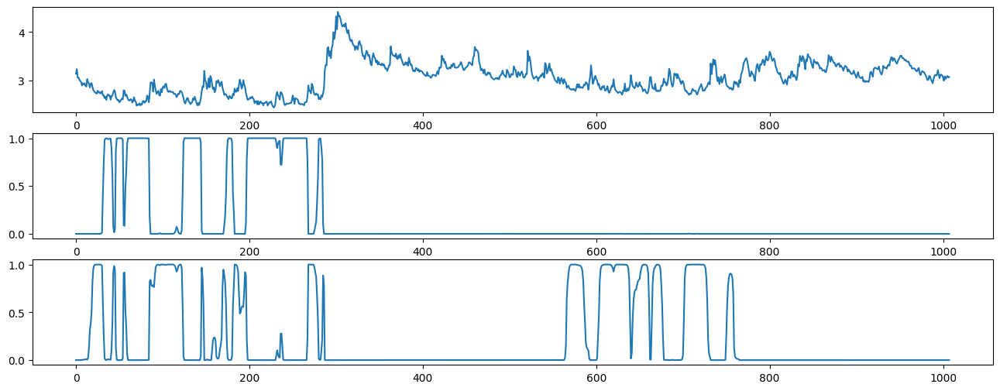


ite=13, max(diff) = 175.684073078017

mu_hat0 = [2.59442367 2.81549658 3.24011961], 
sigma_hat0 = [0.06982807 0.0718167  0.25467351], 
P_hat0 = 
[[9.51207785e-01 4.87921683e-02 4.71389424e-08]
 [3.53039024e-02 9.21208993e-01 4.34871045e-02]
 [2.73190359e-39 1.42165661e-02 9.85783434e-01]], 
pi_hat0 = [1.62088574e-194 1.65586381e-035 1.00000000e+000]



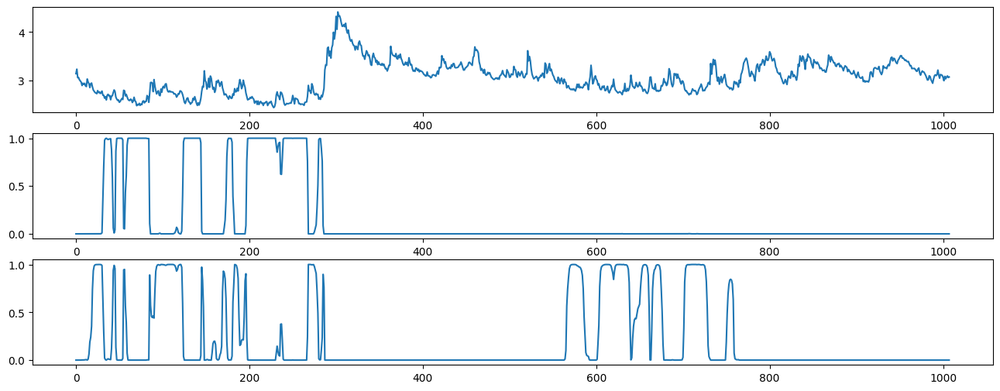


ite=14, max(diff) = 216.41071332094626

mu_hat0 = [2.59328365 2.80947458 3.23419565], 
sigma_hat0 = [0.06898547 0.06870509 0.25633199], 
P_hat0 = 
[[9.49666200e-01 5.03337526e-02 4.72234281e-08]
 [3.79717433e-02 9.12754352e-01 4.92739045e-02]
 [5.06827530e-40 1.50408765e-02 9.84959124e-01]], 
pi_hat0 = [2.62882539e-215 2.10074129e-041 1.00000000e+000]



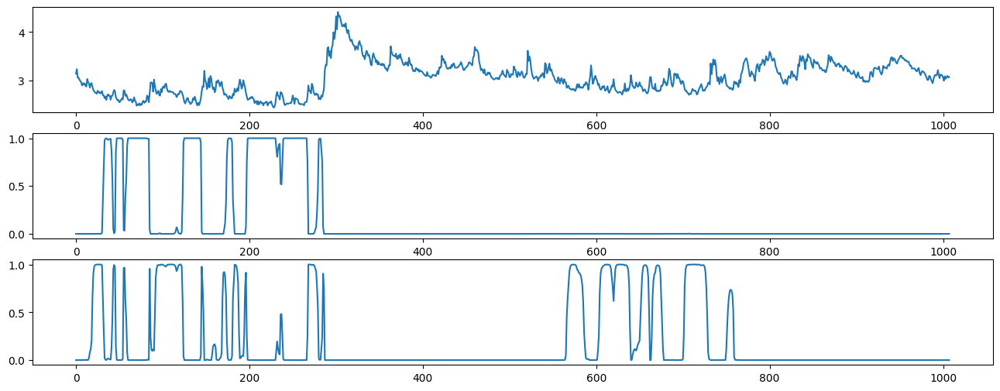


ite=15, max(diff) = 230.59360469350295

mu_hat0 = [2.59229229 2.80282966 3.22771011], 
sigma_hat0 = [0.06822465 0.06495837 0.25814938], 
P_hat0 = 
[[9.48173365e-01 5.18265735e-02 6.15955240e-08]
 [4.12399633e-02 9.03298374e-01 5.54616631e-02]
 [1.14314339e-40 1.56217428e-02 9.84378257e-01]], 
pi_hat0 = [1.72656280e-236 7.39004104e-048 1.00000000e+000]



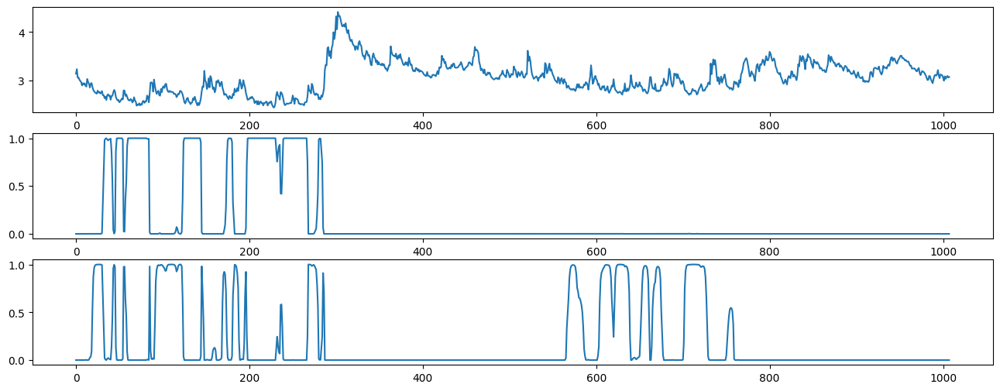


ite=16, max(diff) = 208.7522161540465

mu_hat0 = [2.59148128 2.79701457 3.22153118], 
sigma_hat0 = [0.067571   0.06202178 0.26000738], 
P_hat0 = 
[[9.46748167e-01 5.32517508e-02 8.17275128e-08]
 [4.48094531e-02 8.94457294e-01 6.07332525e-02]
 [2.87441256e-41 1.57930771e-02 9.84206923e-01]], 
pi_hat0 = [6.36158731e-258 4.13149751e-055 1.00000000e+000]



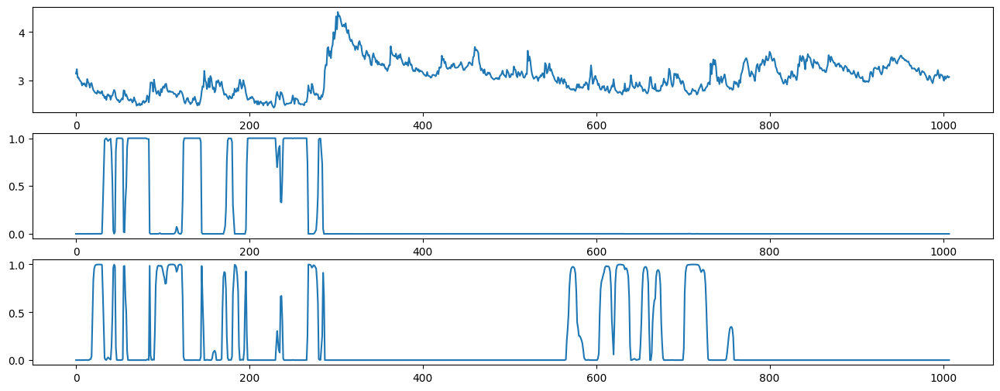


ite=17, max(diff) = 201.38476599486387

mu_hat0 = [2.59069411 2.79151057 3.21541769], 
sigma_hat0 = [0.0669539  0.05976883 0.26192375], 
P_hat0 = 
[[9.45375311e-01 5.46245841e-02 1.05218349e-07]
 [4.87451901e-02 8.85899894e-01 6.53549156e-02]
 [7.79412205e-42 1.56540956e-02 9.84345904e-01]], 
pi_hat0 = [1.47782257e-279 3.88085550e-063 1.00000000e+000]



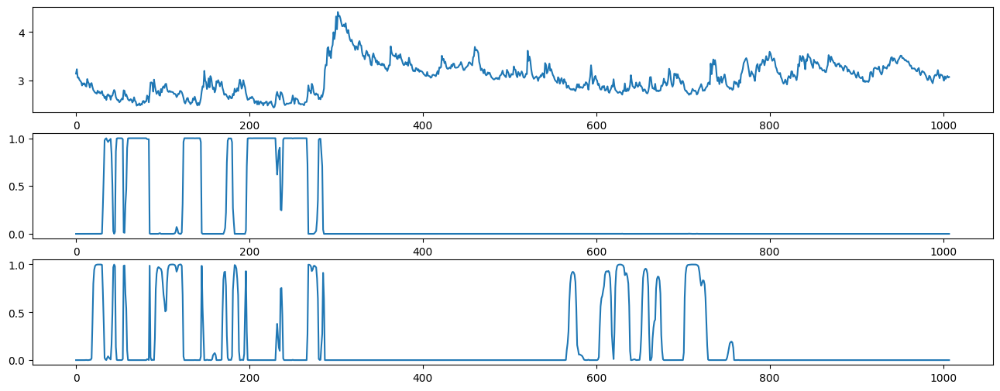


ite=18, max(diff) = 225.21158137098672

mu_hat0 = [2.58978126 2.78590767 3.20919742], 
sigma_hat0 = [0.06627395 0.05765695 0.26393153], 
P_hat0 = 
[[9.43926511e-01 5.60733566e-02 1.32426377e-07]
 [5.32419154e-02 8.76261567e-01 7.04965175e-02]
 [2.23262514e-42 1.54806435e-02 9.84519356e-01]], 
pi_hat0 = [2.13858932e-301 6.77057414e-072 1.00000000e+000]



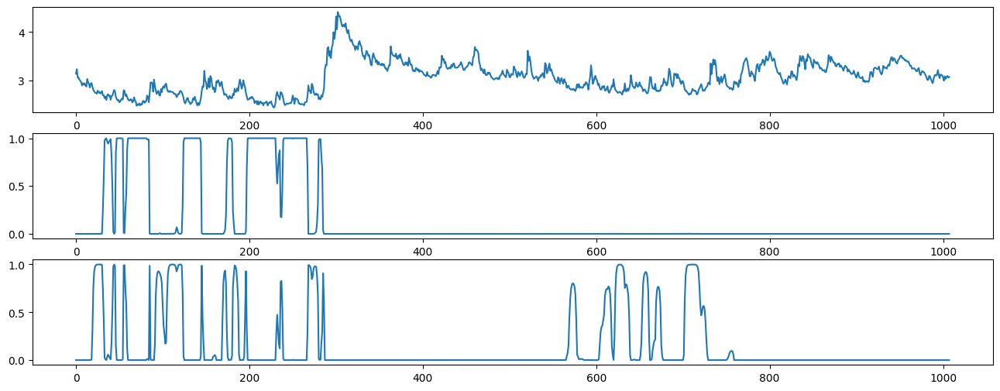


ite=19, max(diff) = 301.51014154766625

mu_hat0 = [2.58875538 2.7789367  3.20147613], 
sigma_hat0 = [0.06552462 0.05488169 0.2664636 ], 
P_hat0 = 
[[9.42371831e-01 5.76280048e-02 1.64600775e-07]
 [5.96547410e-02 8.63125651e-01 7.72196083e-02]
 [6.62682285e-43 1.50957332e-02 9.84904267e-01]], 
pi_hat0 = [1.4821969e-323 1.8828865e-081 1.0000000e+000]



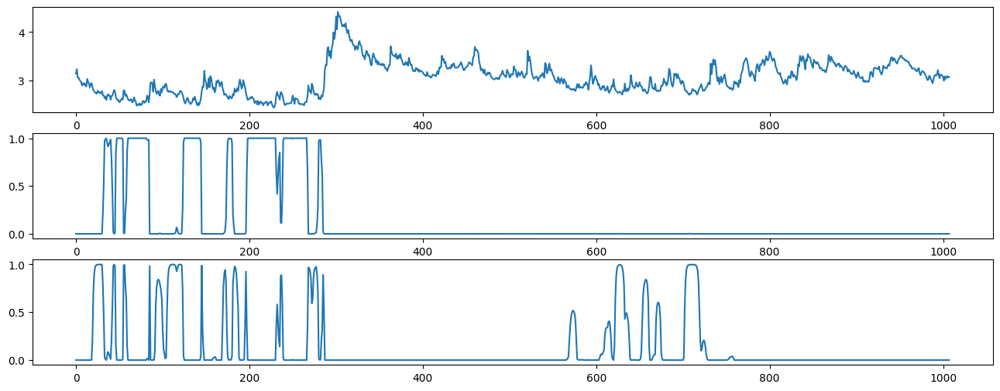


ite=20, max(diff) = 407.85201034952337

mu_hat0 = [2.58761798 2.76949303 3.19143808], 
sigma_hat0 = [0.06470315 0.05053297 0.2697543 ], 
P_hat0 = 
[[9.40644804e-01 5.93549776e-02 2.18359169e-07]
 [7.01828246e-02 8.45681016e-01 8.41361590e-02]
 [2.06952230e-43 1.38747936e-02 9.86125206e-01]], 
pi_hat0 = [0.00000000e+00 3.29154862e-92 1.00000000e+00]



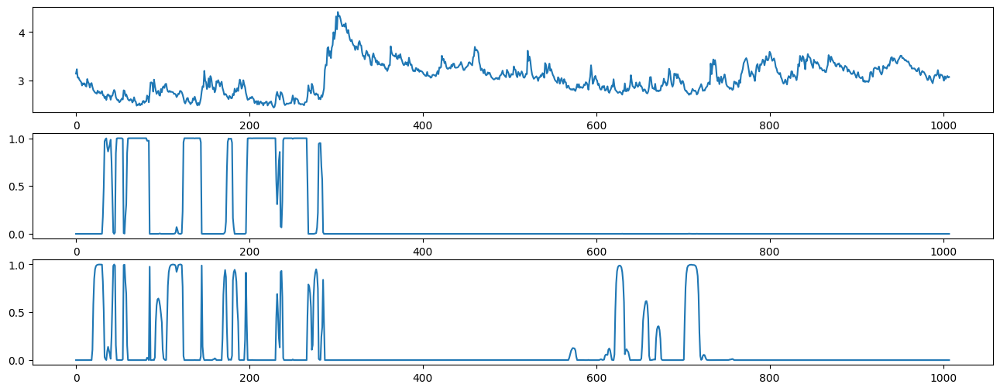


ite=21, max(diff) = 465.21436736497236

mu_hat0 = [2.58634108 2.7596427  3.18138287], 
sigma_hat0 = [0.06381419 0.04480239 0.27313167], 
P_hat0 = 
[[9.38677734e-01 6.13218214e-02 4.44549063e-07]
 [8.46812140e-02 8.26141912e-01 8.91768738e-02]
 [7.26157415e-44 1.21202495e-02 9.87879751e-01]], 
pi_hat0 = [0.00000000e+000 2.90668921e-105 1.00000000e+000]



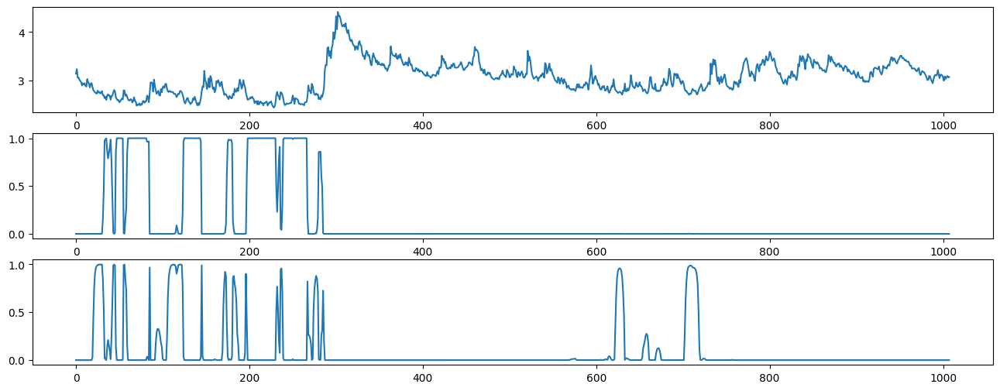


ite=22, max(diff) = 400.9476726093415

mu_hat0 = [2.58507765 2.75284143 3.17319076], 
sigma_hat0 = [0.0630081  0.04065171 0.27612833], 
P_hat0 = 
[[9.36859337e-01 6.31388765e-02 1.78623642e-06]
 [1.00335186e-01 8.09758834e-01 8.99059804e-02]
 [2.96133348e-44 1.02743410e-02 9.89725659e-01]], 
pi_hat0 = [0.00000000e+000 2.27348508e-122 1.00000000e+000]



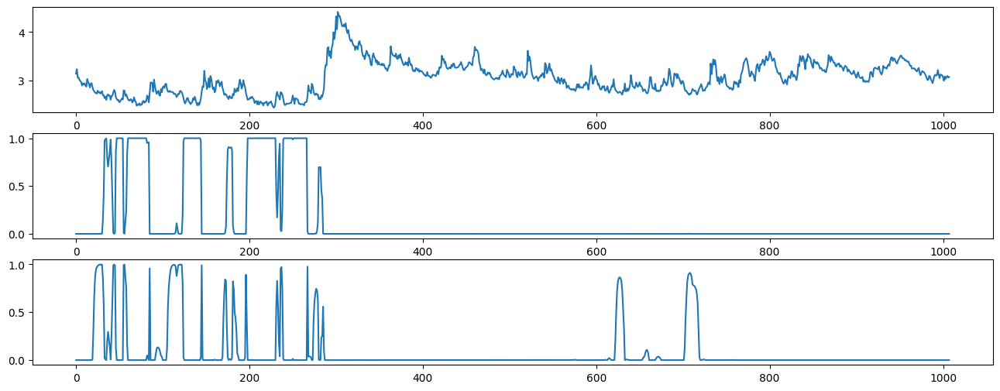


ite=23, max(diff) = 350.44338381175146

mu_hat0 = [2.58367153 2.74879754 3.16633918], 
sigma_hat0 = [0.06227123 0.03852299 0.27889265], 
P_hat0 = 
[[9.35997242e-01 6.39936649e-02 9.09303532e-06]
 [1.14488944e-01 7.94417247e-01 9.10938095e-02]
 [1.36550831e-44 8.95585376e-03 9.91044146e-01]], 
pi_hat0 = [0.00000000e+000 1.28214351e-143 1.00000000e+000]



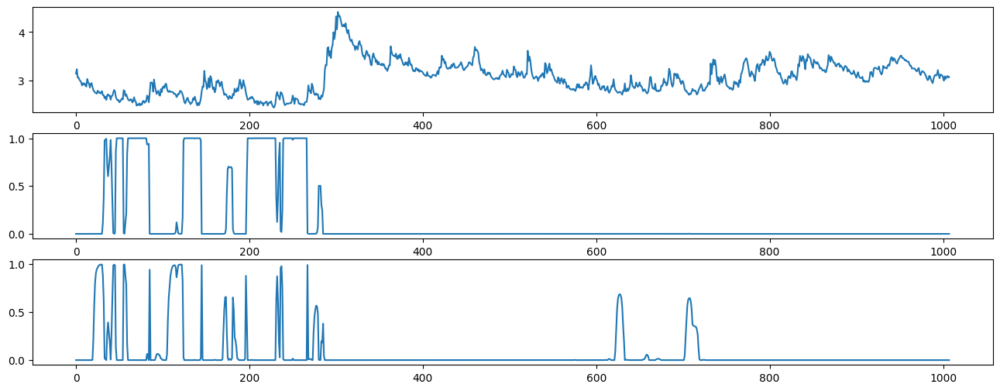


ite=24, max(diff) = 375.00268650881713

mu_hat0 = [2.58173974 2.74561652 3.15879819], 
sigma_hat0 = [0.06141763 0.0376267  0.28206238], 
P_hat0 = 
[[9.36175995e-01 6.37759214e-02 4.80839090e-05]
 [1.30576052e-01 7.77226928e-01 9.21970199e-02]
 [6.76736300e-45 7.61378194e-03 9.92386218e-01]], 
pi_hat0 = [0.00000000e+000 1.26369398e-167 1.00000000e+000]



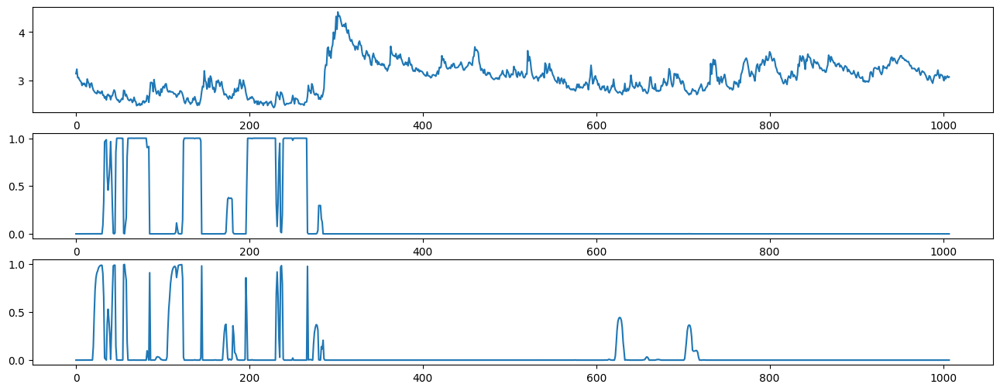


ite=25, max(diff) = 366.6434309256357

mu_hat0 = [2.57890477 2.74292138 3.15140681], 
sigma_hat0 = [0.0601126  0.03766679 0.2852065 ], 
P_hat0 = 
[[9.36781932e-01 6.29685721e-02 2.49496287e-04]
 [1.46593536e-01 7.65718869e-01 8.76875953e-02]
 [3.59449527e-45 6.10644343e-03 9.93893557e-01]], 
pi_hat0 = [0.00000000e+000 4.01468179e-193 1.00000000e+000]



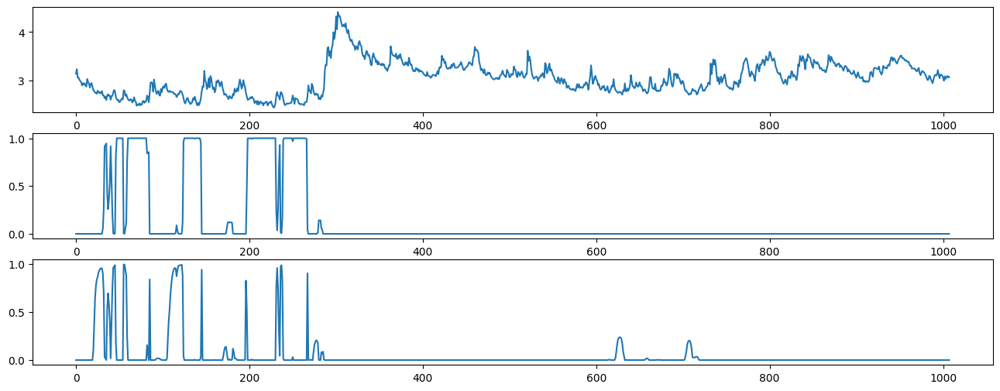


ite=26, max(diff) = 259.8303758059886

mu_hat0 = [2.57573956 2.74056888 3.14611666], 
sigma_hat0 = [0.05833662 0.03860952 0.28744224], 
P_hat0 = 
[[9.36789906e-01 6.19627540e-02 1.24733987e-03]
 [1.57459364e-01 7.64470314e-01 7.80703220e-02]
 [2.19418998e-45 4.98657122e-03 9.95013429e-01]], 
pi_hat0 = [0.00000000e+000 6.37179613e-219 1.00000000e+000]



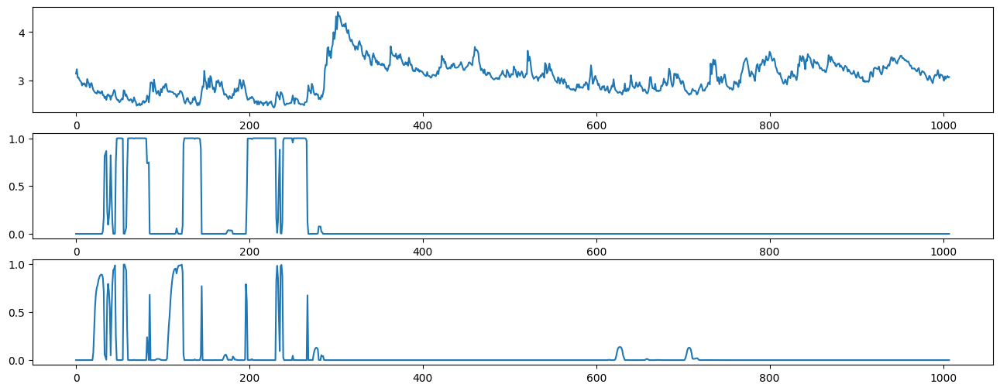


ite=27, max(diff) = 375.4311294062501

mu_hat0 = [2.57310594 2.7380588  3.1430844 ], 
sigma_hat0 = [0.05659583 0.0399023  0.28870012], 
P_hat0 = 
[[9.36545341e-01 5.82041716e-02 5.25048781e-03]
 [1.61385889e-01 7.74807733e-01 6.38063787e-02]
 [1.55126006e-45 4.48210602e-03 9.95517894e-01]], 
pi_hat0 = [0.00000000e+000 7.43162491e-244 1.00000000e+000]



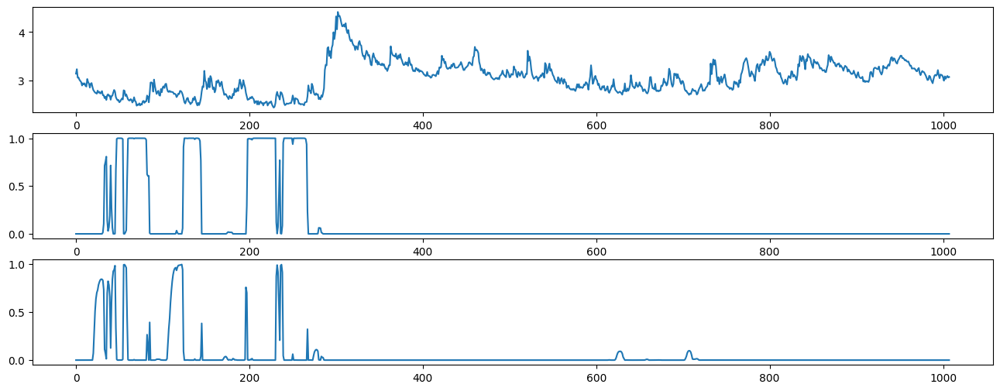


ite=28, max(diff) = 701.1032654077762

mu_hat0 = [2.57122376 2.73551905 3.14121457], 
sigma_hat0 = [0.05534819 0.04142976 0.28948303], 
P_hat0 = 
[[9.37071947e-01 4.88813056e-02 1.40467471e-02]
 [1.60010061e-01 8.00325431e-01 3.96645081e-02]
 [1.12902825e-45 4.26750751e-03 9.95732492e-01]], 
pi_hat0 = [0.00000000e+000 1.23386867e-267 1.00000000e+000]



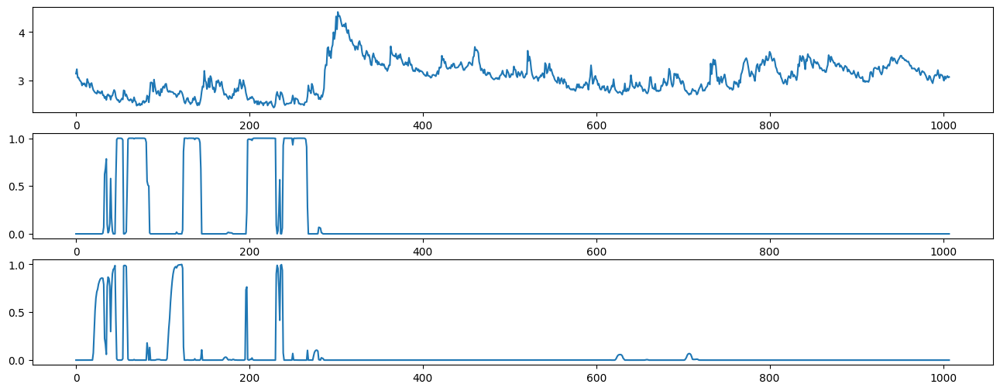


ite=29, max(diff) = 834.3837107072729

mu_hat0 = [2.56985229 2.73272017 3.14049264], 
sigma_hat0 = [0.05451158 0.0436122  0.2897958 ], 
P_hat0 = 
[[9.38847942e-01 3.91021219e-02 2.20499356e-02]
 [1.50813721e-01 8.32092238e-01 1.70940418e-02]
 [7.57820096e-46 4.09431201e-03 9.95905688e-01]], 
pi_hat0 = [0.00000000e+000 3.00174311e-290 1.00000000e+000]



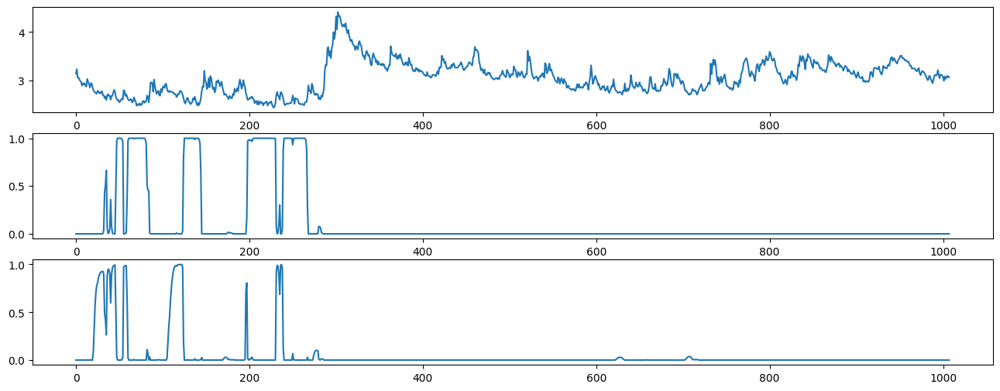


ite=30, max(diff) = 774.0274593609056

mu_hat0 = [2.56846896 2.72898792 3.14086605], 
sigma_hat0 = [0.05378077 0.04668417 0.28965653], 
P_hat0 = 
[[9.42731145e-01 3.15704575e-02 2.56983971e-02]
 [1.30866105e-01 8.63102840e-01 6.03105482e-03]
 [4.52158836e-46 3.93520588e-03 9.96064794e-01]], 
pi_hat0 = [0.00000000e+000 2.01995989e-311 1.00000000e+000]



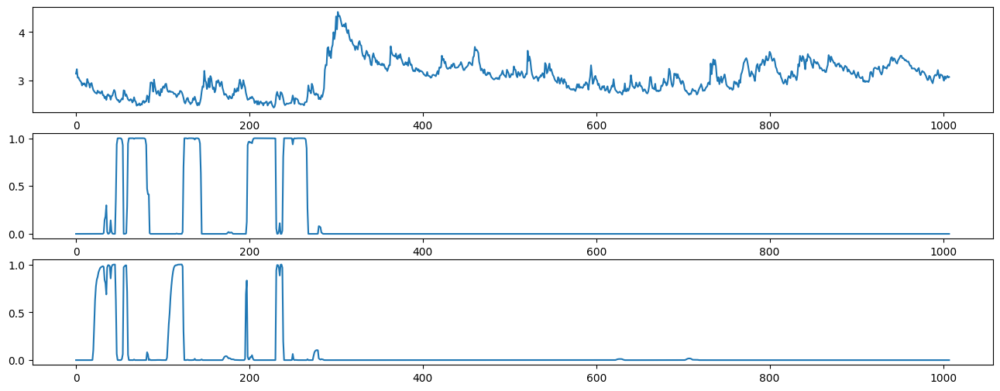


ite=31, max(diff) = 658.9689918622071

mu_hat0 = [2.56684613 2.7249825  3.1412886 ], 
sigma_hat0 = [0.05301269 0.04970467 0.2895066 ], 
P_hat0 = 
[[9.48125213e-01 2.45816408e-02 2.72931465e-02]
 [1.08687966e-01 8.88989451e-01 2.32258262e-03]
 [2.53935772e-46 3.86218389e-03 9.96137816e-01]], 
pi_hat0 = [0. 0. 1.]



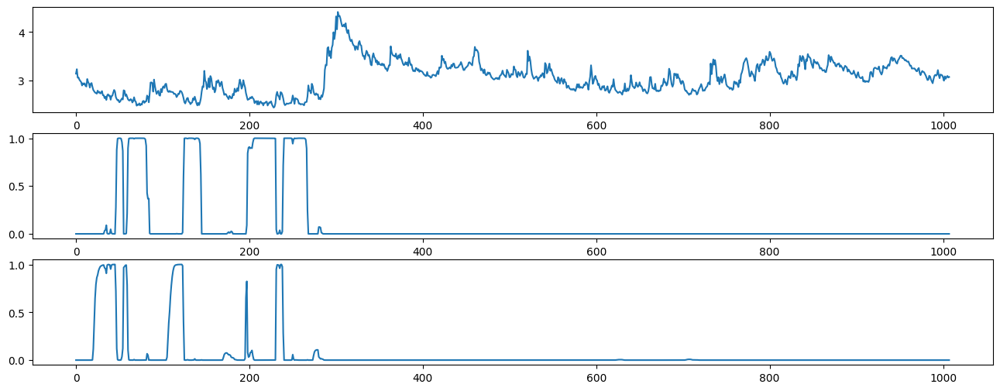


ite=32, max(diff) = 299.4871286490288

mu_hat0 = [2.56562784 2.72232564 3.14139857], 
sigma_hat0 = [0.0524618  0.05142993 0.28948913], 
P_hat0 = 
[[9.50587128e-01 2.12060906e-02 2.82067815e-02]
 [9.78584599e-02 9.00572244e-01 1.56929595e-03]
 [1.38791406e-46 3.87819687e-03 9.96121803e-01]], 
pi_hat0 = [0. 0. 1.]



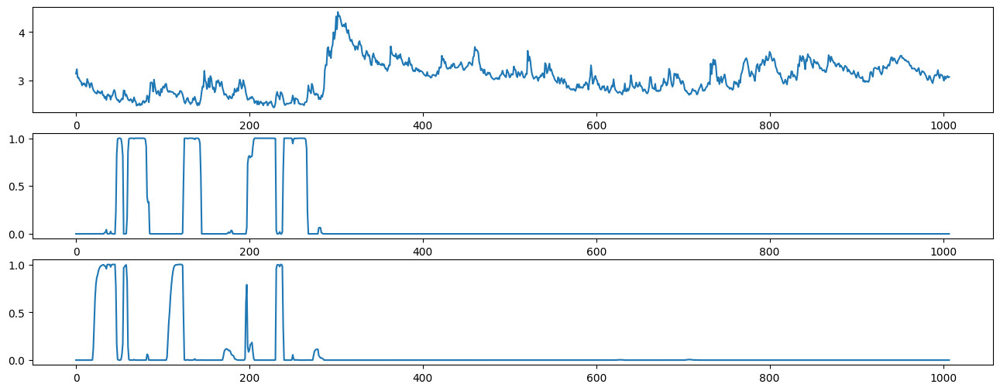


ite=33, max(diff) = 87.44222537361584

mu_hat0 = [2.56476814 2.72046744 3.1414528 ], 
sigma_hat0 = [0.05208363 0.05239328 0.28948136], 
P_hat0 = 
[[9.50629466e-01 2.05997702e-02 2.87707639e-02]
 [9.41484335e-02 9.03947380e-01 1.90418676e-03]
 [6.93221682e-47 3.93396139e-03 9.96066039e-01]], 
pi_hat0 = [0. 0. 1.]



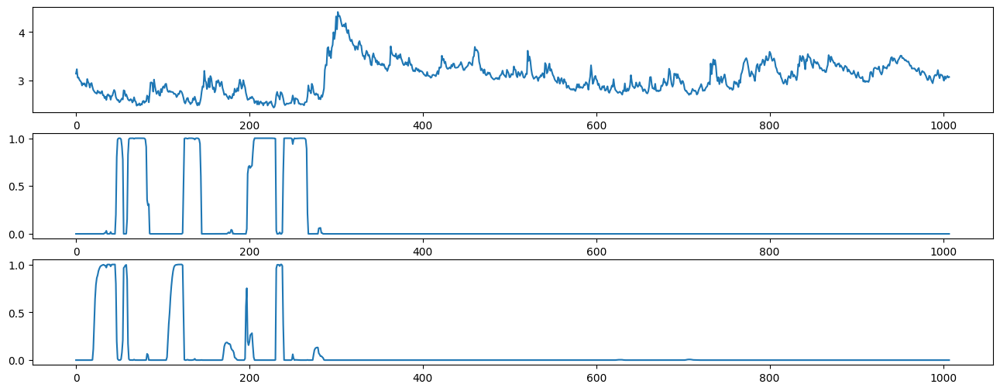


ite=34, max(diff) = 66.6481540171072

mu_hat0 = [2.56401663 2.71860257 3.14177442], 
sigma_hat0 = [0.05174692 0.05312799 0.28933661], 
P_hat0 = 
[[9.50054548e-01 2.08063635e-02 2.91390889e-02]
 [9.15038940e-02 9.05230052e-01 3.26605410e-03]
 [2.97725146e-47 4.04691145e-03 9.95953089e-01]], 
pi_hat0 = [0. 0. 1.]



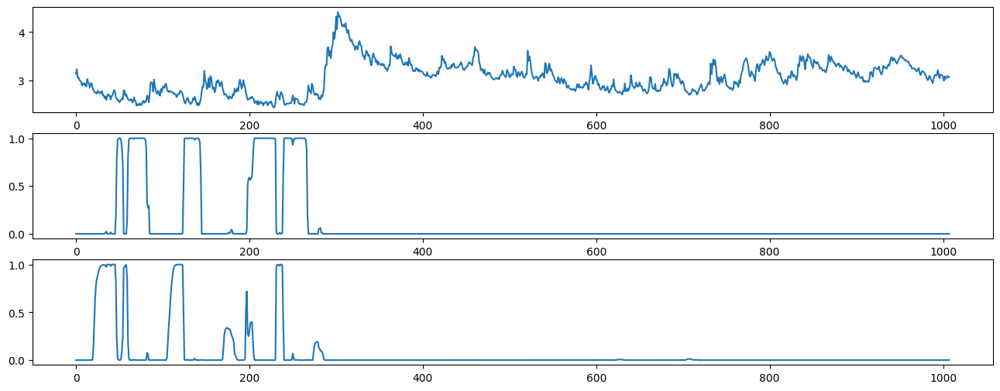


ite=35, max(diff) = 111.15328260267083

mu_hat0 = [2.56319781 2.71603594 3.14291745], 
sigma_hat0 = [0.05137346 0.05383126 0.28879725], 
P_hat0 = 
[[9.49339958e-01 2.12996160e-02 2.93604258e-02]
 [8.69410382e-02 9.06211486e-01 6.84747629e-03]
 [1.02951351e-47 4.32713028e-03 9.95672870e-01]], 
pi_hat0 = [0. 0. 1.]



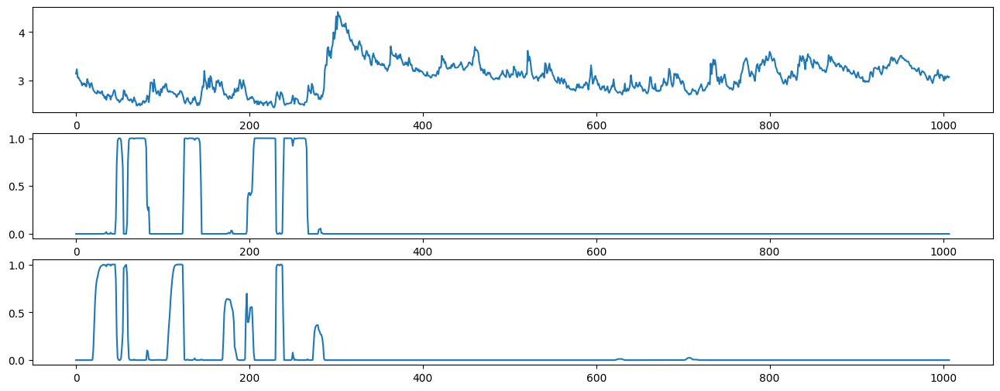


ite=36, max(diff) = 202.09019847104003

mu_hat0 = [2.56212051 2.71214898 3.1458399 ], 
sigma_hat0 = [0.05087198 0.0544521  0.28738454], 
P_hat0 = 
[[9.48647978e-01 2.21076222e-02 2.92444001e-02]
 [7.82926804e-02 9.07353602e-01 1.43537173e-02]
 [2.46216114e-48 4.97527611e-03 9.95024724e-01]], 
pi_hat0 = [0. 0. 1.]



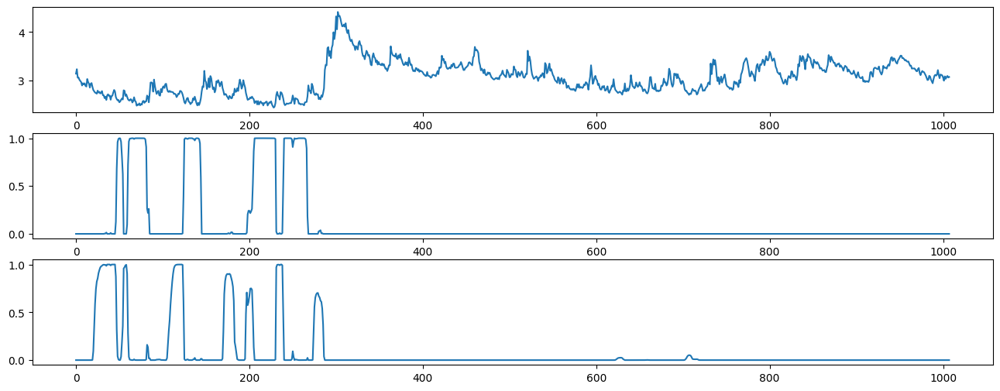


ite=37, max(diff) = 229.90416352926655

mu_hat0 = [2.56072252 2.70802133 3.14966512], 
sigma_hat0 = [0.05019334 0.05482565 0.28546309], 
P_hat0 = 
[[9.48135677e-01 2.33869700e-02 2.84773526e-02]
 [6.89208782e-02 9.08208948e-01 2.28701735e-02]
 [3.03898701e-49 5.81933432e-03 9.94180666e-01]], 
pi_hat0 = [0. 0. 1.]



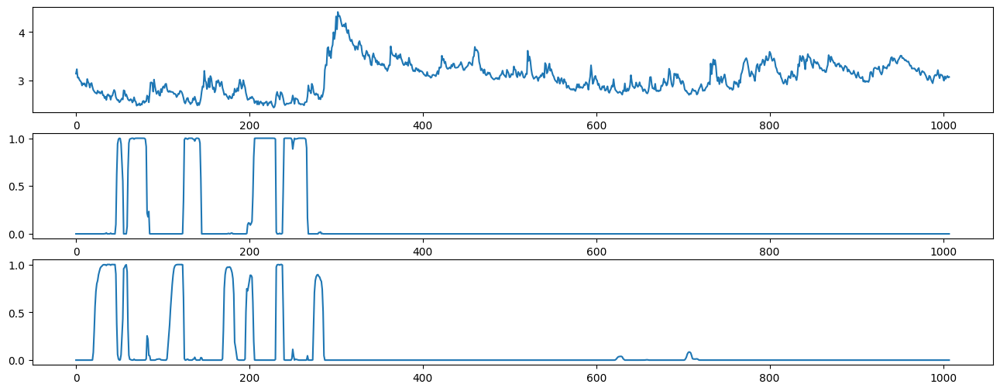


ite=38, max(diff) = 135.46201930316911

mu_hat0 = [2.55947708 2.70542519 3.1514939 ], 
sigma_hat0 = [0.04953984 0.05509383 0.28448948], 
P_hat0 = 
[[9.47572748e-01 2.51039832e-02 2.73232688e-02]
 [6.45314024e-02 9.07969944e-01 2.74986538e-02]
 [1.70750817e-50 6.24694167e-03 9.93753058e-01]], 
pi_hat0 = [0. 0. 1.]



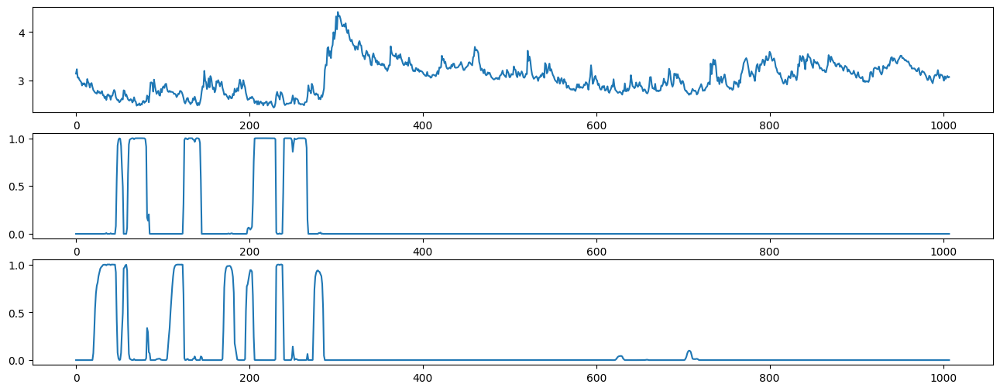


ite=39, max(diff) = 76.10330493515876

mu_hat0 = [2.55868755 2.70404593 3.15187403], 
sigma_hat0 = [0.04908523 0.05529197 0.28425238], 
P_hat0 = 
[[9.46811988e-01 2.68484144e-02 2.63395979e-02]
 [6.35300142e-02 9.07016922e-01 2.94530639e-02]
 [5.89236276e-52 6.35326574e-03 9.93646734e-01]], 
pi_hat0 = [0. 0. 1.]



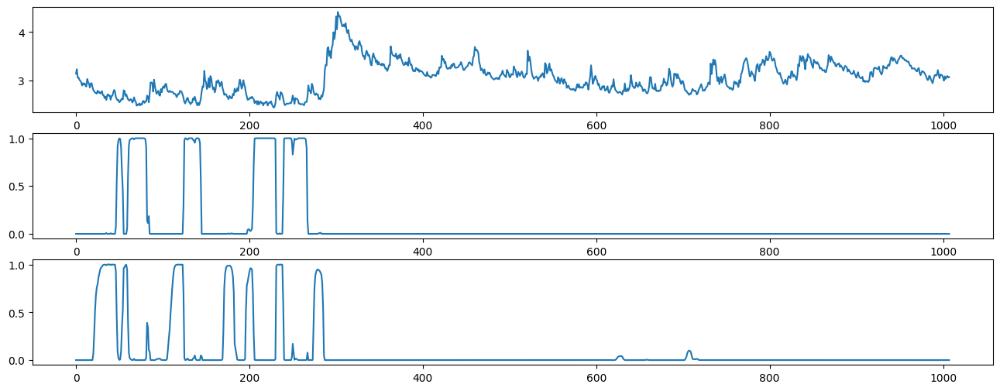


ite=40, max(diff) = 48.577881766563614

mu_hat0 = [2.55822302 2.7032438  3.1518923 ], 
sigma_hat0 = [0.04880091 0.05541625 0.28420982], 
P_hat0 = 
[[9.46068395e-01 2.82727080e-02 2.56588969e-02]
 [6.35857098e-02 9.06027370e-01 3.03869205e-02]
 [1.63319467e-53 6.36831401e-03 9.93631686e-01]], 
pi_hat0 = [0. 0. 1.]



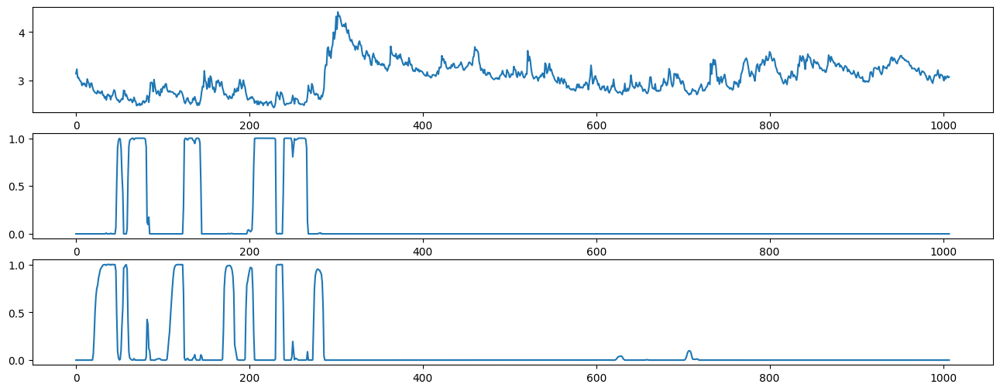


ite=41, max(diff) = 37.13036362363046

mu_hat0 = [2.55793934 2.70273915 3.15185489], 
sigma_hat0 = [0.04862191 0.05549223 0.28420478], 
P_hat0 = 
[[9.45472784e-01 2.93247011e-02 2.52025150e-02]
 [6.38526751e-02 9.05225488e-01 3.09218373e-02]
 [4.08435363e-55 6.36567107e-03 9.93634329e-01]], 
pi_hat0 = [0. 0. 1.]



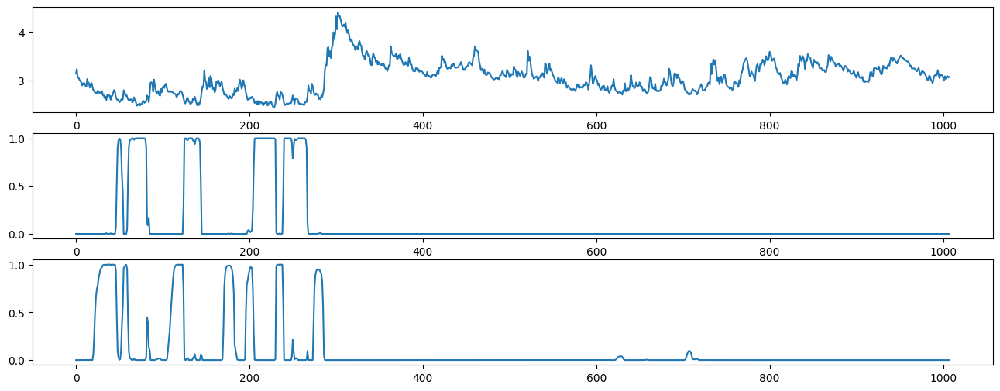


ite=42, max(diff) = 27.01418721221419

mu_hat0 = [2.55775785 2.70240893 3.15181943], 
sigma_hat0 = [0.04850557 0.05554026 0.28420598], 
P_hat0 = 
[[9.45033617e-01 3.00736143e-02 2.48927685e-02]
 [6.41064869e-02 9.04628087e-01 3.12654265e-02]
 [9.67300636e-57 6.36127588e-03 9.93638724e-01]], 
pi_hat0 = [0. 0. 1.]



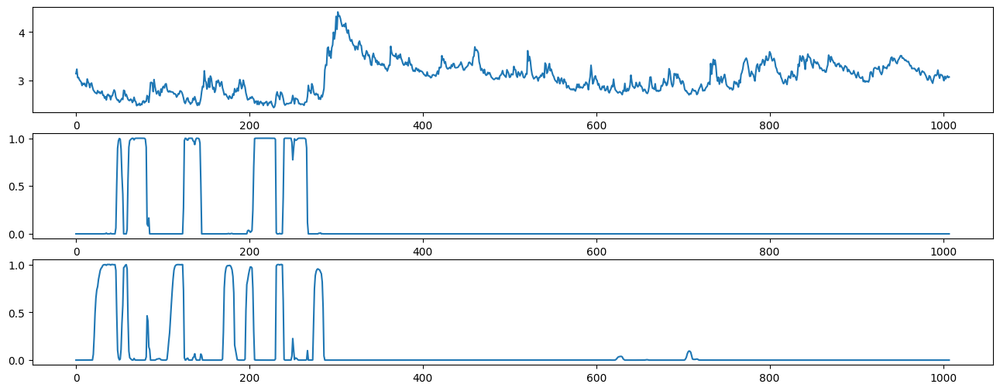


ite=43, max(diff) = 19.222869216747515

mu_hat0 = [2.5576377  2.70218811 3.15179345], 
sigma_hat0 = [0.04842787 0.05557184 0.28420761], 
P_hat0 = 
[[9.44719701e-01 3.06008845e-02 2.46794149e-02]
 [6.43042890e-02 9.04197676e-01 3.14980353e-02]
 [2.21934632e-58 6.35781358e-03 9.93642186e-01]], 
pi_hat0 = [0. 0. 1.]



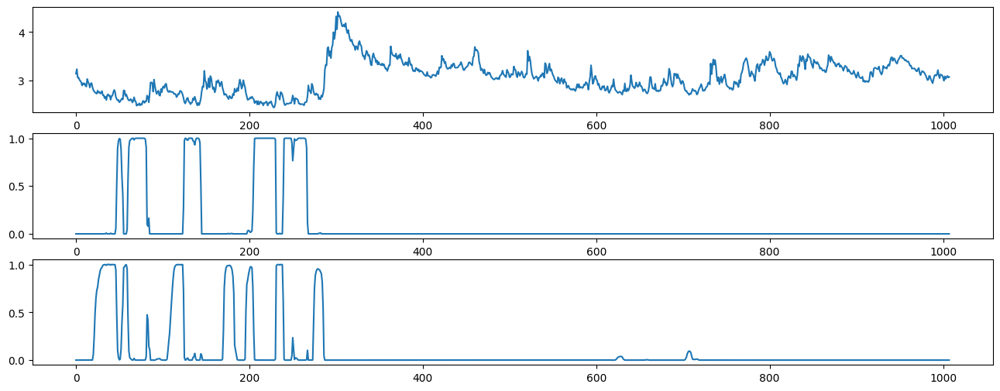


ite=44, max(diff) = 13.575785662899861

mu_hat0 = [2.55755639 2.70203836 3.15177561], 
sigma_hat0 = [0.04837499 0.05559323 0.28420875], 
P_hat0 = 
[[9.44497674e-01 3.09713756e-02 2.45309502e-02]
 [6.44491449e-02 9.03891794e-01 3.16590614e-02]
 [4.99267237e-60 6.35539729e-03 9.93644603e-01]], 
pi_hat0 = [0. 0. 1.]



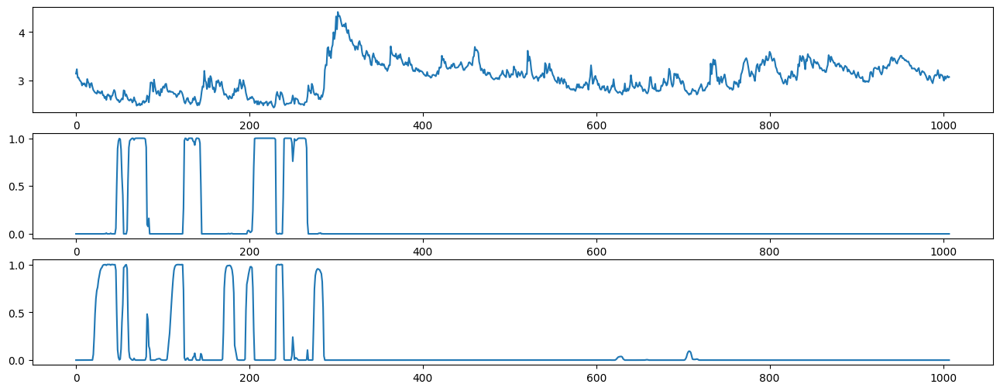


ite=45, max(diff) = 9.567668397234023

mu_hat0 = [2.55750057 2.70193578 3.1517636 ], 
sigma_hat0 = [0.04833856 0.05560799 0.28420942], 
P_hat0 = 
[[9.44341121e-01 3.12318990e-02 2.44269804e-02]
 [6.45527693e-02 9.03675571e-01 3.17716592e-02]
 [1.10891687e-61 6.35375952e-03 9.93646240e-01]], 
pi_hat0 = [0. 0. 1.]



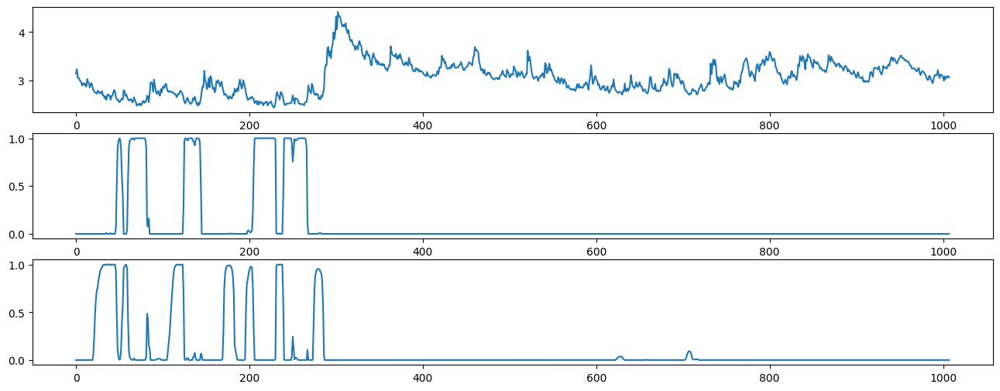


ite=46, max(diff) = 6.741888754935709

mu_hat0 = [2.5574619  2.70186498 3.15175553], 
sigma_hat0 = [0.04831327 0.05561829 0.28420978], 
P_hat0 = 
[[9.44230791e-01 3.14153232e-02 2.43538856e-02]
 [6.46262023e-02 9.03523007e-01 3.18507910e-02]
 [2.44216286e-63 6.35265406e-03 9.93647346e-01]], 
pi_hat0 = [0. 0. 1.]



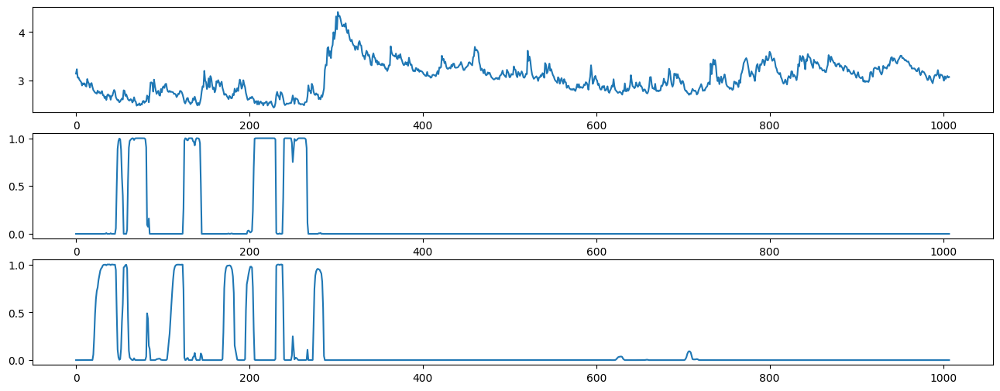


ite=47, max(diff) = 4.752700541719376

mu_hat0 = [2.55743494 2.70181584 3.15175009], 
sigma_hat0 = [0.04829561 0.05562551 0.28420995], 
P_hat0 = 
[[9.44153021e-01 3.15446037e-02 2.43023752e-02]
 [6.46780430e-02 9.03415401e-01 3.19065559e-02]
 [5.34746259e-65 6.35190515e-03 9.93648095e-01]], 
pi_hat0 = [0. 0. 1.]



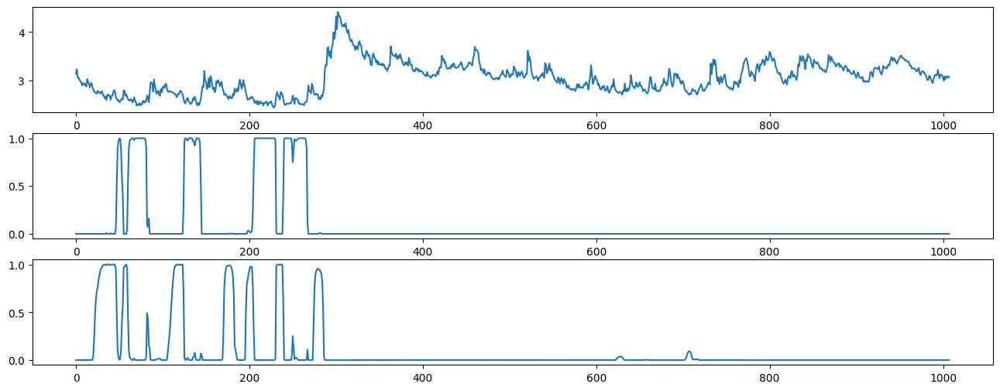


ite=48, max(diff) = 3.3520779695933243

mu_hat0 = [2.55741609 2.70178159 3.15174641], 
sigma_hat0 = [0.04828324 0.0556306  0.28421003], 
P_hat0 = 
[[9.44098182e-01 3.16357931e-02 2.42660246e-02]
 [6.47145889e-02 9.03339497e-01 3.19459141e-02]
 [1.16628034e-66 6.35139476e-03 9.93648605e-01]], 
pi_hat0 = [0. 0. 1.]



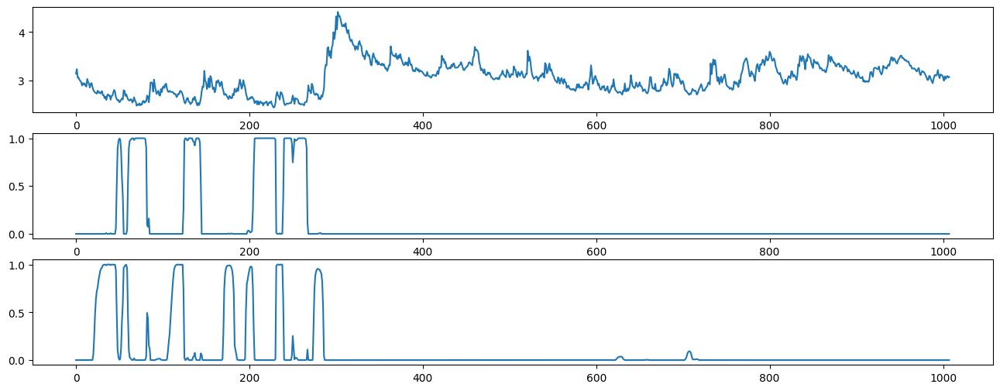


ite=49, max(diff) = 2.3651793253442586

mu_hat0 = [2.55740285 2.70175764 3.1517439 ], 
sigma_hat0 = [0.04827455 0.05563418 0.28421005], 
P_hat0 = 
[[9.44059501e-01 3.17001468e-02 2.42403521e-02]
 [6.47403428e-02 9.03285942e-01 3.19737155e-02]
 [2.53669913e-68 6.35104477e-03 9.93648955e-01]], 
pi_hat0 = [0. 0. 1.]



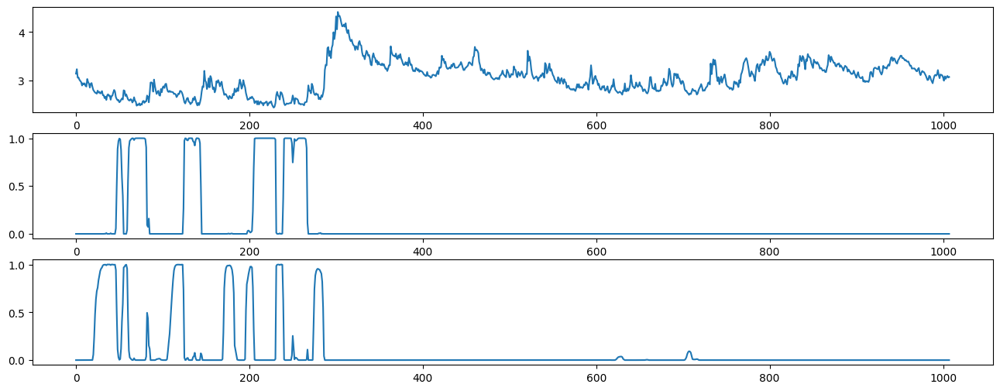


ite=50, max(diff) = 1.669316354363853

mu_hat0 = [2.55739355 2.70174085 3.15174218], 
sigma_hat0 = [0.04826844 0.05563671 0.28421005], 
P_hat0 = 
[[9.44032210e-01 3.17455758e-02 2.42222140e-02]
 [6.47584924e-02 9.03248146e-01 3.19933614e-02]
 [5.50689818e-70 6.35080341e-03 9.93649197e-01]], 
pi_hat0 = [0. 0. 1.]



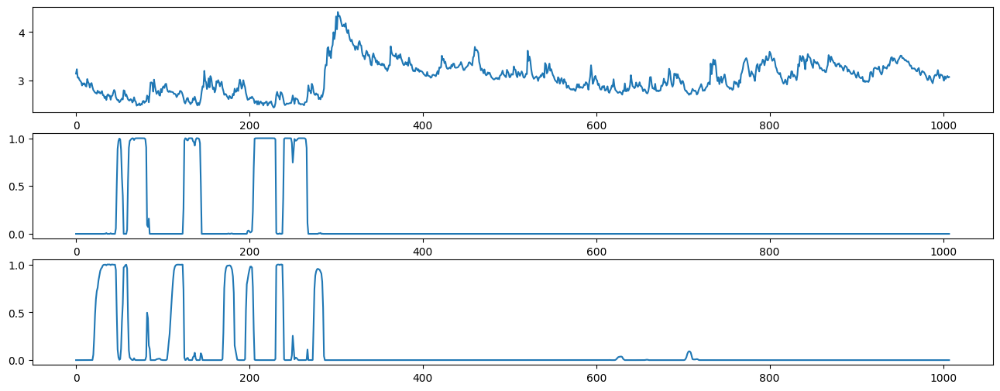


ite=51, max(diff) = 1.1783995257156827

mu_hat0 = [2.55738701 2.70172906 3.15174099], 
sigma_hat0 = [0.04826414 0.0556385  0.28421004], 
P_hat0 = 
[[9.44012952e-01 3.17776505e-02 2.42093972e-02]
 [6.47712857e-02 9.03221468e-01 3.20072461e-02]
 [1.19389580e-71 6.35063616e-03 9.93649364e-01]], 
pi_hat0 = [0. 0. 1.]



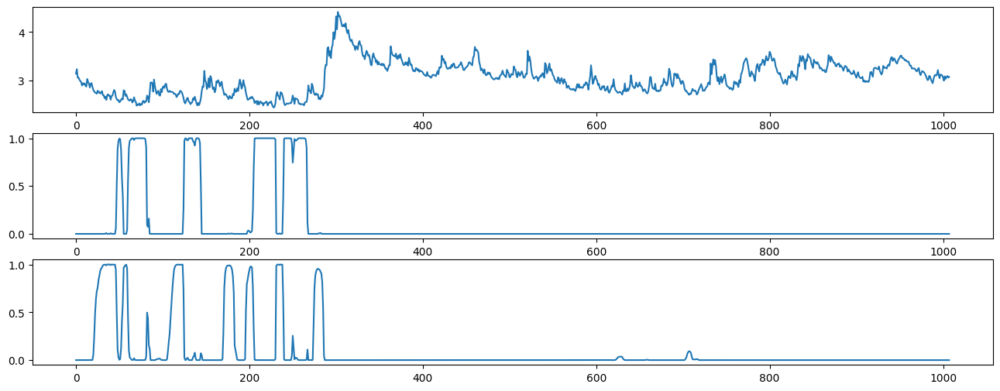


ite=52, max(diff) = 0.831939600014547

mu_hat0 = [2.5573824  2.70172077 3.15174017], 
sigma_hat0 = [0.04826111 0.05563976 0.28421003], 
P_hat0 = 
[[9.43999361e-01 3.18002982e-02 2.42003405e-02]
 [6.47803058e-02 9.03202635e-01 3.20170589e-02]
 [2.58595019e-73 6.35051979e-03 9.93649480e-01]], 
pi_hat0 = [0. 0. 1.]



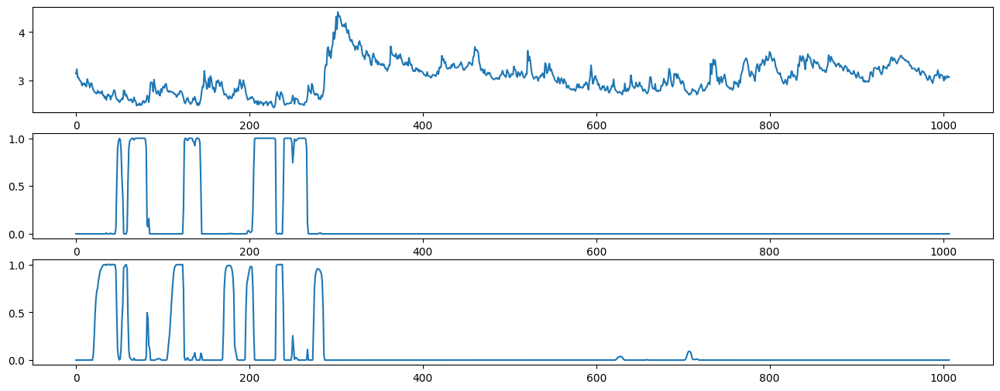


ite=53, max(diff) = 0.5873716921875414

mu_hat0 = [2.55737915 2.70171493 3.15173959], 
sigma_hat0 = [0.04825897 0.05564065 0.28421002], 
P_hat0 = 
[[9.43989769e-01 3.18162899e-02 2.41939413e-02]
 [6.47866669e-02 9.03189340e-01 3.20239934e-02]
 [5.59743397e-75 6.35043856e-03 9.93649561e-01]], 
pi_hat0 = [0. 0. 1.]



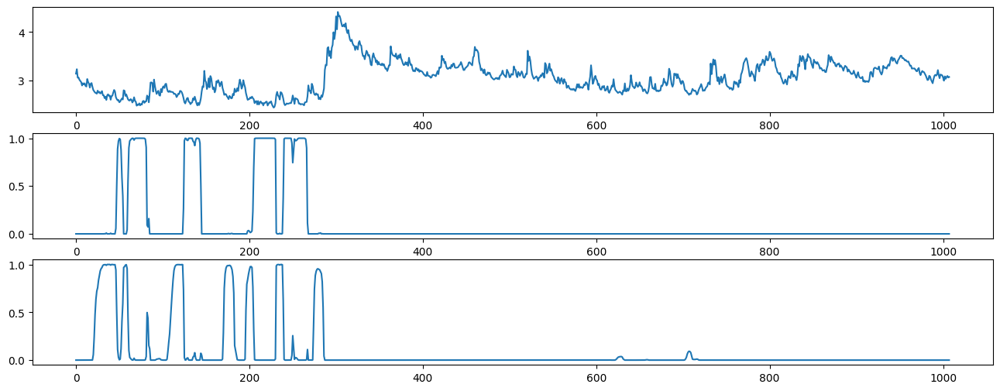


ite=54, max(diff) = 0.4147069253682047

mu_hat0 = [2.55737686 2.70171082 3.15173919], 
sigma_hat0 = [0.04825746 0.05564127 0.28421001], 
P_hat0 = 
[[9.43982998e-01 3.18275816e-02 2.41894203e-02]
 [6.47911539e-02 9.03179953e-01 3.20288932e-02]
 [1.21103701e-76 6.35038171e-03 9.93649618e-01]], 
pi_hat0 = [0. 0. 1.]



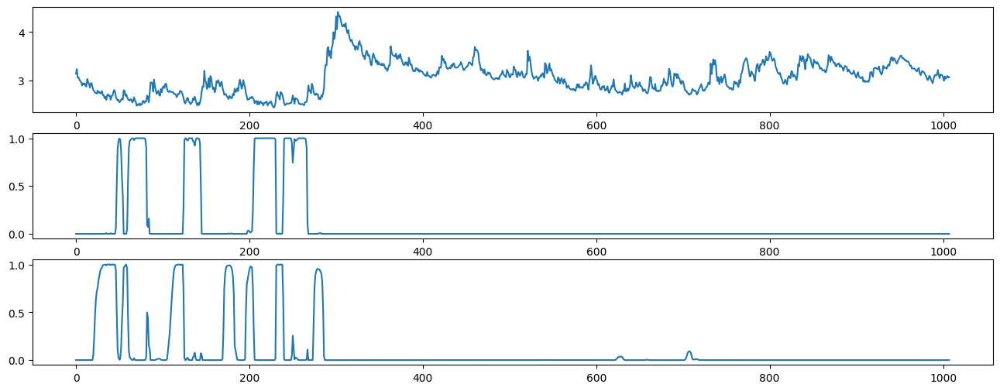


ite=55, max(diff) = 0.2927977886652954

mu_hat0 = [2.55737524 2.70170792 3.15173891], 
sigma_hat0 = [0.0482564  0.05564172 0.28421   ], 
P_hat0 = 
[[9.43978219e-01 3.18355545e-02 2.41862267e-02]
 [6.47943195e-02 9.03173326e-01 3.20323548e-02]
 [2.61929712e-78 6.35034185e-03 9.93649658e-01]], 
pi_hat0 = [0. 0. 1.]



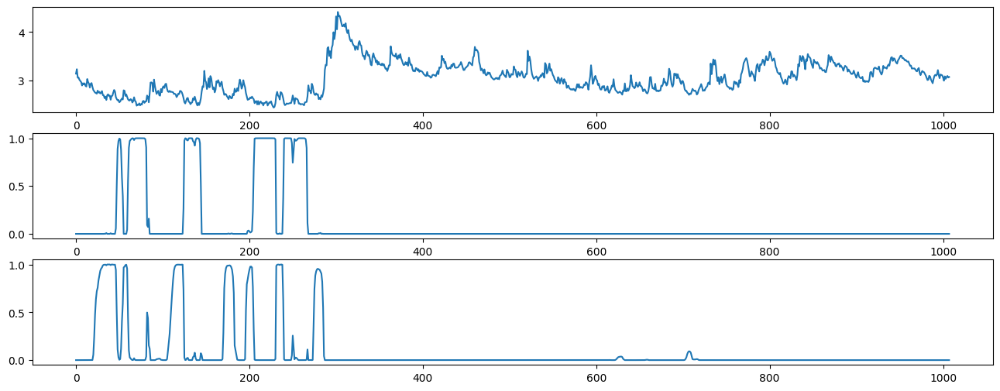


ite=56, max(diff) = 0.2067225330740479

mu_hat0 = [2.5573741  2.70170588 3.15173872], 
sigma_hat0 = [0.04825565 0.05564203 0.28421   ], 
P_hat0 = 
[[9.43974845e-01 3.18411838e-02 2.41839709e-02]
 [6.47965530e-02 9.03168647e-01 3.20348001e-02]
 [5.66386263e-80 6.35031384e-03 9.93649686e-01]], 
pi_hat0 = [0. 0. 1.]



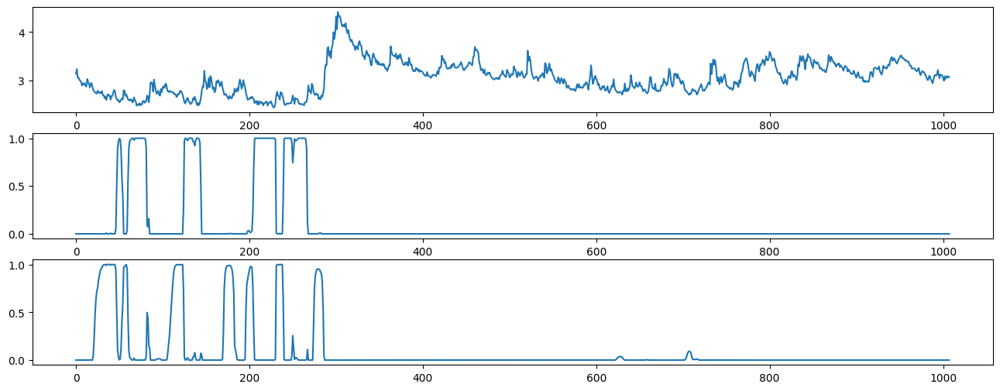


ite=57, max(diff) = 0.14594838834725357

mu_hat0 = [2.5573733  2.70170444 3.15173858], 
sigma_hat0 = [0.04825512 0.05564225 0.28420999], 
P_hat0 = 
[[9.43972464e-01 3.18451583e-02 2.41823777e-02]
 [6.47981292e-02 9.03165344e-01 3.20365272e-02]
 [1.22453325e-81 6.35029415e-03 9.93649706e-01]], 
pi_hat0 = [0. 0. 1.]



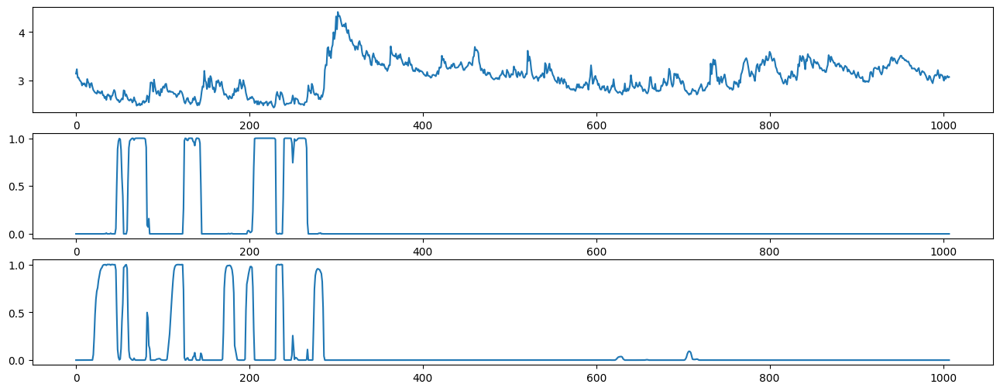


ite=58, max(diff) = 0.10303903720283204

mu_hat0 = [2.55737273 2.70170342 3.15173848], 
sigma_hat0 = [0.04825474 0.05564241 0.28420999], 
P_hat0 = 
[[9.43970783e-01 3.18479643e-02 2.41812527e-02]
 [6.47992415e-02 9.03163012e-01 3.20377469e-02]
 [2.64715294e-83 6.35028029e-03 9.93649720e-01]], 
pi_hat0 = [0. 0. 1.]



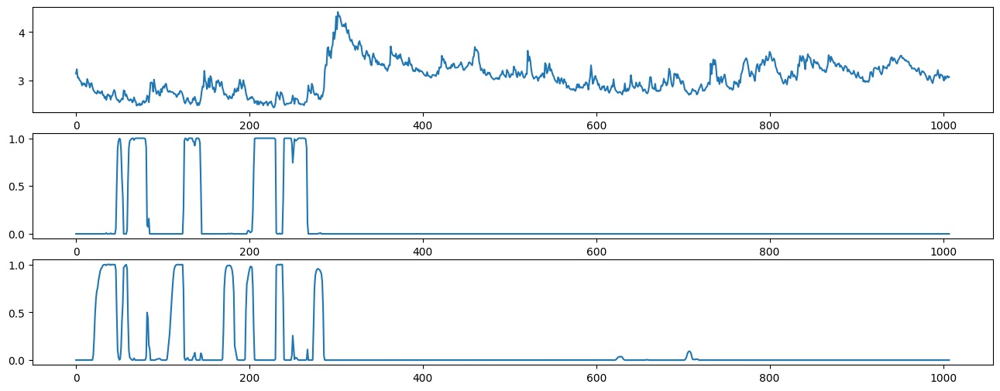


ite=59, max(diff) = 0.07274375704844661

mu_hat0 = [2.55737233 2.7017027  3.15173841], 
sigma_hat0 = [0.04825448 0.05564252 0.28420999], 
P_hat0 = 
[[9.43969596e-01 3.18499454e-02 2.41804582e-02]
 [6.48000266e-02 9.03161365e-01 3.20386082e-02]
 [5.72206288e-85 6.35027053e-03 9.93649729e-01]], 
pi_hat0 = [0. 0. 1.]



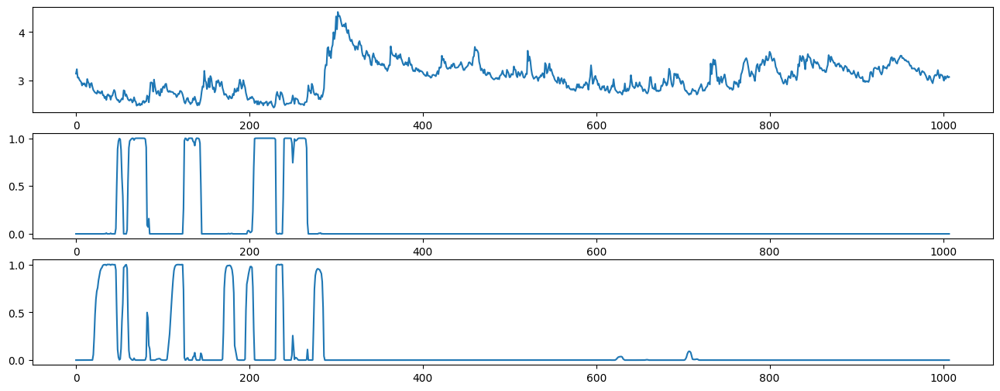


ite=60, max(diff) = 0.051354913703973576

mu_hat0 = [2.55737204 2.7017022  3.15173836], 
sigma_hat0 = [0.04825429 0.0556426  0.28420998], 
P_hat0 = 
[[9.43968759e-01 3.18513440e-02 2.41798973e-02]
 [6.48005807e-02 9.03160203e-01 3.20392164e-02]
 [1.23680611e-86 6.35026365e-03 9.93649736e-01]], 
pi_hat0 = [0. 0. 1.]



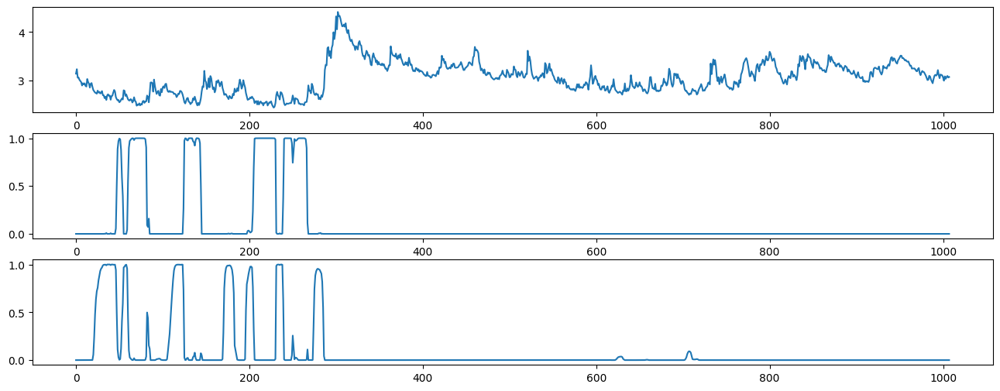


ite=61, max(diff) = 0.036254480251908874

mu_hat0 = [2.55737184 2.70170184 3.15173833], 
sigma_hat0 = [0.04825416 0.05564265 0.28420998], 
P_hat0 = 
[[9.43968167e-01 3.18523313e-02 2.41795013e-02]
 [6.48009718e-02 9.03159382e-01 3.20396458e-02]
 [2.67321115e-88 6.35025880e-03 9.93649741e-01]], 
pi_hat0 = [0. 0. 1.]



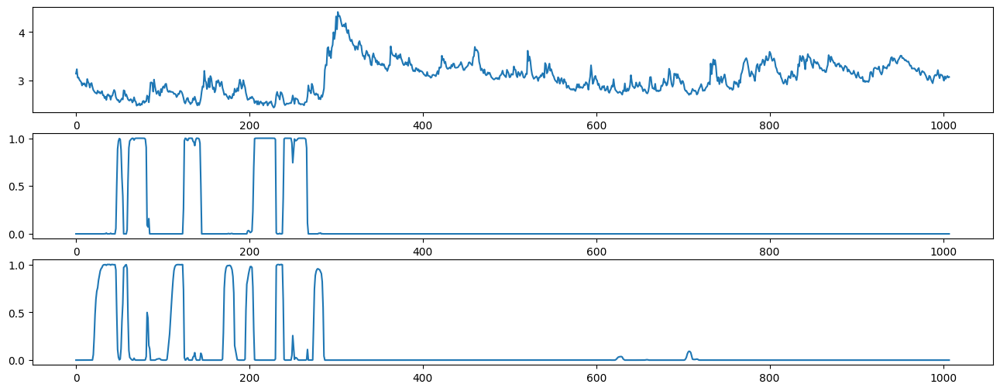


ite=62, max(diff) = 0.025593862813125604

mu_hat0 = [2.5573717  2.70170159 3.15173831], 
sigma_hat0 = [0.04825407 0.05564269 0.28420998], 
P_hat0 = 
[[9.43967750e-01 3.18530284e-02 2.41792216e-02]
 [6.48012478e-02 9.03158803e-01 3.20399490e-02]
 [5.77766900e-90 6.35025538e-03 9.93649745e-01]], 
pi_hat0 = [0. 0. 1.]



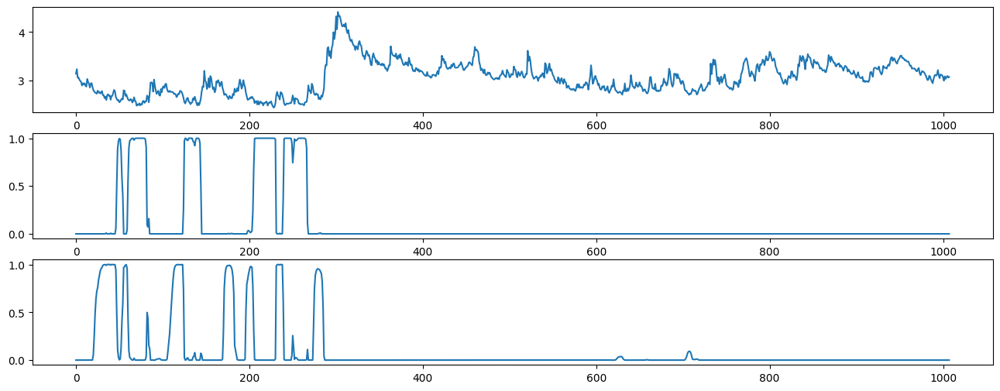


ite=63, max(diff) = 0.018067807595898225

mu_hat0 = [2.5573716  2.70170141 3.15173829], 
sigma_hat0 = [0.048254   0.05564272 0.28420998], 
P_hat0 = 
[[9.43967455e-01 3.18535204e-02 2.41790242e-02]
 [6.48014427e-02 9.03158394e-01 3.20401630e-02]
 [1.24871522e-91 6.35025296e-03 9.93649747e-01]], 
pi_hat0 = [0. 0. 1.]



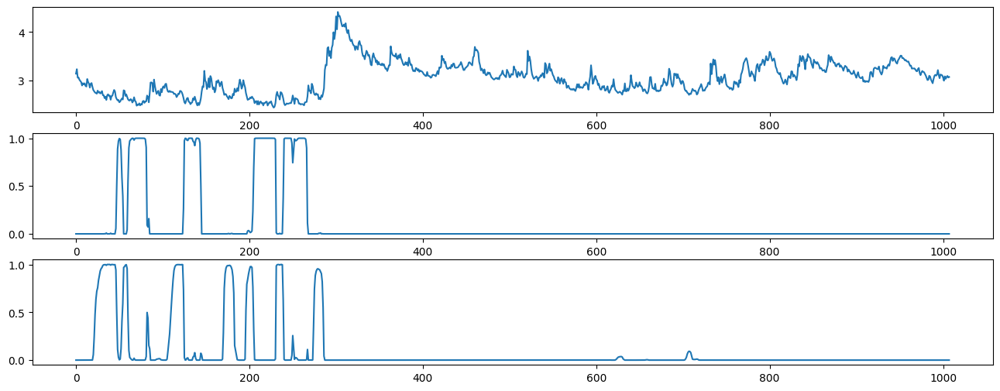


ite=64, max(diff) = 0.012754734253685868

mu_hat0 = [2.55737153 2.70170129 3.15173828], 
sigma_hat0 = [0.04825396 0.05564274 0.28420998], 
P_hat0 = 
[[9.43967247e-01 3.18538678e-02 2.41788849e-02]
 [6.48015803e-02 9.03158106e-01 3.20403141e-02]
 [2.69878355e-93 6.35025126e-03 9.93649749e-01]], 
pi_hat0 = [0. 0. 1.]



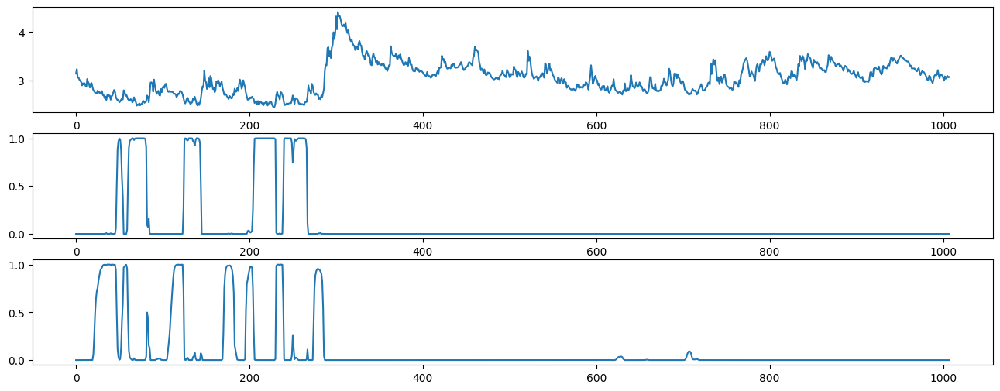


ite=65, max(diff) = 0.009003978531070891

mu_hat1 = [2.55737148 2.7017012  3.15173827], 
sigma_hat1 = [0.04825392 0.05564275 0.28420998], 
P_hat1 = 
[[9.43967101e-01 3.18541130e-02 2.41787865e-02]
 [6.48016774e-02 9.03157902e-01 3.20404208e-02]
 [5.83268329e-95 6.35025006e-03 9.93649750e-01]], 
pi_hat1 = [0. 0. 1.]


In [ ]:


# Initialize parameters
T = len(YData)
N = 3

# SET INITIAL GUESSES

mu_hat0 = [2.5, 3, 3.5] * np.ones((N))
sigma_hat0 = [0.1, 0.1, 0.1] * np.ones((N))
P_hat0 = np.zeros((N, N))

P_hat0[0, 0] = 0.85
P_hat0[0, 1] = (1 - P_hat0[0, 0])/2
P_hat0[0, 2] = (1 - P_hat0[0, 0])/2

P_hat0[1, 1] = 0.90
P_hat0[1, 0] = (1 - P_hat0[1, 1])/2
P_hat0[1, 2] = (1 - P_hat0[1, 1])/2

P_hat0[2, 2] = 0.70
P_hat0[2, 0] = (1 - P_hat0[2, 2])/2
P_hat0[2, 1] = (1 - P_hat0[2, 2])/2



pi_hat0 = [0.5, 0.25, 0.25] * np.ones((N))
for t in range(1, 100):
    pi_hat0 = np.dot(P_hat0.T, pi_hat0)

# Determine maximum number of iterations until convergence and convergence tolerance
itemax = 100
itetol = 1e-2

for ite in range(0, itemax):
    #print(mu_hat0, sigma_hat0, P_hat0, pi_hat0)
    print(f"\nmu_hat0 = {mu_hat0}, \nsigma_hat0 = {sigma_hat0}, \nP_hat0 = \n{P_hat0}, \npi_hat0 = {pi_hat0}")

    # E-step
    xi_prob_t, xi_prob_t1 = forward_alg(
        pi_hat0, N, T, P_hat0, mu_hat0, sigma_hat0, YData
    )
    xi_prob_T = backward_alg(
        xi_prob_t, xi_prob_t1, N, T, P_hat0, mu_hat0, sigma_hat0, YData
    )

    print("")

    plt.subplot(3, 1, 1)
    plt.plot(YData)
    plt.subplot(3, 1, 2)
    plt.plot(xi_prob_T[:, 0])
    plt.subplot(3, 1, 3)
    plt.plot(xi_prob_T[:, 1])
    fig = plt.gcf()
    fig.set_size_inches(16, 6)
    plt.show()
    print("")

    # Compute Pr(s_t+1 = j, s_t = i)
    P_hat_T = np.zeros((N, N, T))
    for tt in range(1, T):
        for ss in range(0, N):
            for ss2 in range(0, N):
                P_hat_T[ss, ss2, tt] = (
                    P_hat0[ss, ss2]
                    * xi_prob_t[tt - 1, ss]
                    * xi_prob_T[tt, ss2]
                    / xi_prob_t1[tt - 1, ss2]
                )
    # M-step
    mu_hat1, sigma_hat1, P_hat1, pi_hat1 = M_step_func(xi_prob_T, P_hat_T, N, T, YData)

    diff = np.zeros((4))
    diff[0] = np.sum(np.absolute(mu_hat1 - mu_hat0)) / (np.min(mu_hat0) + itetol * 1e-2)
    diff[1] = np.sum(np.absolute(sigma_hat1 - sigma_hat0)) / (
        np.min(sigma_hat0) + itetol * 1e-2
    )
    diff[2] = np.sum(np.absolute(np.subtract(P_hat1, P_hat0))) / (
        np.min(P_hat0) + itetol * 1e-2
    )
    diff[3] = np.sum(np.absolute(pi_hat1 - pi_hat0)) / (np.min(pi_hat0) + itetol * 1e-2)

    print(f"ite={ite}, max(diff) = {np.max(diff)}")

    if np.max(diff) > itetol:
        mu_hat0, sigma_hat0, P_hat0, pi_hat0 = mu_hat1, sigma_hat1, P_hat1, pi_hat1
    else:
        print(f"\nmu_hat1 = {mu_hat1}, \nsigma_hat1 = {sigma_hat1}, \nP_hat1 = \n{P_hat1}, \npi_hat1 = {pi_hat1}")
        break

### 3-state model with different mu and same sigma converged, this can be used to detect regime change as well.

## STEP 2.b.ii Same mu same sigma


mu_hat0 = [2. 2.], 
sigma_hat0 = [0.1 0.1], 
P_hat0 = 
[[0.85 0.15]
 [0.1  0.9 ]], 
pi_hat0 = [0.4 0.6]



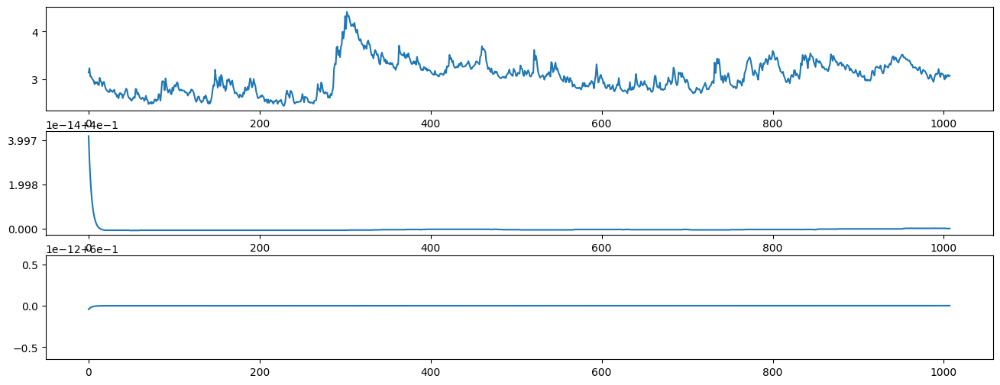


ite=0, max(diff) = 4.607380006428183

mu_hat0 = [3.05382796 3.05382796], 
sigma_hat0 = [0.33059937 0.33059937], 
P_hat0 = 
[[0.85 0.15]
 [0.1  0.9 ]], 
pi_hat0 = [0.4 0.6]



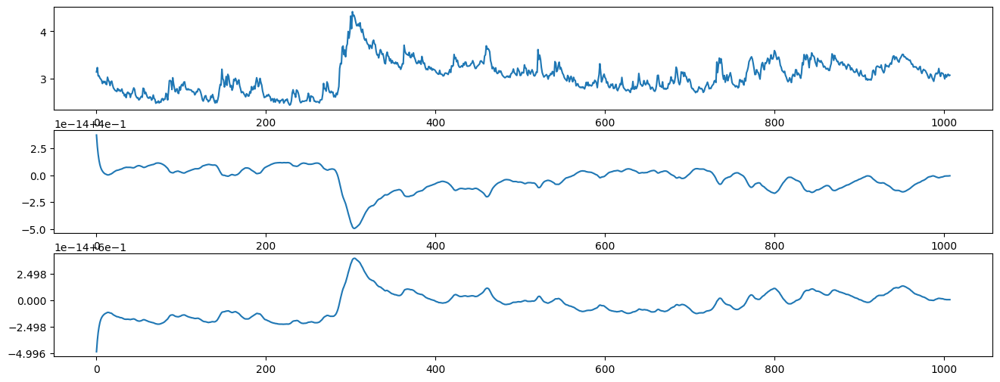


ite=1, max(diff) = 2.3447599495330152e-14

mu_hat1 = [3.05382796 3.05382796], 
sigma_hat1 = [0.33059937 0.33059937], 
P_hat1 = 
[[0.85 0.15]
 [0.1  0.9 ]], 
pi_hat1 = [0.4 0.6]


In [ ]:
#Assume same mu same sigma

# Initialize parameters
T = len(YData)
N = 2

# SET INITIAL GUESSES

mu_hat0 = [2, 2] * np.ones((N))
sigma_hat0 = [0.1, 0.1] * np.ones((N))
P_hat0 = np.zeros((N, N))

P_hat0[0, 0] = 0.85
P_hat0[0, 1] = 1 - P_hat0[0, 0]
P_hat0[1, 1] = 0.90
P_hat0[1, 0] = 1 - P_hat0[1, 1]

pi_hat0 = [0.5, 0.5] * np.ones((N))
for t in range(1, 100):
    pi_hat0 = np.dot(P_hat0.T, pi_hat0)

# Determine maximum number of iterations until convergence and convergence tolerance
itemax = 100
itetol = 1e-2

for ite in range(0, itemax):
    #print(mu_hat0, sigma_hat0, P_hat0, pi_hat0)
    print(f"\nmu_hat0 = {mu_hat0}, \nsigma_hat0 = {sigma_hat0}, \nP_hat0 = \n{P_hat0}, \npi_hat0 = {pi_hat0}")

    # E-step
    xi_prob_t, xi_prob_t1 = forward_alg(
        pi_hat0, N, T, P_hat0, mu_hat0, sigma_hat0, YData
    )
    xi_prob_T = backward_alg(
        xi_prob_t, xi_prob_t1, N, T, P_hat0, mu_hat0, sigma_hat0, YData
    )

    print("")

    plt.subplot(3, 1, 1)
    plt.plot(YData)
    plt.subplot(3, 1, 2)
    plt.plot(xi_prob_T[:, 0])
    plt.subplot(3, 1, 3)
    plt.plot(xi_prob_T[:, 1])
    fig = plt.gcf()
    fig.set_size_inches(16, 6)
    plt.show()
    print("")

    # Compute Pr(s_t+1 = j, s_t = i)
    P_hat_T = np.zeros((N, N, T))
    for tt in range(1, T):
        for ss in range(0, N):
            for ss2 in range(0, N):
                P_hat_T[ss, ss2, tt] = (
                    P_hat0[ss, ss2]
                    * xi_prob_t[tt - 1, ss]
                    * xi_prob_T[tt, ss2]
                    / xi_prob_t1[tt - 1, ss2]
                )
    # M-step
    mu_hat1, sigma_hat1, P_hat1, pi_hat1 = M_step_func(xi_prob_T, P_hat_T, N, T, YData)

    diff = np.zeros((4))
    diff[0] = np.sum(np.absolute(mu_hat1 - mu_hat0)) / (np.min(mu_hat0) + itetol * 1e-2)
    diff[1] = np.sum(np.absolute(sigma_hat1 - sigma_hat0)) / (
        np.min(sigma_hat0) + itetol * 1e-2
    )
    diff[2] = np.sum(np.absolute(np.subtract(P_hat1, P_hat0))) / (
        np.min(P_hat0) + itetol * 1e-2
    )
    diff[3] = np.sum(np.absolute(pi_hat1 - pi_hat0)) / (np.min(pi_hat0) + itetol * 1e-2)

    print(f"ite={ite}, max(diff) = {np.max(diff)}")

    if np.max(diff) > itetol:
        mu_hat0, sigma_hat0, P_hat0, pi_hat0 = mu_hat1, sigma_hat1, P_hat1, pi_hat1
    else:
        print(f"\nmu_hat1 = {mu_hat1}, \nsigma_hat1 = {sigma_hat1}, \nP_hat1 = \n{P_hat1}, \npi_hat1 = {pi_hat1}")
        break

### same mu and same sigma converged but did not behave well, this may not be used for regime change detection.

## STEP 2.b.ii Different mu same sigma


mu_hat0 = [2. 4.], 
sigma_hat0 = [0.1 0.1], 
P_hat0 = 
[[0.85 0.15]
 [0.1  0.9 ]], 
pi_hat0 = [0.4 0.6]



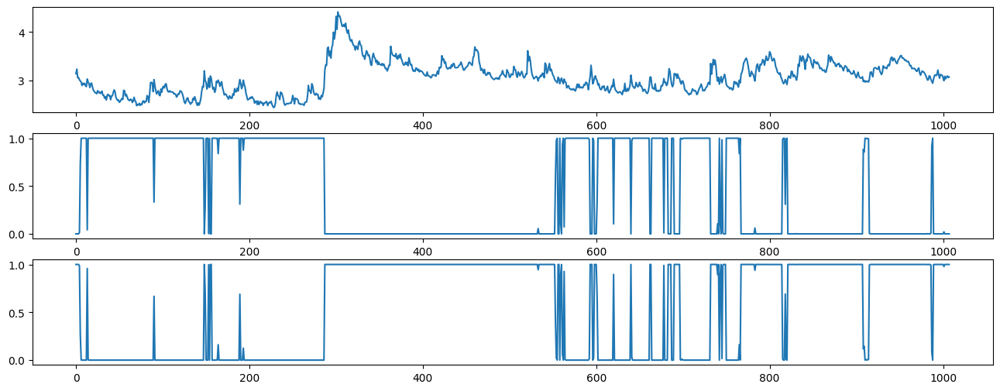


ite=0, max(diff) = 2.949265401079581

mu_hat0 = [2.76637394 3.29377436], 
sigma_hat0 = [0.14559979 0.23724458], 
P_hat0 = 
[[0.94424007 0.05575993]
 [0.04662934 0.95337066]], 
pi_hat0 = [2.81842265e-14 1.00000000e+00]



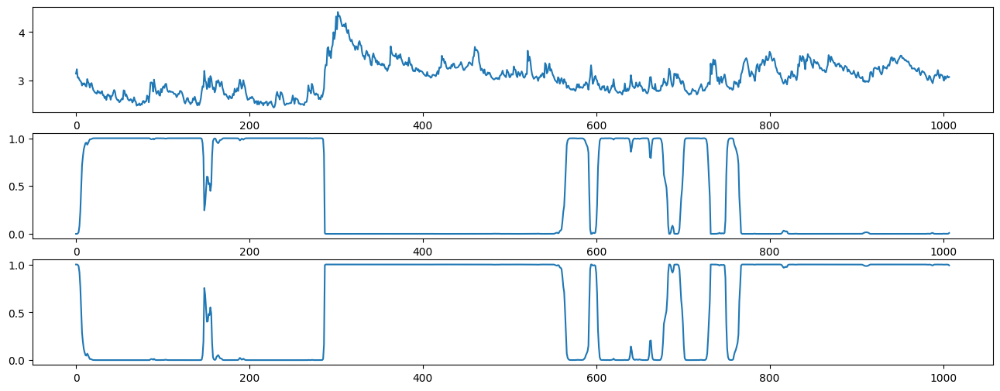


ite=1, max(diff) = 3.1212123816178736

mu_hat0 = [2.75421217 3.27270215], 
sigma_hat0 = [0.14482983 0.24562421], 
P_hat0 = 
[[0.98299572 0.01700428]
 [0.01245889 0.98754111]], 
pi_hat0 = [6.90251118e-17 1.00000000e+00]



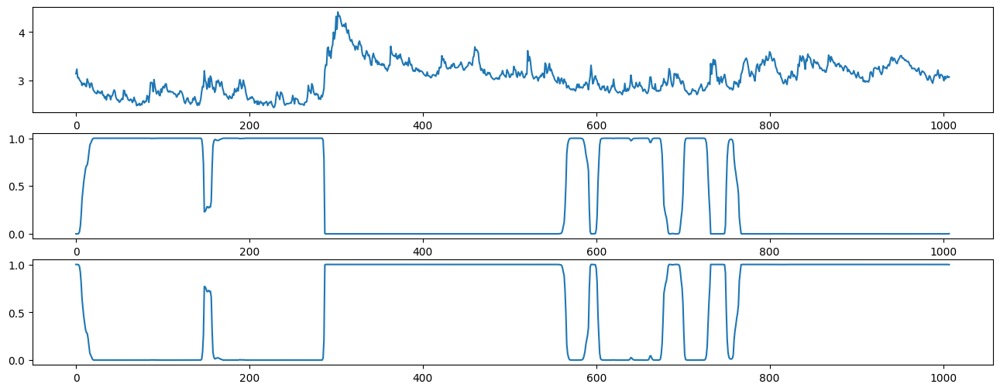


ite=2, max(diff) = 0.793733315500965

mu_hat0 = [2.74817596 3.26531332], 
sigma_hat0 = [0.14277255 0.24788811], 
P_hat0 = 
[[0.98554339 0.01445661]
 [0.01002236 0.98997764]], 
pi_hat0 = [3.61116595e-20 1.00000000e+00]



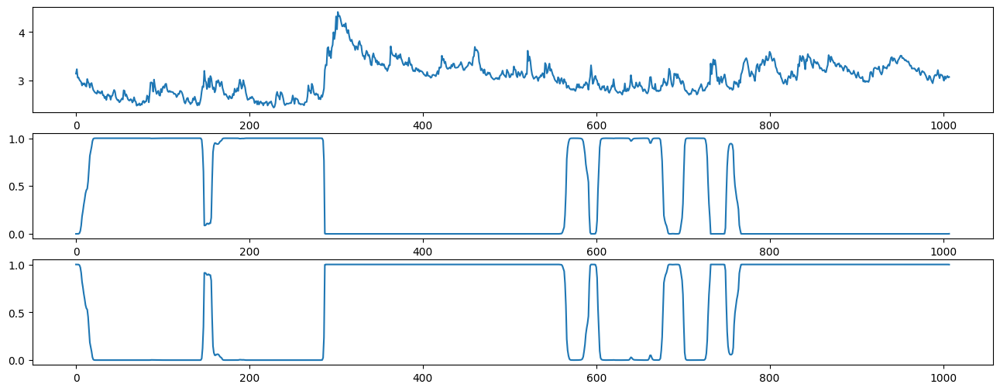


ite=3, max(diff) = 0.10798259126323842

mu_hat0 = [2.7438039  3.26035944], 
sigma_hat0 = [0.14097453 0.24936337], 
P_hat0 = 
[[0.98502476 0.01497524]
 [0.00999447 0.99000553]], 
pi_hat0 = [1.25264302e-23 1.00000000e+00]



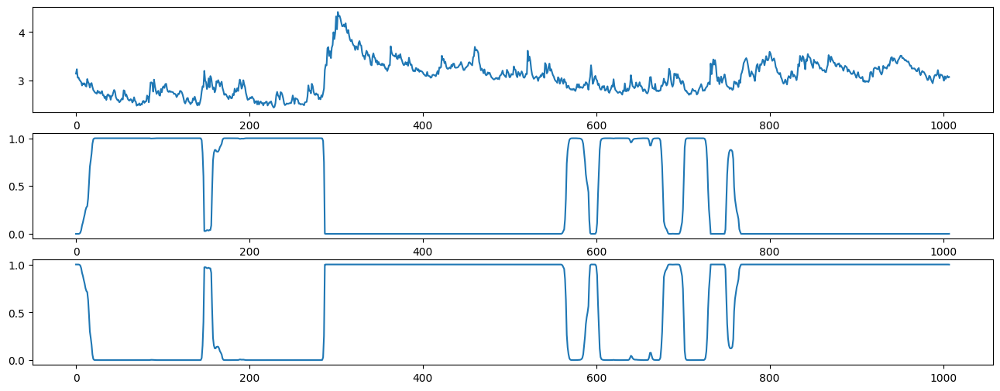


ite=4, max(diff) = 0.0839673525040369

mu_hat0 = [2.74051743 3.25655731], 
sigma_hat0 = [0.13970975 0.25054004], 
P_hat0 = 
[[0.98463695 0.01536305]
 [0.00995848 0.99004152]], 
pi_hat0 = [3.68515488e-27 1.00000000e+00]



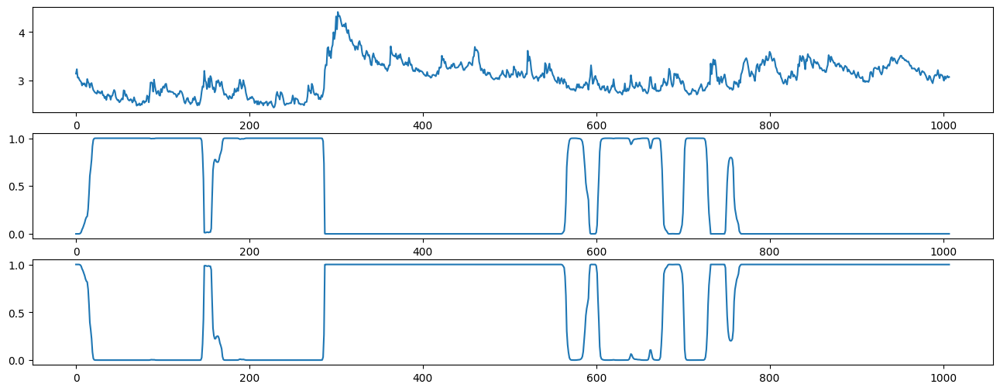


ite=5, max(diff) = 0.06059399276735226

mu_hat0 = [2.73802279 3.25356348], 
sigma_hat0 = [0.13883437 0.25151383], 
P_hat0 = 
[[0.98441902 0.01558098]
 [0.00987166 0.99012834]], 
pi_hat0 = [9.571664e-31 1.000000e+00]



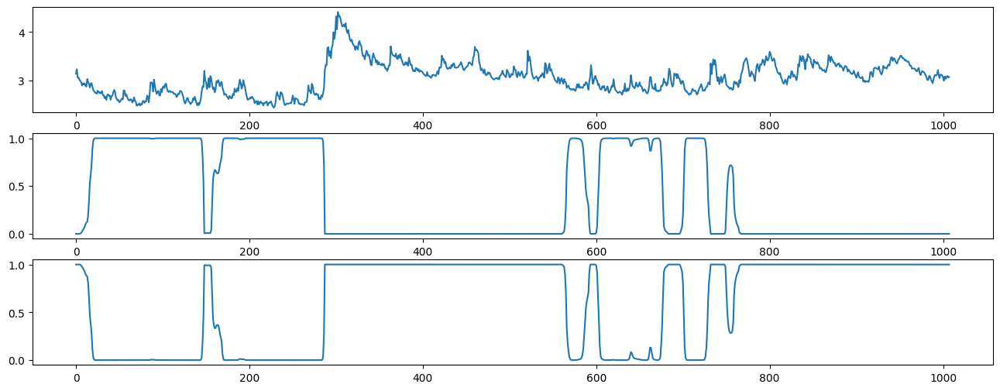


ite=6, max(diff) = 0.04731194204980001

mu_hat0 = [2.73601707 3.25111961], 
sigma_hat0 = [0.13816069 0.25232885], 
P_hat0 = 
[[0.98427799 0.01572201]
 [0.0097768  0.9902232 ]], 
pi_hat0 = [2.25434225e-34 1.00000000e+00]



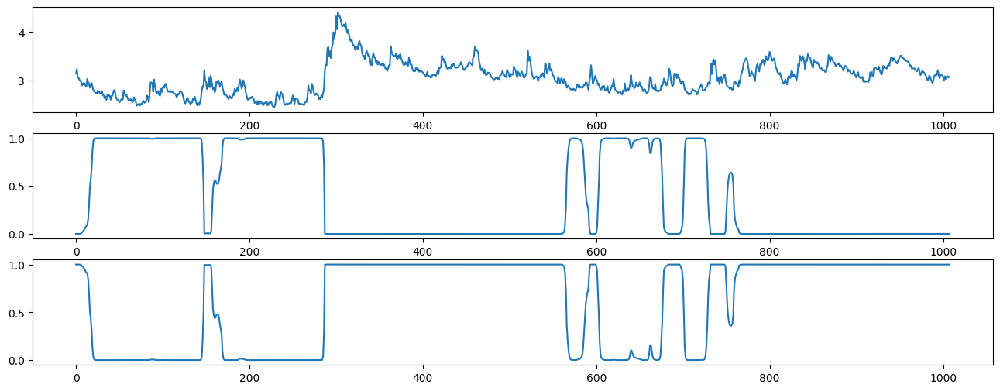


ite=7, max(diff) = 0.039875683671715706

mu_hat0 = [2.73432231 3.24906035], 
sigma_hat0 = [0.1375961  0.25301865], 
P_hat0 = 
[[0.98416618 0.01583382]
 [0.00969169 0.99030831]], 
pi_hat0 = [4.89686719e-38 1.00000000e+00]



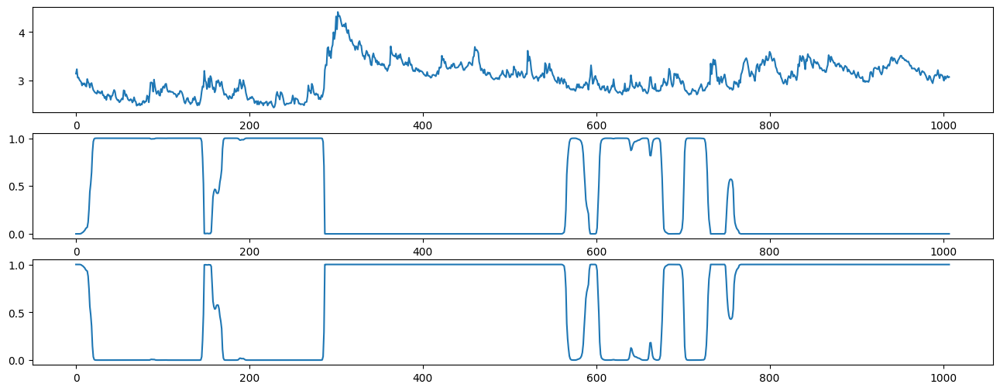


ite=8, max(diff) = 0.03549927860947613

mu_hat0 = [2.73285396 3.2472985 ], 
sigma_hat0 = [0.13710128 0.25360488], 
P_hat0 = 
[[0.98405955 0.01594045]
 [0.00962453 0.99037547]], 
pi_hat0 = [9.92040899e-42 1.00000000e+00]



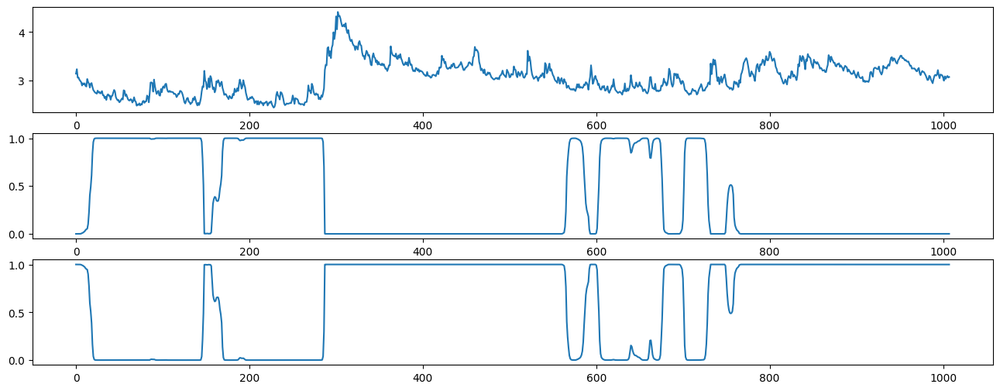


ite=9, max(diff) = 0.032763840006676925

mu_hat0 = [2.73157299 3.24578829], 
sigma_hat0 = [0.13665995 0.25410112], 
P_hat0 = 
[[0.98394526 0.01605474]
 [0.00957951 0.99042049]], 
pi_hat0 = [1.89072576e-45 1.00000000e+00]



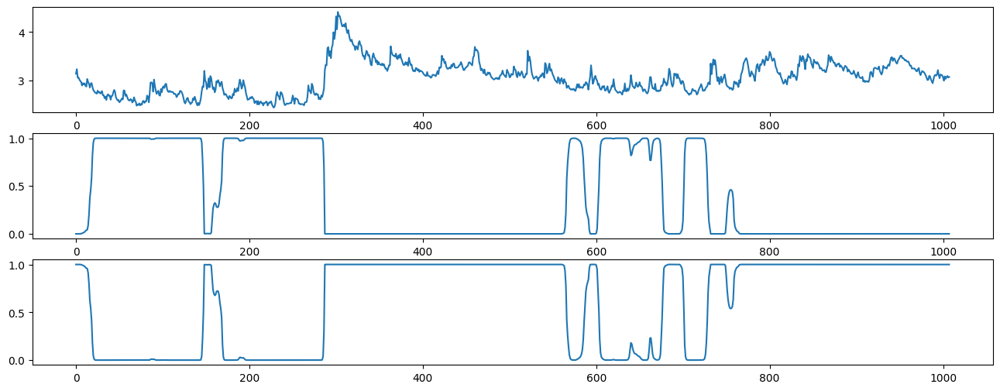


ite=10, max(diff) = 0.030959101225414103

mu_hat0 = [2.73045581 3.2444975 ], 
sigma_hat0 = [0.13626401 0.25451863], 
P_hat0 = 
[[0.98381717 0.01618283]
 [0.00955777 0.99044223]], 
pi_hat0 = [3.41668935e-49 1.00000000e+00]



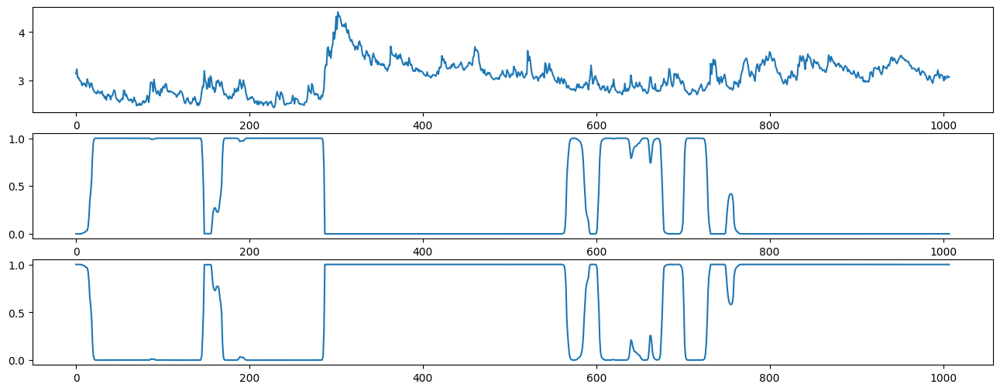


ite=11, max(diff) = 0.029714838344462903

mu_hat0 = [2.72947964 3.24339353], 
sigma_hat0 = [0.13590694 0.25486945], 
P_hat0 = 
[[0.98367374 0.01632626]
 [0.0095577  0.9904423 ]], 
pi_hat0 = [5.89692089e-53 1.00000000e+00]



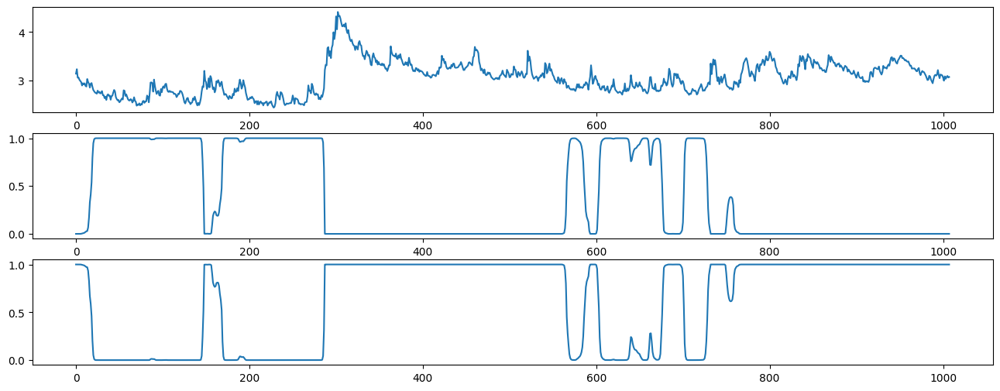


ite=12, max(diff) = 0.036399560901023476

mu_hat0 = [2.72861873 3.24244069], 
sigma_hat0 = [0.13558163 0.25516668], 
P_hat0 = 
[[0.9835162  0.0164838 ]
 [0.00957593 0.99042407]], 
pi_hat0 = [9.78418754e-57 1.00000000e+00]



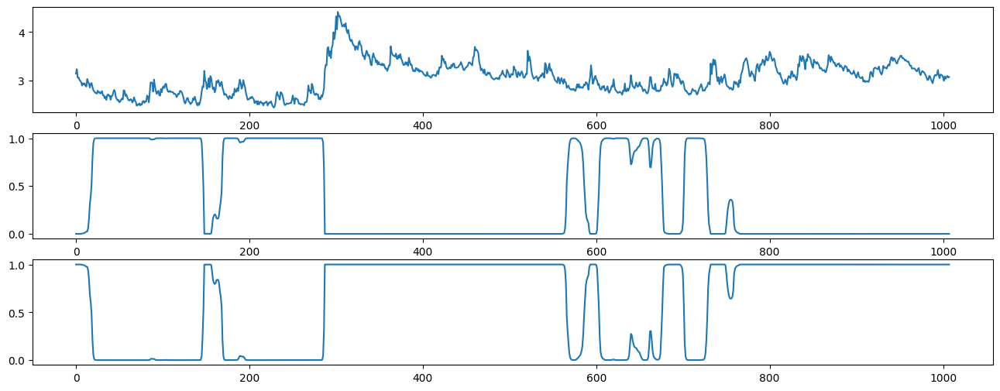


ite=13, max(diff) = 0.041835149463878625

mu_hat0 = [2.72784567 3.24160277], 
sigma_hat0 = [0.13528023 0.25542329], 
P_hat0 = 
[[0.9833465  0.0166535 ]
 [0.00960862 0.99039138]], 
pi_hat0 = [1.56915688e-60 1.00000000e+00]



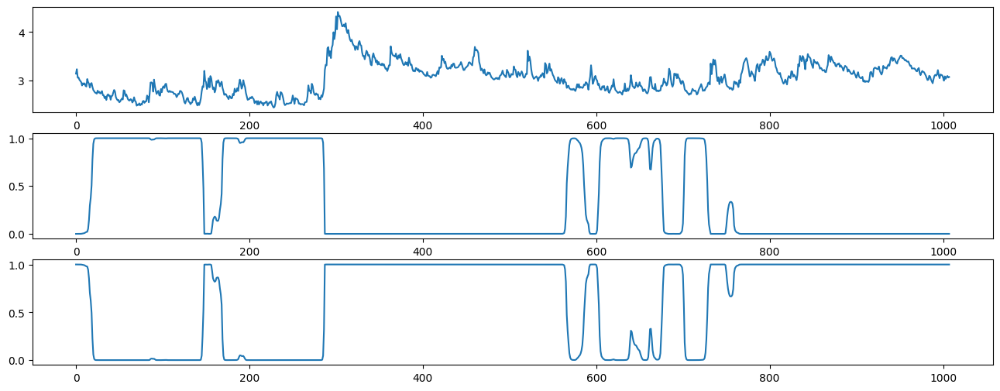


ite=14, max(diff) = 0.046283745891728845

mu_hat0 = [2.72713365 3.24084582], 
sigma_hat0 = [0.13499458 0.25565106], 
P_hat0 = 
[[0.98316579 0.01683421]
 [0.00965259 0.99034741]], 
pi_hat0 = [2.44265011e-64 1.00000000e+00]



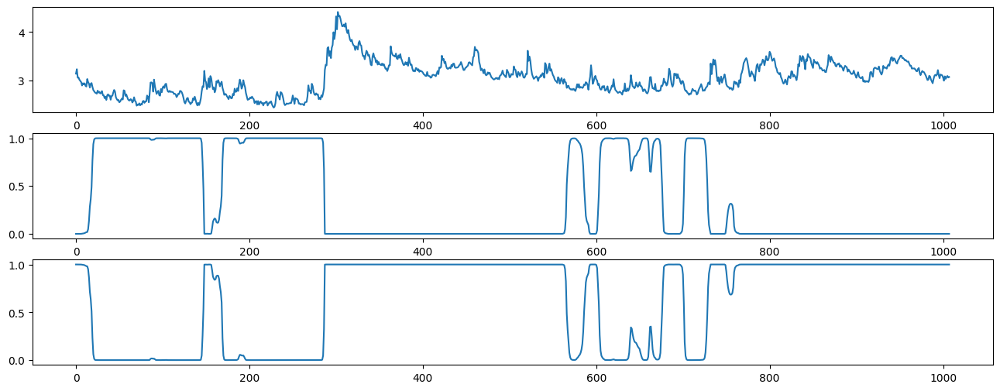


ite=15, max(diff) = 0.05032192137262009

mu_hat0 = [2.72645737 3.24013945], 
sigma_hat0 = [0.13471639 0.25586019], 
P_hat0 = 
[[0.98297359 0.01702641]
 [0.00970577 0.99029423]], 
pi_hat0 = [3.70144212e-68 1.00000000e+00]



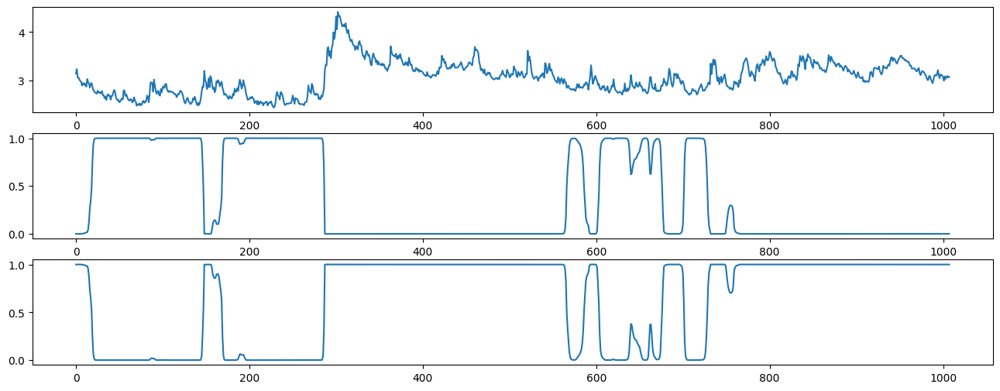


ite=16, max(diff) = 0.05460696177942095

mu_hat0 = [2.72579281 3.23945622], 
sigma_hat0 = [0.13443705 0.25605953], 
P_hat0 = 
[[0.98276746 0.01723254]
 [0.00976737 0.99023263]], 
pi_hat0 = [5.46950761e-72 1.00000000e+00]



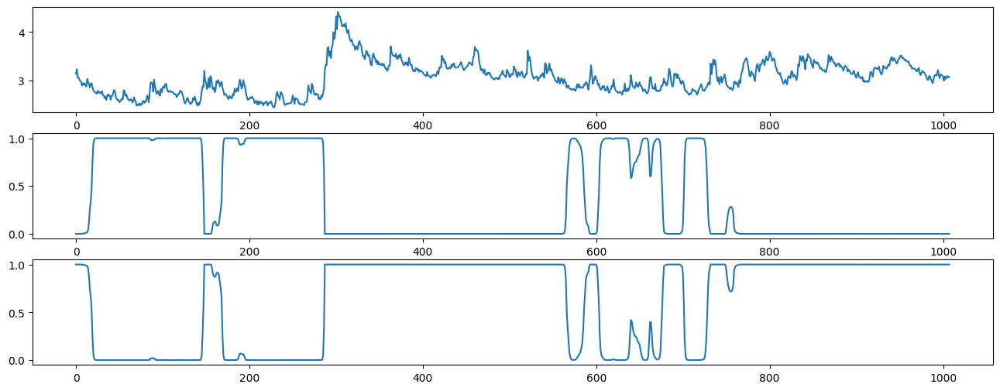


ite=17, max(diff) = 0.059797601903513485

mu_hat0 = [2.72511583 3.23877007], 
sigma_hat0 = [0.13414716 0.2562571 ], 
P_hat0 = 
[[0.98254283 0.01745717]
 [0.00983776 0.99016224]], 
pi_hat0 = [7.88635725e-76 1.00000000e+00]



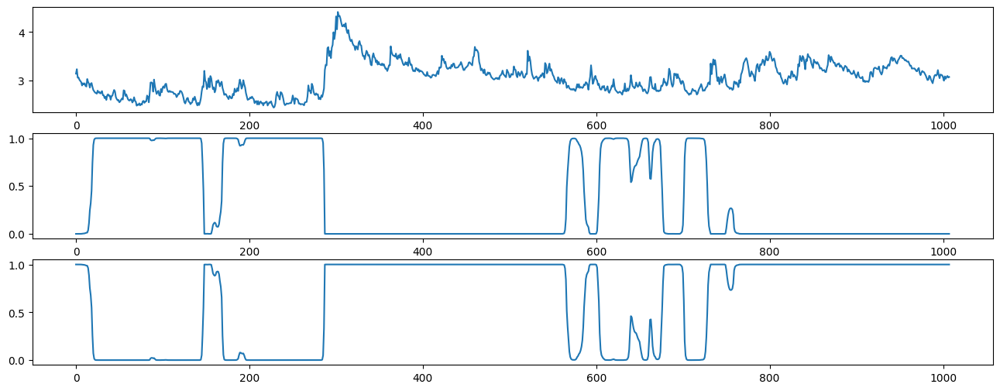


ite=18, max(diff) = 0.06656748368228282

mu_hat0 = [2.72440019 3.23805412], 
sigma_hat0 = [0.13383579 0.25646083], 
P_hat0 = 
[[0.98229272 0.01770728]
 [0.00991843 0.99008157]], 
pi_hat0 = [1.10912394e-79 1.00000000e+00]



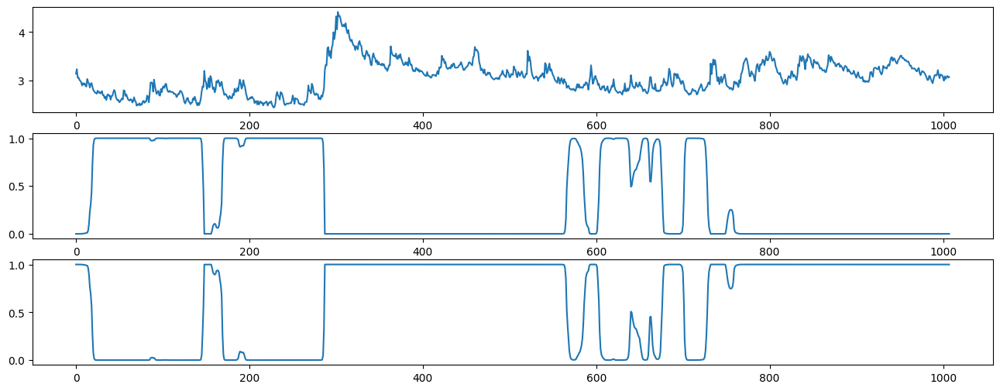


ite=19, max(diff) = 0.07565583725517858

mu_hat0 = [2.72361496 3.23727805], 
sigma_hat0 = [0.13348932 0.25667931], 
P_hat0 = 
[[0.98200726 0.01799274]
 [0.01001194 0.98998806]], 
pi_hat0 = [1.51910826e-83 1.00000000e+00]



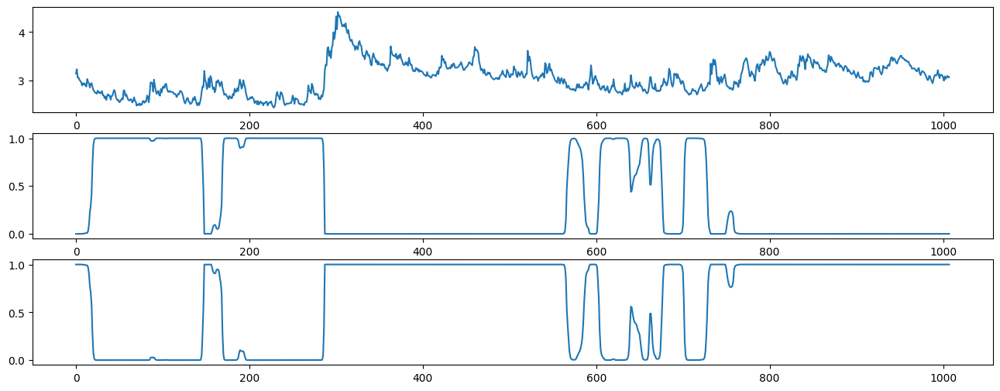


ite=20, max(diff) = 0.0878984976699603

mu_hat0 = [2.72272137 3.23640504], 
sigma_hat0 = [0.13309014 0.25692271], 
P_hat0 = 
[[0.98167291 0.01832709]
 [0.010122   0.989878  ]], 
pi_hat0 = [2.02040496e-87 1.00000000e+00]



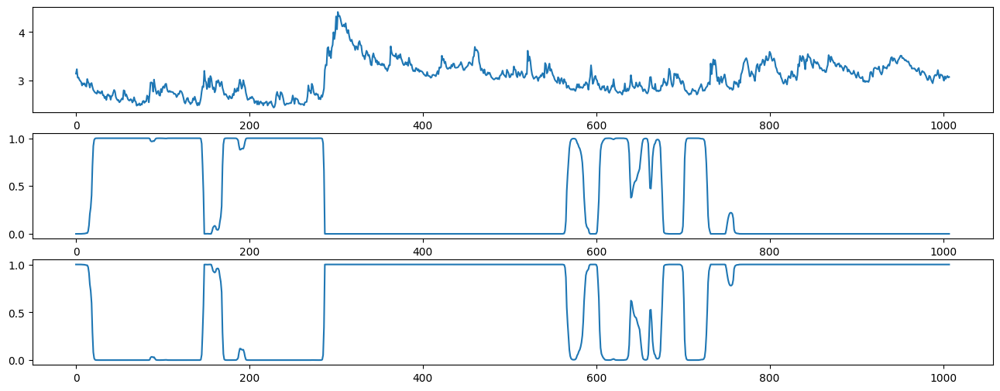


ite=21, max(diff) = 0.10415206439801777

mu_hat0 = [2.72166964 3.23538898], 
sigma_hat0 = [0.13261515 0.25720357], 
P_hat0 = 
[[0.98127187 0.01872813]
 [0.01025328 0.98974672]], 
pi_hat0 = [2.59710742e-91 1.00000000e+00]



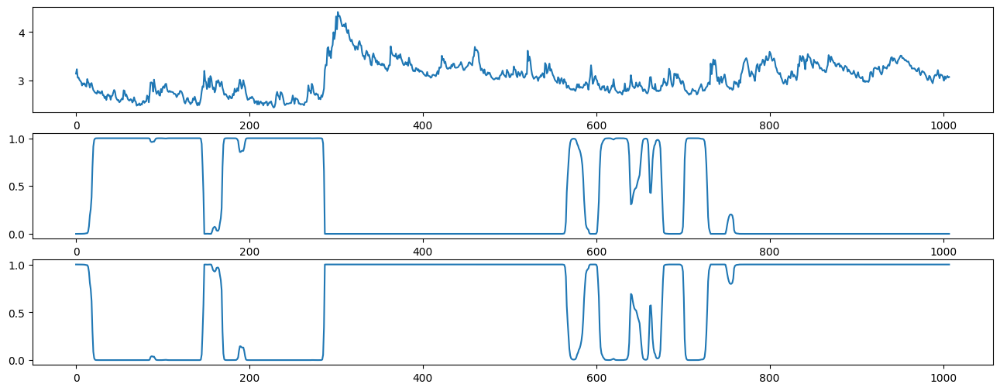


ite=22, max(diff) = 0.12494828618876225

mu_hat0 = [2.72039754 3.23417318], 
sigma_hat0 = [0.13203522 0.25753729], 
P_hat0 = 
[[0.98078254 0.01921746]
 [0.01041077 0.98958923]], 
pi_hat0 = [3.20362543e-95 1.00000000e+00]



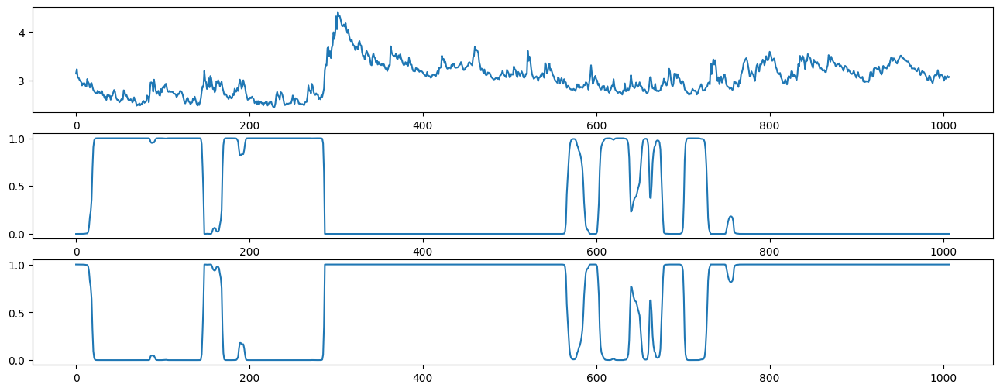


ite=23, max(diff) = 0.14969705084664772

mu_hat0 = [2.71883525 3.23269472], 
sigma_hat0 = [0.13131795 0.25794141], 
P_hat0 = 
[[0.9801829  0.0198171 ]
 [0.01059784 0.98940216]], 
pi_hat0 = [3.75265284e-99 1.00000000e+00]



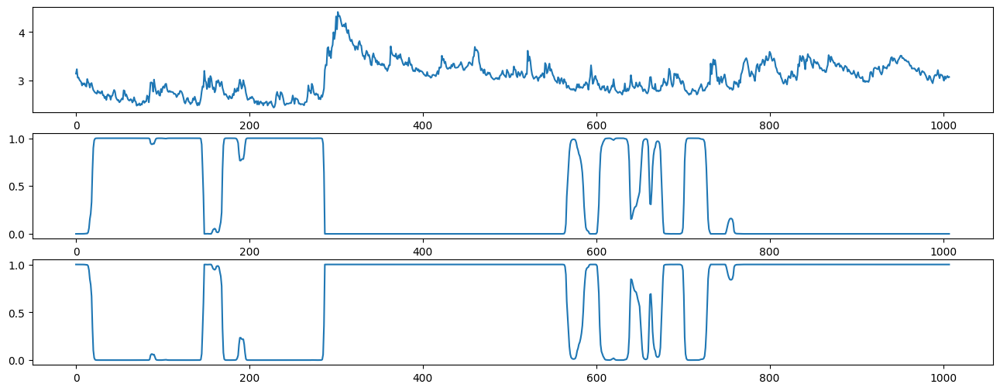


ite=24, max(diff) = 0.17576342611179496

mu_hat0 = [2.71692106 3.2308973 ], 
sigma_hat0 = [0.13043632 0.25843306], 
P_hat0 = 
[[0.97945806 0.02054194]
 [0.01081315 0.98918685]], 
pi_hat0 = [4.113027e-103 1.000000e+000]



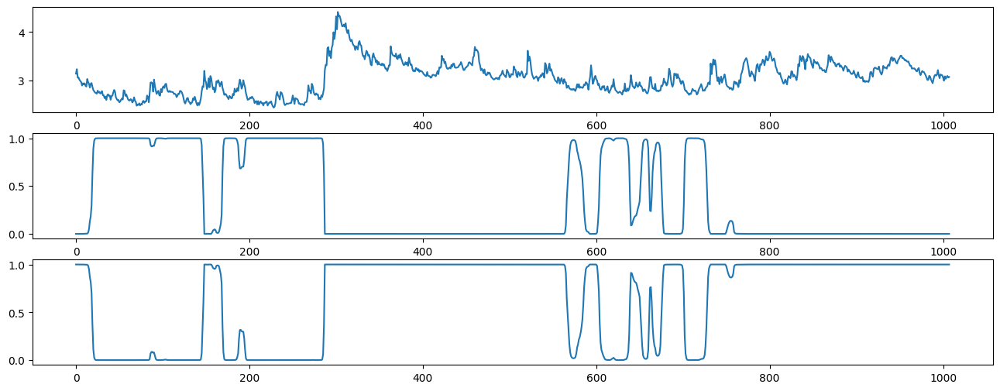


ite=25, max(diff) = 0.19912091632143428

mu_hat0 = [2.71461739 3.22874255], 
sigma_hat0 = [0.12937858 0.25902743], 
P_hat0 = 
[[0.97860687 0.02139313]
 [0.01104847 0.98895153]], 
pi_hat0 = [4.13664703e-107 1.00000000e+000]



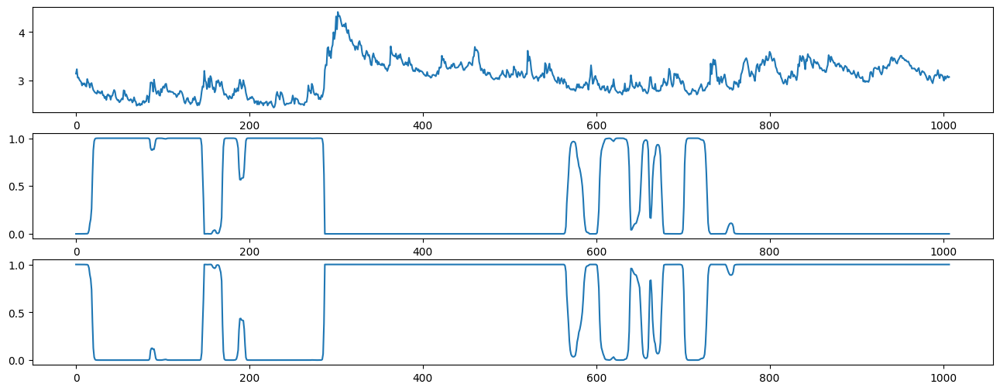


ite=26, max(diff) = 0.21716909208900934

mu_hat0 = [2.71188866 3.2261869 ], 
sigma_hat0 = [0.12813987 0.25974498], 
P_hat0 = 
[[0.9776373  0.0223627 ]
 [0.01128945 0.98871055]], 
pi_hat0 = [3.72813771e-111 1.00000000e+000]



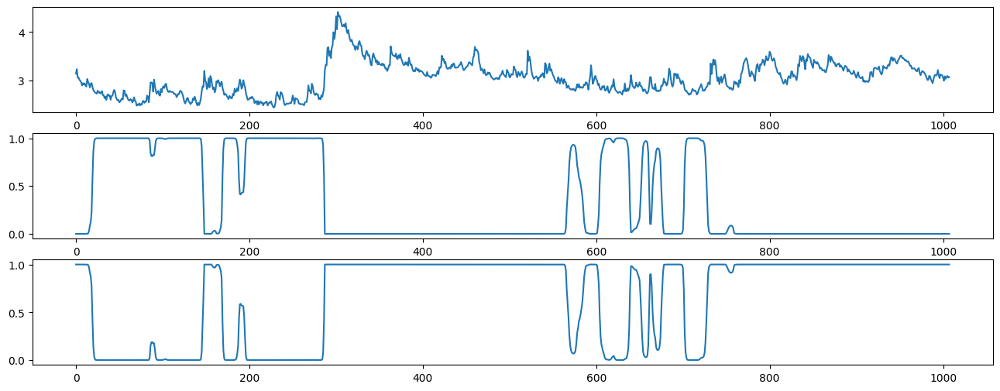


ite=27, max(diff) = 0.2269592606391339

mu_hat0 = [2.7086295  3.22311425], 
sigma_hat0 = [0.1266914  0.26063088], 
P_hat0 = 
[[0.97656522 0.02343478]
 [0.01150985 0.98849015]], 
pi_hat0 = [2.92640595e-115 1.00000000e+000]



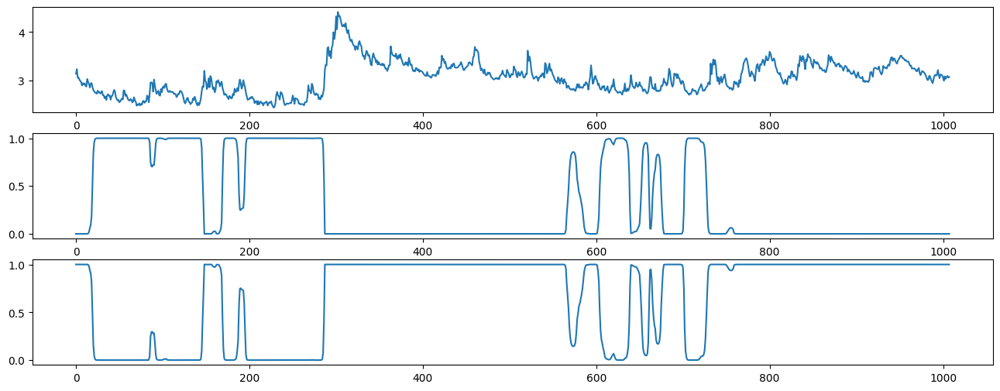


ite=28, max(diff) = 0.21545040795302123

mu_hat0 = [2.70460269 3.21927128], 
sigma_hat0 = [0.12496352 0.26177818], 
P_hat0 = 
[[0.97545165 0.02454835]
 [0.01164695 0.98835305]], 
pi_hat0 = [1.92523366e-119 1.00000000e+000]



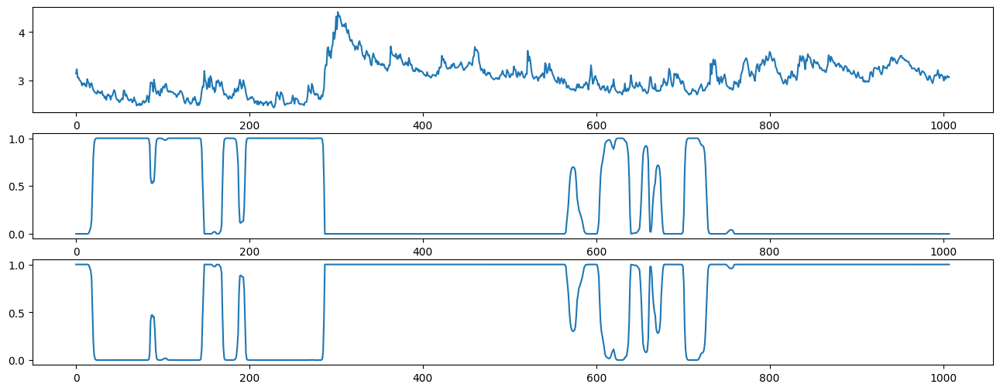


ite=29, max(diff) = 0.18121642674770377

mu_hat0 = [2.69940168 3.21423801], 
sigma_hat0 = [0.12283978 0.26333996], 
P_hat0 = 
[[0.97445662 0.02554338]
 [0.01157762 0.98842238]], 
pi_hat0 = [9.99930691e-124 1.00000000e+000]



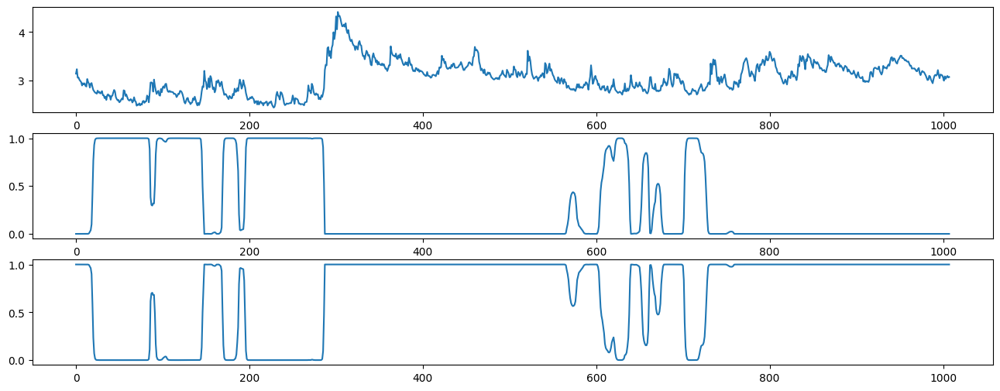


ite=30, max(diff) = 0.18677124631000977

mu_hat0 = [2.69238758 3.20746227], 
sigma_hat0 = [0.12009138 0.26549965], 
P_hat0 = 
[[0.97378463 0.02621537]
 [0.01115909 0.98884091]], 
pi_hat0 = [3.71375397e-128 1.00000000e+000]



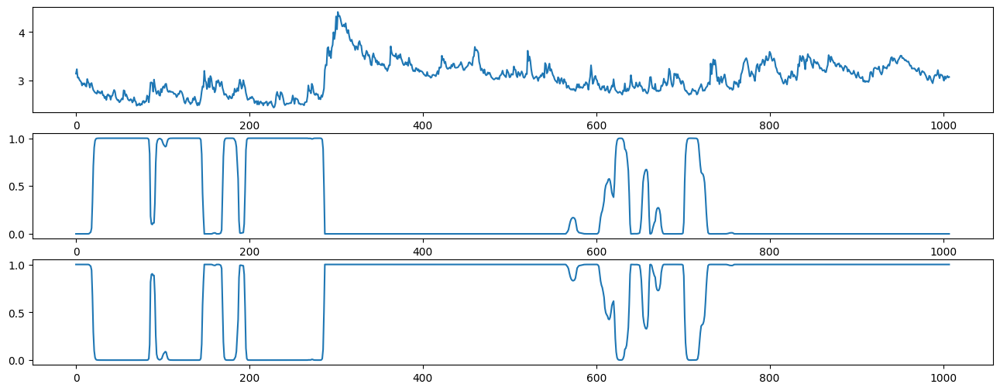


ite=31, max(diff) = 0.21749338445068633

mu_hat0 = [2.68194908 3.19790499], 
sigma_hat0 = [0.11587601 0.26851621], 
P_hat0 = 
[[0.97339898 0.02660102]
 [0.01032034 0.98967966]], 
pi_hat0 = [8.3289409e-133 1.0000000e+000]



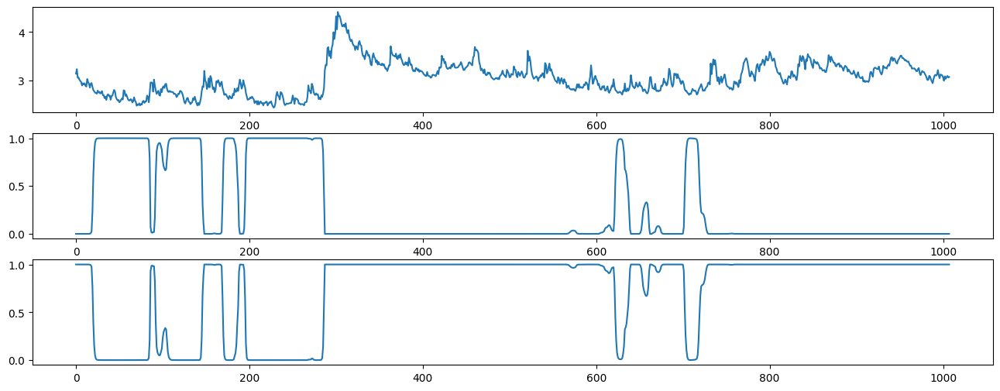


ite=32, max(diff) = 0.2262014127404986

mu_hat0 = [2.66891964 3.18719642], 
sigma_hat0 = [0.10994235 0.2717653 ], 
P_hat0 = 
[[0.97326472 0.02673528]
 [0.00927605 0.99072395]], 
pi_hat0 = [7.77406754e-138 1.00000000e+000]



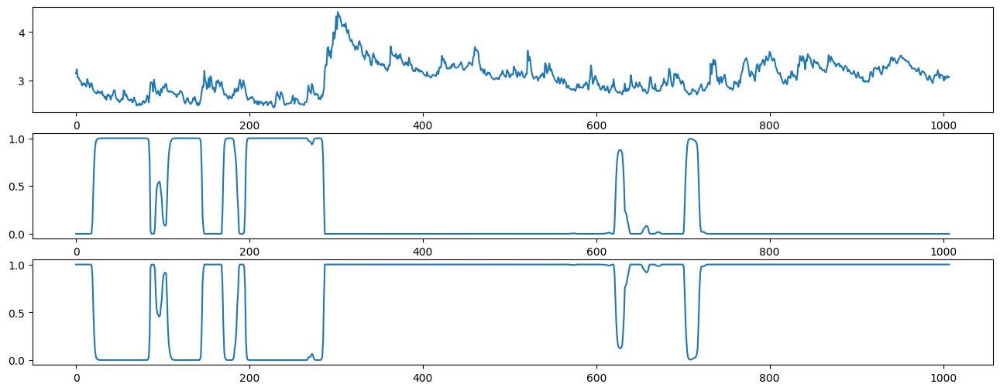


ite=33, max(diff) = 0.3330756970009073

mu_hat0 = [2.65671417 3.1776233 ], 
sigma_hat0 = [0.10393439 0.27479808], 
P_hat0 = 
[[0.97234784 0.02765216]
 [0.00863147 0.99136853]], 
pi_hat0 = [1.79882534e-143 1.00000000e+000]



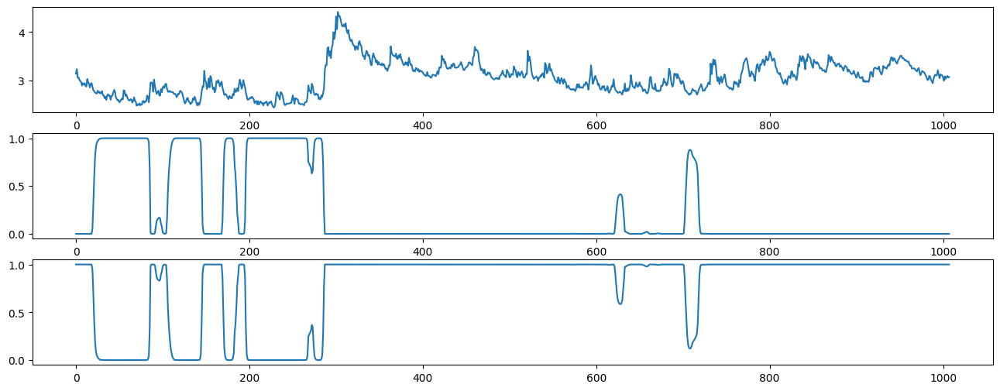


ite=34, max(diff) = 0.3964818369605528

mu_hat0 = [2.64592239 3.16860226], 
sigma_hat0 = [0.09947905 0.27798261], 
P_hat0 = 
[[0.97304221 0.02695779]
 [0.0075949  0.9924051 ]], 
pi_hat0 = [8.13813892e-150 1.00000000e+000]



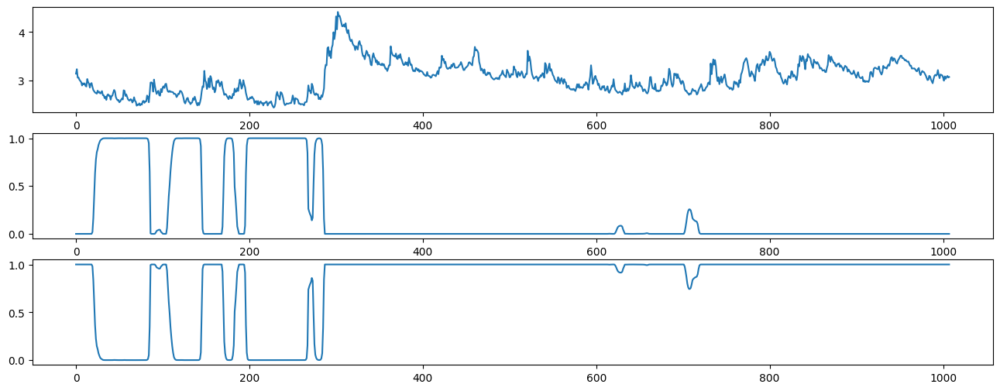


ite=35, max(diff) = 0.337016530721677

mu_hat0 = [2.63201099 3.15846326], 
sigma_hat0 = [0.09274123 0.28140488], 
P_hat0 = 
[[0.97336035 0.02663965]
 [0.00661639 0.99338361]], 
pi_hat0 = [7.59122868e-157 1.00000000e+000]



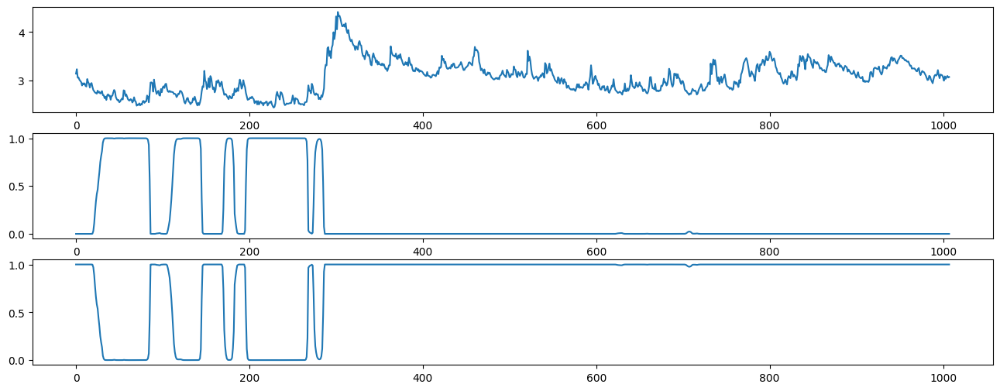


ite=36, max(diff) = 0.289741872706888

mu_hat0 = [2.62220002 3.15204952], 
sigma_hat0 = [0.08734833 0.28352872], 
P_hat0 = 
[[0.97280845 0.02719155]
 [0.00619527 0.99380473]], 
pi_hat0 = [4.62309445e-165 1.00000000e+000]



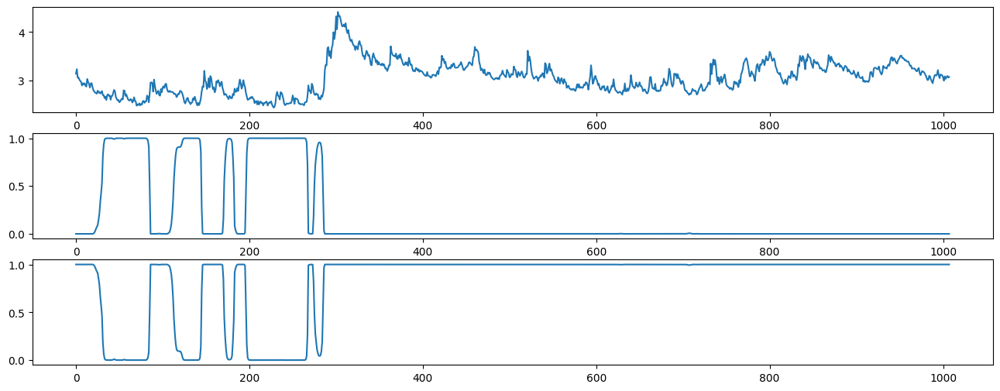


ite=37, max(diff) = 0.36195821062743355

mu_hat0 = [2.61602898 3.1477919 ], 
sigma_hat0 = [0.08430188 0.28506501], 
P_hat0 = 
[[0.97180586 0.02819414]
 [0.00605855 0.99394145]], 
pi_hat0 = [2.10338451e-174 1.00000000e+000]



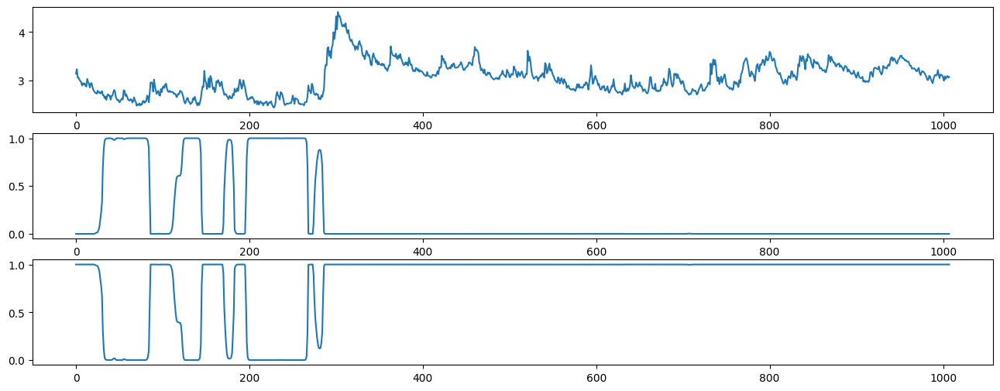


ite=38, max(diff) = 0.2955071138078903

mu_hat0 = [2.61126748 3.14424091], 
sigma_hat0 = [0.08218218 0.28645607], 
P_hat0 = 
[[0.97102869 0.02897131]
 [0.00592578 0.99407422]], 
pi_hat0 = [1.68163166e-184 1.00000000e+000]



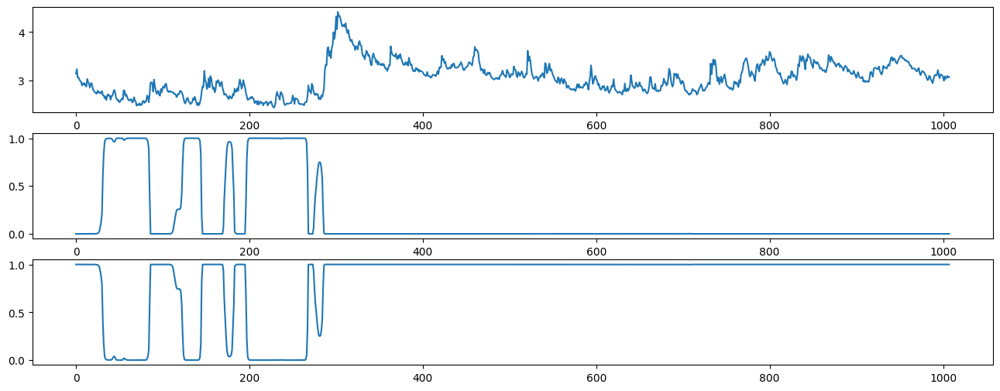


ite=39, max(diff) = 0.2094071509911622

mu_hat0 = [2.60677557 3.14087076], 
sigma_hat0 = [0.08017658 0.28781162], 
P_hat0 = 
[[0.97059063 0.02940937]
 [0.00573291 0.99426709]], 
pi_hat0 = [3.39500592e-195 1.00000000e+000]



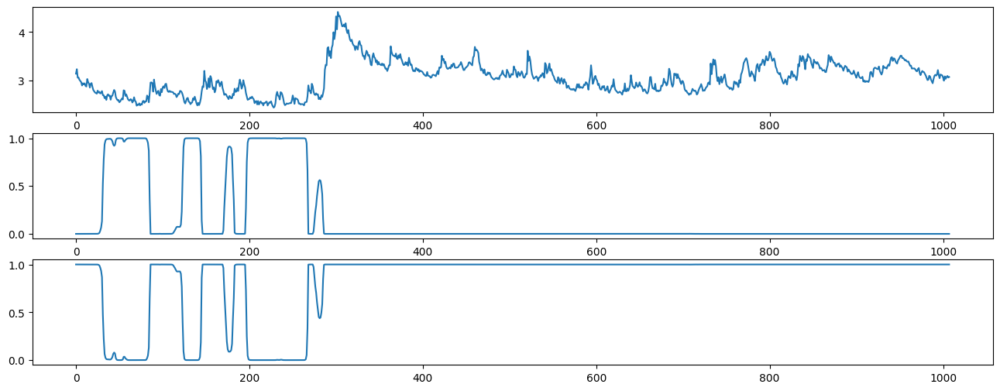


ite=40, max(diff) = 0.13683942104973168

mu_hat0 = [2.60317035 3.138042  ], 
sigma_hat0 = [0.07863929 0.28899942], 
P_hat0 = 
[[0.97073246 0.02926754]
 [0.00547565 0.99452435]], 
pi_hat0 = [1.64358879e-206 1.00000000e+000]



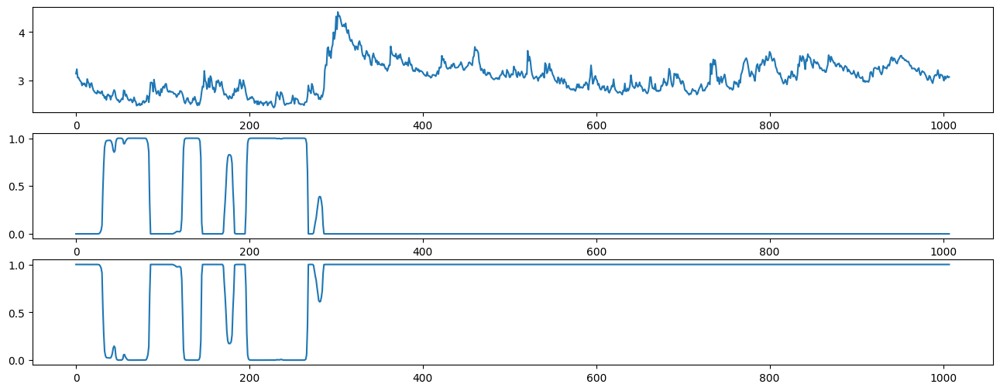


ite=41, max(diff) = 0.21928661307104846

mu_hat0 = [2.60060175 3.13588441], 
sigma_hat0 = [0.07766005 0.28994589], 
P_hat0 = 
[[0.9711056  0.0288944 ]
 [0.00523746 0.99476254]], 
pi_hat0 = [2.37430056e-218 1.00000000e+000]



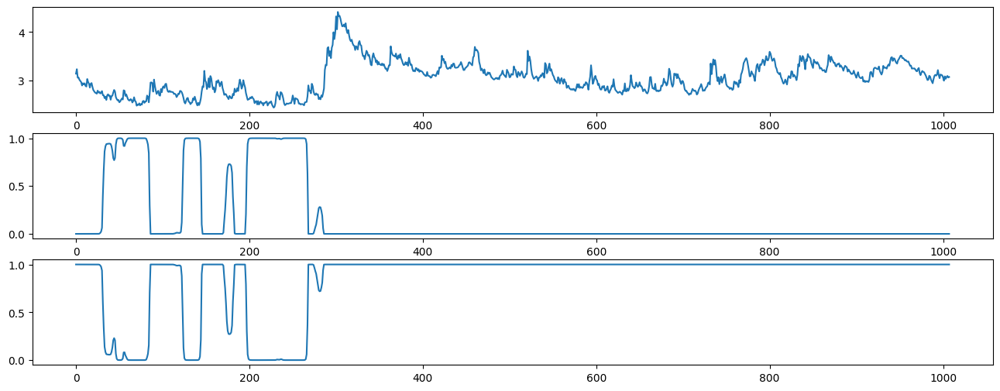


ite=42, max(diff) = 0.15466479642193043

mu_hat0 = [2.59861425 3.13419321], 
sigma_hat0 = [0.0769228 0.2906973], 
P_hat0 = 
[[0.97134558 0.02865442]
 [0.00506468 0.99493532]], 
pi_hat0 = [1.47099404e-230 1.00000000e+000]



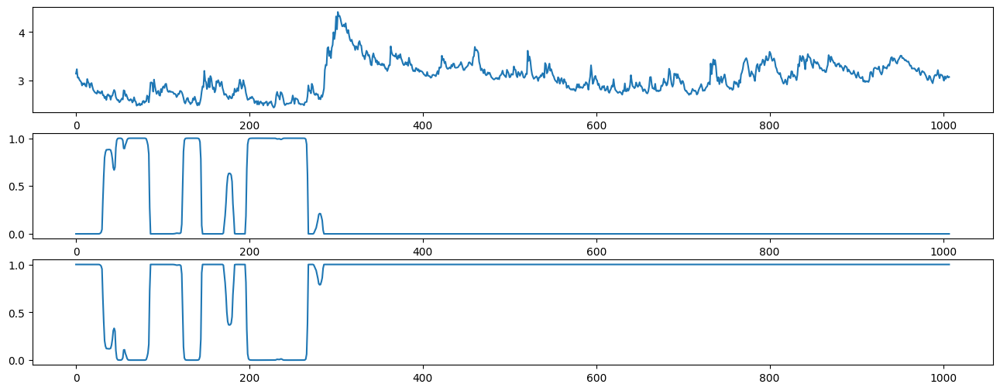


ite=43, max(diff) = 0.05817294778511746

mu_hat0 = [2.59675209 3.13265891], 
sigma_hat0 = [0.07618537 0.29137418], 
P_hat0 = 
[[0.97137395 0.02862605]
 [0.00494283 0.99505717]], 
pi_hat0 = [4.68792765e-243 1.00000000e+000]



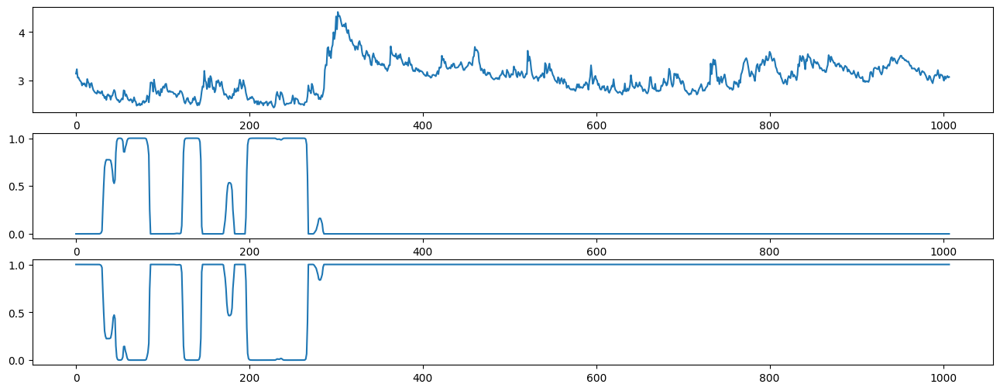


ite=44, max(diff) = 0.12008544048044746

mu_hat0 = [2.59453124 3.13092274], 
sigma_hat0 = [0.07521511 0.29212859], 
P_hat0 = 
[[0.97116897 0.02883103]
 [0.00484502 0.99515498]], 
pi_hat0 = [7.66594765e-256 1.00000000e+000]



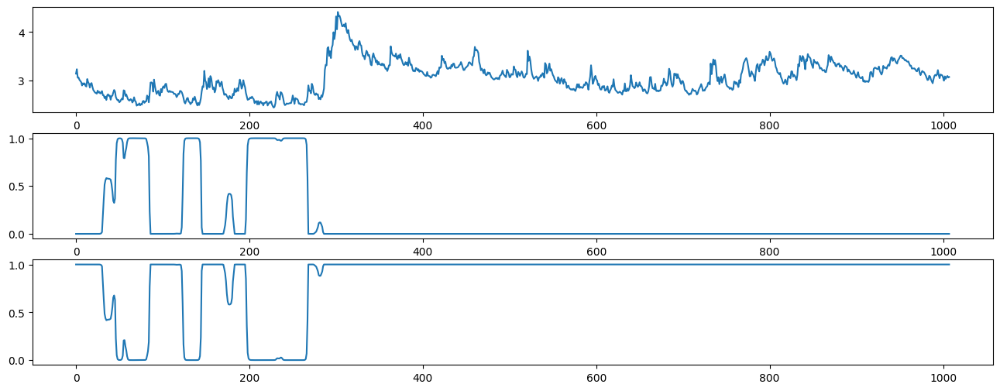


ite=45, max(diff) = 0.24212128974554312

mu_hat0 = [2.59118435 3.12846704], 
sigma_hat0 = [0.0735938  0.29317705], 
P_hat0 = 
[[0.97067957 0.02932043]
 [0.00473577 0.99526423]], 
pi_hat0 = [5.19583033e-269 1.00000000e+000]



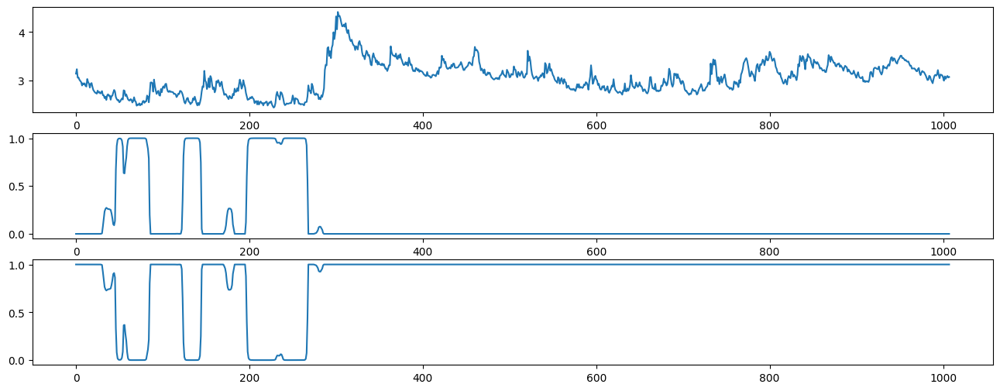


ite=46, max(diff) = 0.43638528915963143

mu_hat0 = [2.58588741 3.1249008 ], 
sigma_hat0 = [0.0706567  0.29466729], 
P_hat0 = 
[[0.96976233 0.03023767]
 [0.00459788 0.99540212]], 
pi_hat0 = [7.72451882e-283 1.00000000e+000]



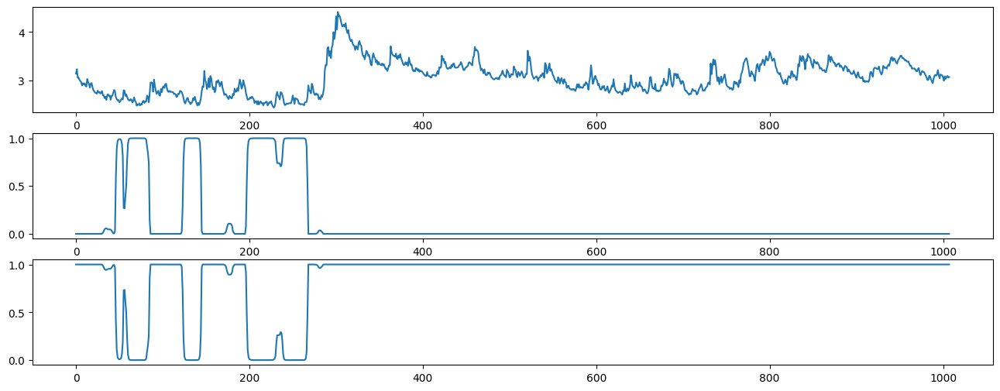


ite=47, max(diff) = 1.8099219801612

mu_hat0 = [2.57895008 3.12094016], 
sigma_hat0 = [0.06553765 0.29624491], 
P_hat0 = 
[[0.96575782 0.03424218]
 [0.00484477 0.99515523]], 
pi_hat0 = [5.93825356e-298 1.00000000e+000]



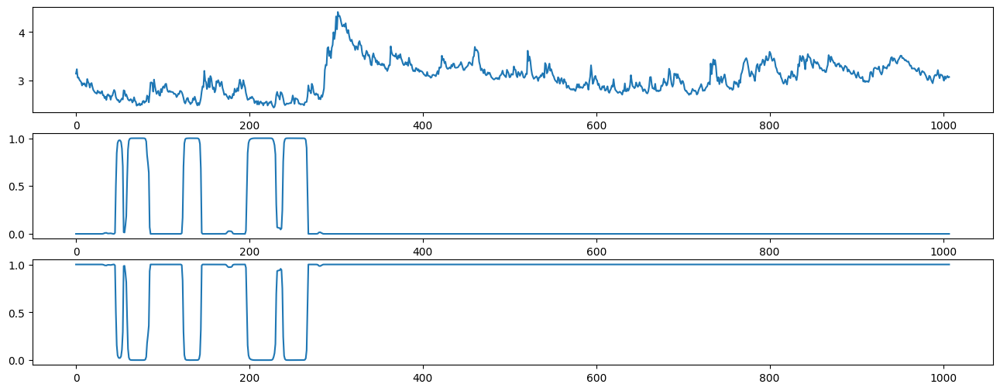


ite=48, max(diff) = 4.039922421830241

mu_hat0 = [2.56965614 3.11636468], 
sigma_hat0 = [0.05625582 0.29801801], 
P_hat0 = 
[[0.95654398 0.04345602]
 [0.00561917 0.99438083]], 
pi_hat0 = [1.29478068e-315 1.00000000e+000]



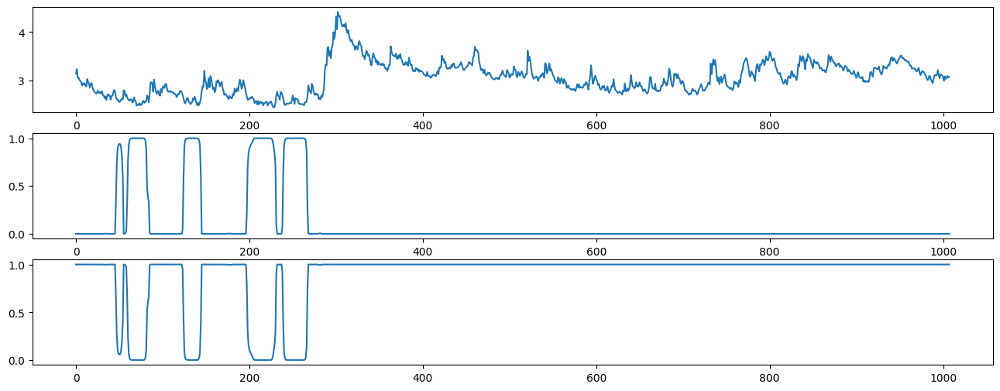


ite=49, max(diff) = 0.7004344296266184

mu_hat0 = [2.56583878 3.11349339], 
sigma_hat0 = [0.05297635 0.29939963], 
P_hat0 = 
[[0.95460347 0.04539653]
 [0.00555673 0.99444327]], 
pi_hat0 = [0. 1.]



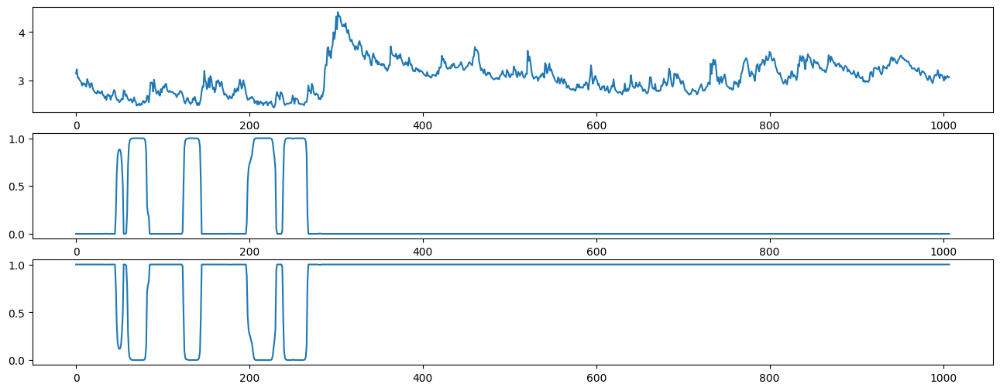


ite=50, max(diff) = 0.33118387074364614

mu_hat0 = [2.5639904  3.11171535], 
sigma_hat0 = [0.05186625 0.30031301], 
P_hat0 = 
[[0.95375199 0.04624801]
 [0.00547151 0.99452849]], 
pi_hat0 = [0. 1.]



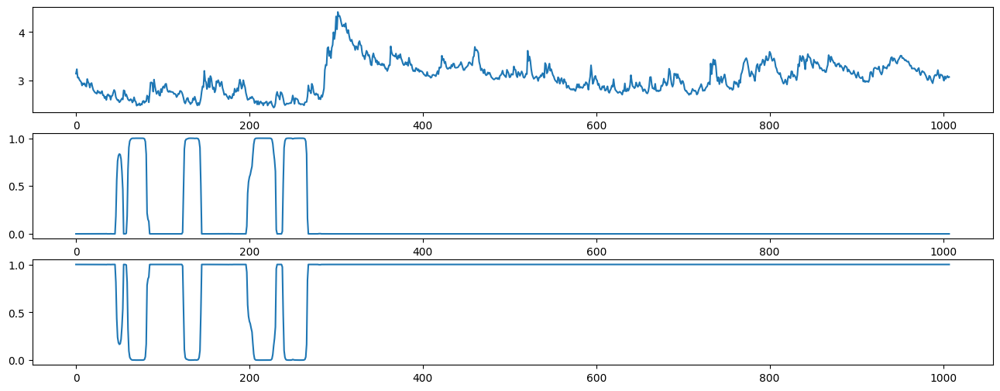


ite=51, max(diff) = 0.17946180740819945

mu_hat0 = [2.56285268 3.11064986], 
sigma_hat0 = [0.05130202 0.30085476], 
P_hat0 = 
[[0.95331453 0.04668547]
 [0.00540902 0.99459098]], 
pi_hat0 = [0. 1.]



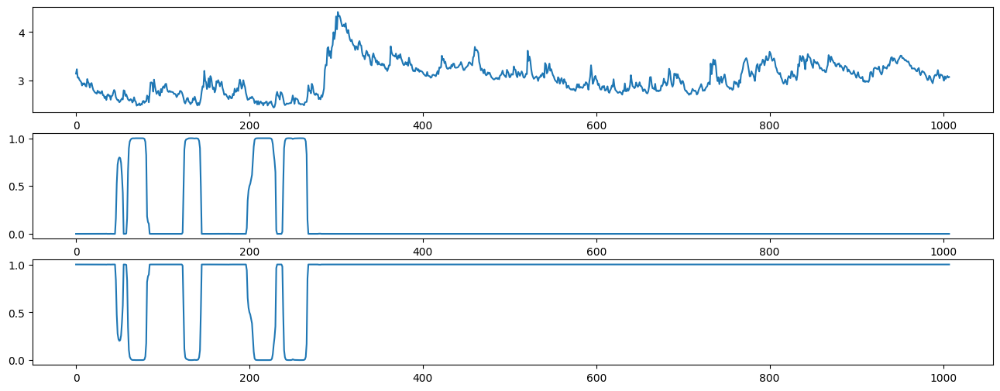


ite=52, max(diff) = 0.10723913990605184

mu_hat0 = [2.56208709 3.1099581 ], 
sigma_hat0 = [0.05094573 0.30120305], 
P_hat0 = 
[[0.95306478 0.04693522]
 [0.00536338 0.99463662]], 
pi_hat0 = [0. 1.]



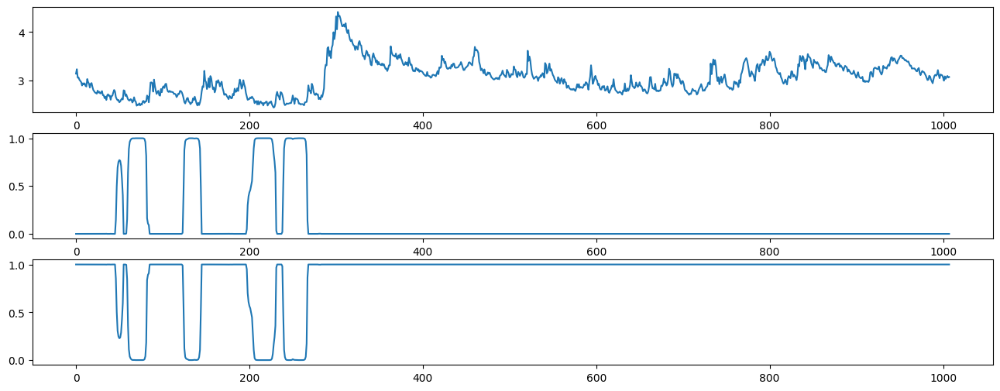


ite=53, max(diff) = 0.06867067973944843

mu_hat0 = [2.56154968 3.10948086], 
sigma_hat0 = [0.05070027 0.30144233], 
P_hat0 = 
[[0.95291123 0.04708877]
 [0.00532935 0.99467065]], 
pi_hat0 = [0. 1.]



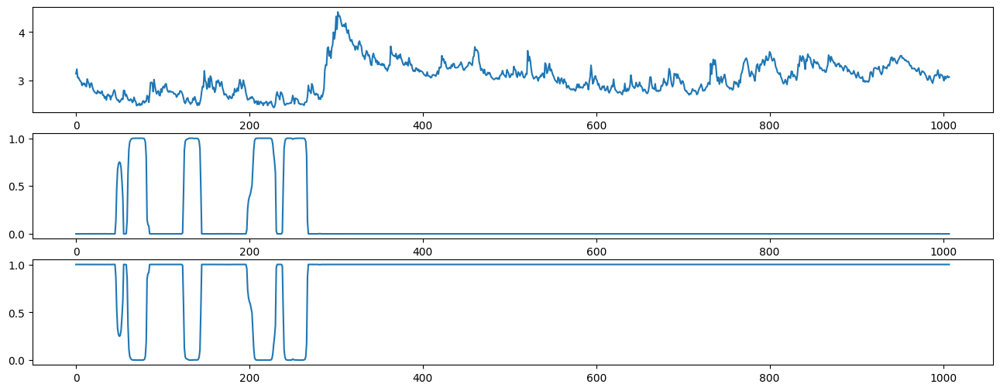


ite=54, max(diff) = 0.04555144889651729

mu_hat0 = [2.5611645  3.10914124], 
sigma_hat0 = [0.05052544 0.30161238], 
P_hat0 = 
[[0.95281322 0.04718678]
 [0.0053037  0.9946963 ]], 
pi_hat0 = [0. 1.]



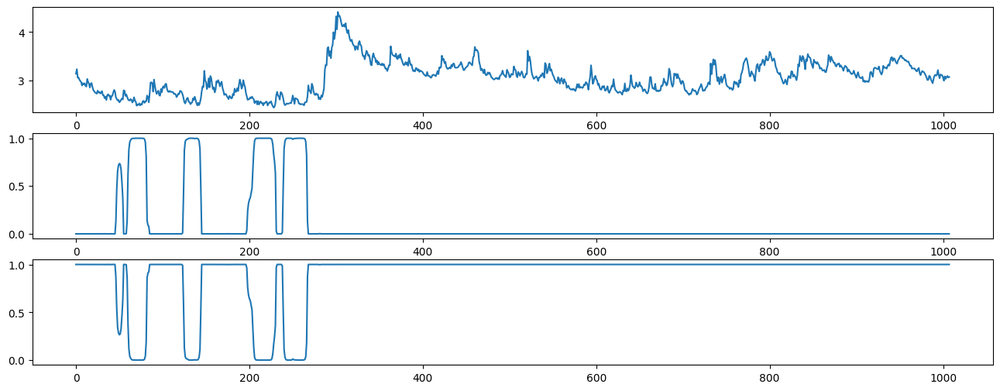


ite=55, max(diff) = 0.030781614161882558

mu_hat0 = [2.56088599 3.10889631], 
sigma_hat0 = [0.05039942 0.30173499], 
P_hat0 = 
[[0.95274939 0.04725061]
 [0.00528437 0.99471563]], 
pi_hat0 = [0. 1.]



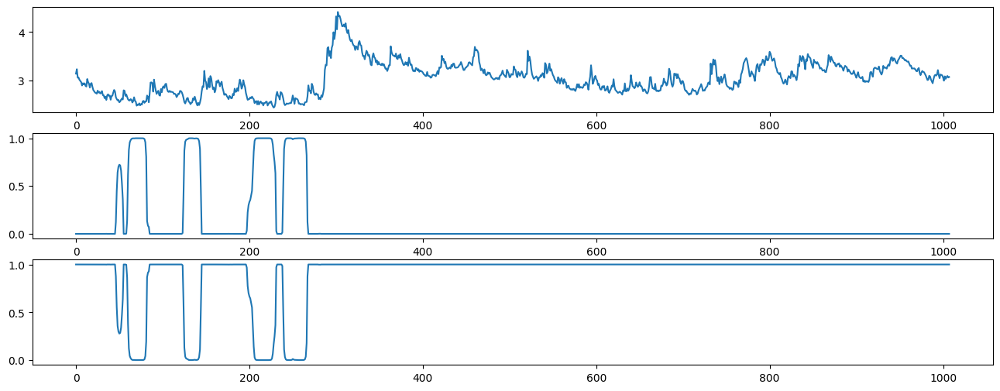


ite=56, max(diff) = 0.02104759137659729

mu_hat0 = [2.56068409 3.10871887], 
sigma_hat0 = [0.05030828 0.30182384], 
P_hat0 = 
[[0.95270721 0.04729279]
 [0.00526988 0.99473012]], 
pi_hat0 = [0. 1.]



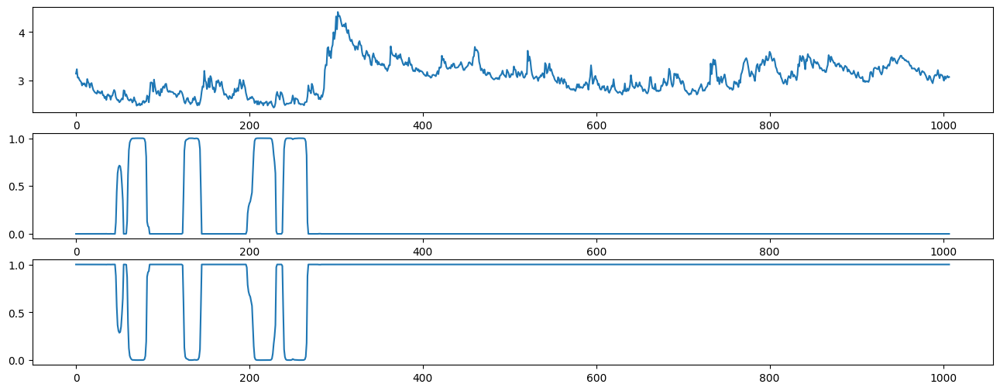


ite=57, max(diff) = 0.014522652765312123

mu_hat0 = [2.5605378  3.10859027], 
sigma_hat0 = [0.05024237 0.30188825], 
P_hat0 = 
[[0.95267899 0.04732101]
 [0.00525911 0.99474089]], 
pi_hat0 = [0. 1.]



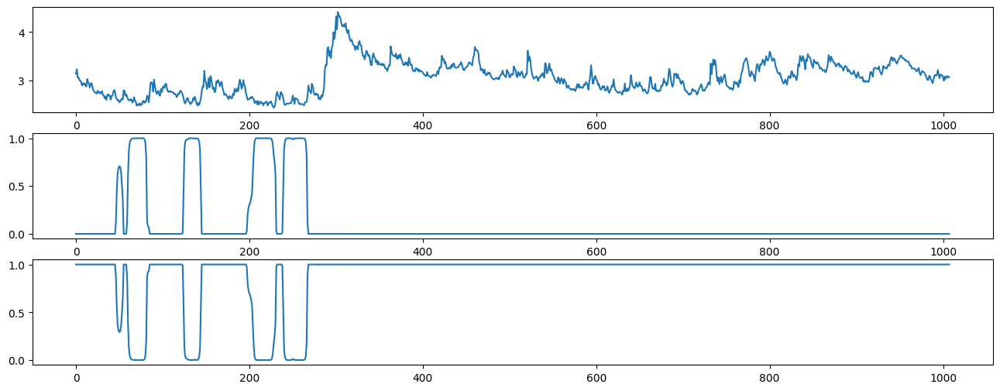


ite=58, max(diff) = 0.01009745951533313

mu_hat0 = [2.56043195 3.10849718], 
sigma_hat0 = [0.05019476 0.30193489], 
P_hat0 = 
[[0.95265988 0.04734012]
 [0.00525116 0.99474884]], 
pi_hat0 = [0. 1.]



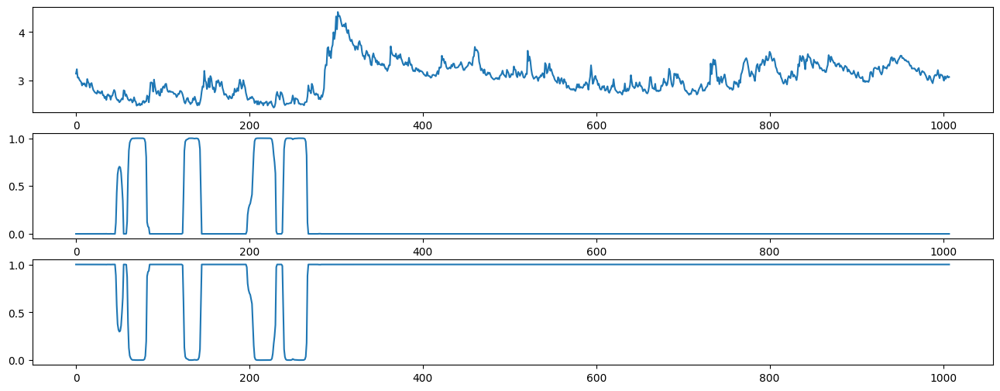


ite=59, max(diff) = 0.007066911442710454

mu_hat1 = [2.56035551 3.10842992], 
sigma_hat1 = [0.05016043 0.3019686 ], 
P_hat1 = 
[[0.95264679 0.04735321]
 [0.00524534 0.99475466]], 
pi_hat1 = [0. 1.]


In [ ]:
#Assume same mu same sigma

# Initialize parameters
T = len(YData)
N = 2

# SET INITIAL GUESSES

mu_hat0 = [2, 4] * np.ones((N))
sigma_hat0 = [0.1, 0.1] * np.ones((N))
P_hat0 = np.zeros((N, N))

P_hat0[0, 0] = 0.85
P_hat0[0, 1] = 1 - P_hat0[0, 0]
P_hat0[1, 1] = 0.90
P_hat0[1, 0] = 1 - P_hat0[1, 1]

pi_hat0 = [0.5, 0.5] * np.ones((N))
for t in range(1, 100):
    pi_hat0 = np.dot(P_hat0.T, pi_hat0)

# Determine maximum number of iterations until convergence and convergence tolerance
itemax = 100
itetol = 1e-2

for ite in range(0, itemax):
    #print(mu_hat0, sigma_hat0, P_hat0, pi_hat0)
    print(f"\nmu_hat0 = {mu_hat0}, \nsigma_hat0 = {sigma_hat0}, \nP_hat0 = \n{P_hat0}, \npi_hat0 = {pi_hat0}")

    # E-step
    xi_prob_t, xi_prob_t1 = forward_alg(
        pi_hat0, N, T, P_hat0, mu_hat0, sigma_hat0, YData
    )
    xi_prob_T = backward_alg(
        xi_prob_t, xi_prob_t1, N, T, P_hat0, mu_hat0, sigma_hat0, YData
    )

    print("")

    plt.subplot(3, 1, 1)
    plt.plot(YData)
    plt.subplot(3, 1, 2)
    plt.plot(xi_prob_T[:, 0])
    plt.subplot(3, 1, 3)
    plt.plot(xi_prob_T[:, 1])
    fig = plt.gcf()
    fig.set_size_inches(16, 6)
    plt.show()
    print("")

    # Compute Pr(s_t+1 = j, s_t = i)
    P_hat_T = np.zeros((N, N, T))
    for tt in range(1, T):
        for ss in range(0, N):
            for ss2 in range(0, N):
                P_hat_T[ss, ss2, tt] = (
                    P_hat0[ss, ss2]
                    * xi_prob_t[tt - 1, ss]
                    * xi_prob_T[tt, ss2]
                    / xi_prob_t1[tt - 1, ss2]
                )
    # M-step
    mu_hat1, sigma_hat1, P_hat1, pi_hat1 = M_step_func(xi_prob_T, P_hat_T, N, T, YData)

    diff = np.zeros((4))
    diff[0] = np.sum(np.absolute(mu_hat1 - mu_hat0)) / (np.min(mu_hat0) + itetol * 1e-2)
    diff[1] = np.sum(np.absolute(sigma_hat1 - sigma_hat0)) / (
        np.min(sigma_hat0) + itetol * 1e-2
    )
    diff[2] = np.sum(np.absolute(np.subtract(P_hat1, P_hat0))) / (
        np.min(P_hat0) + itetol * 1e-2
    )
    diff[3] = np.sum(np.absolute(pi_hat1 - pi_hat0)) / (np.min(pi_hat0) + itetol * 1e-2)

    print(f"ite={ite}, max(diff) = {np.max(diff)}")

    if np.max(diff) > itetol:
        mu_hat0, sigma_hat0, P_hat0, pi_hat0 = mu_hat1, sigma_hat1, P_hat1, pi_hat1
    else:
        print(f"\nmu_hat1 = {mu_hat1}, \nsigma_hat1 = {sigma_hat1}, \nP_hat1 = \n{P_hat1}, \npi_hat1 = {pi_hat1}")
        break

### Different mu same sigma converged and result can serve as a regime detector.

## STEP 2.b.iii With different sigmas same mu


mu_hat0 = [2. 2.], 
sigma_hat0 = [0.1 0.2], 
P_hat0 = 
[[0.85 0.15]
 [0.1  0.9 ]], 
pi_hat0 = [0.4 0.6]



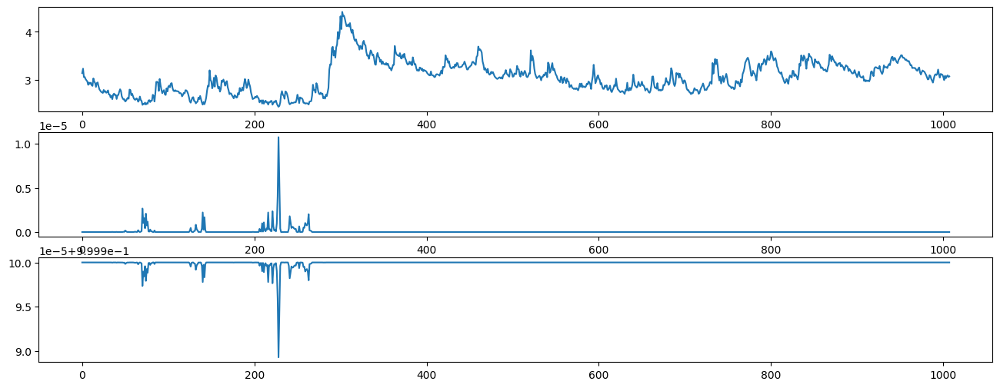


ite=0, max(diff) = 18.978847514835294

mu_hat0 = [2.49553191 3.053828  ], 
sigma_hat0 = [0.03434707 0.33059935], 
P_hat0 = 
[[1.08617652e-04 9.99891382e-01]
 [6.42303690e-08 9.99999936e-01]], 
pi_hat0 = [4.94114646e-23 1.00000000e+00]



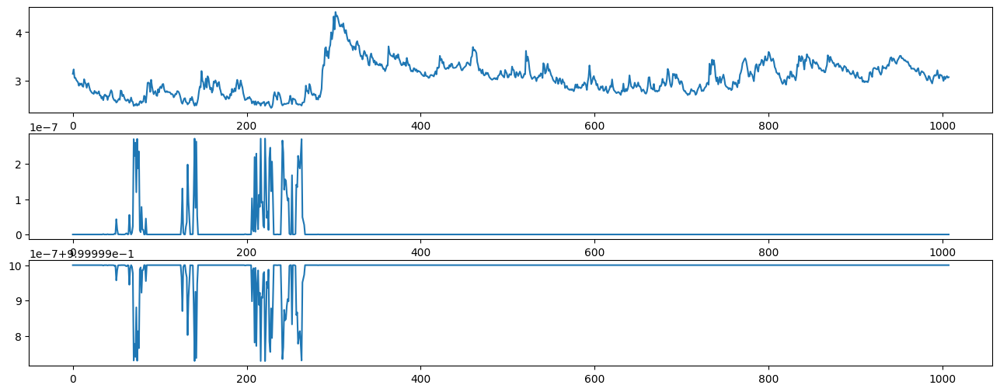


ite=1, max(diff) = 2.094503463520715

mu_hat0 = [2.51488472 3.05382797], 
sigma_hat0 = [0.02499475 0.33059937], 
P_hat0 = 
[[2.13354869e-04 9.99786645e-01]
 [9.00878837e-09 9.99999991e-01]], 
pi_hat0 = [1.16435211e-100 1.00000000e+000]



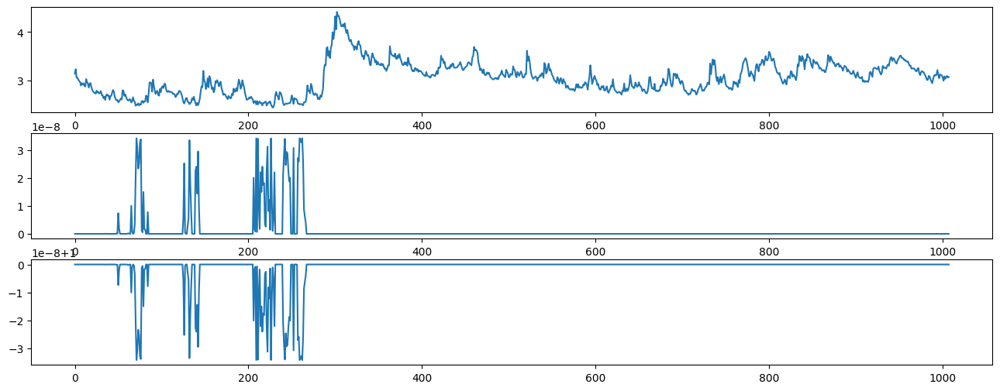


ite=2, max(diff) = 4.182902124118972

mu_hat0 = [2.5215626  3.05382796], 
sigma_hat0 = [0.02052789 0.33059937], 
P_hat0 = 
[[4.22511101e-04 9.99577489e-01]
 [1.29296290e-09 9.99999999e-01]], 
pi_hat0 = [1.1771483e-238 1.0000000e+000]



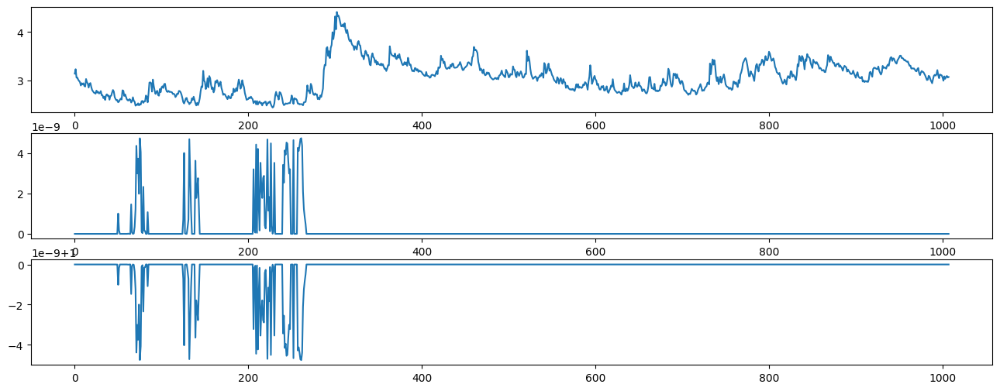


ite=3, max(diff) = 6.379902608036609

mu_hat0 = [2.52491156 3.05382796], 
sigma_hat0 = [0.01790667 0.33059937], 
P_hat0 = 
[[7.41509233e-04 9.99258491e-01]
 [1.69931859e-10 1.00000000e+00]], 
pi_hat0 = [0. 1.]



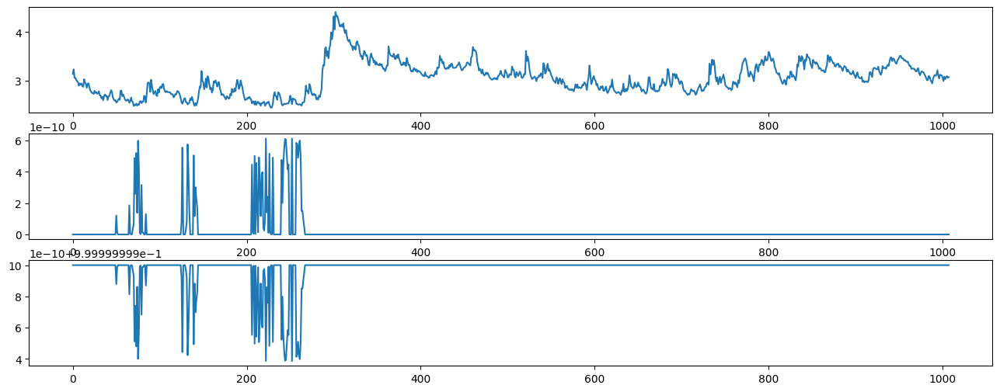


ite=4, max(diff) = 8.283638427765657

mu_hat0 = [2.52702882 3.05382796], 
sigma_hat0 = [0.01606208 0.33059937], 
P_hat0 = 
[[1.15569171e-03 9.98844308e-01]
 [2.05067030e-11 1.00000000e+00]], 
pi_hat0 = [0. 1.]



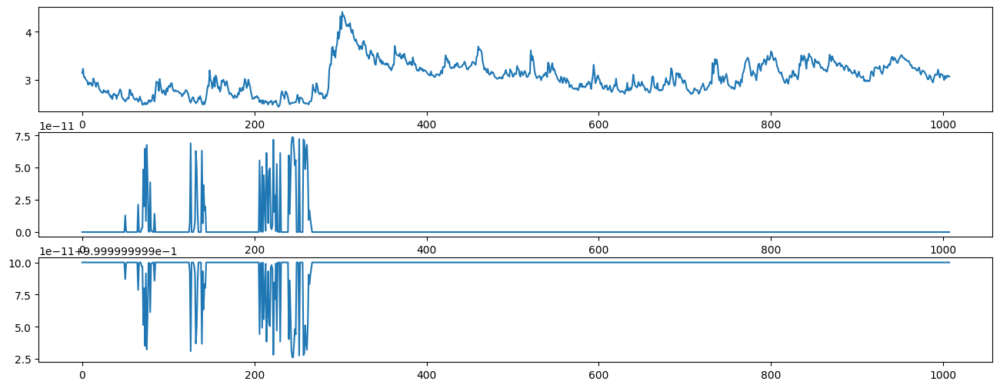


ite=5, max(diff) = 9.480872670815423

mu_hat0 = [2.5285468  3.05382796], 
sigma_hat0 = [0.0146079  0.33059937], 
P_hat0 = 
[[1.62973542e-03 9.98370265e-01]
 [2.29191955e-12 1.00000000e+00]], 
pi_hat0 = [0. 1.]



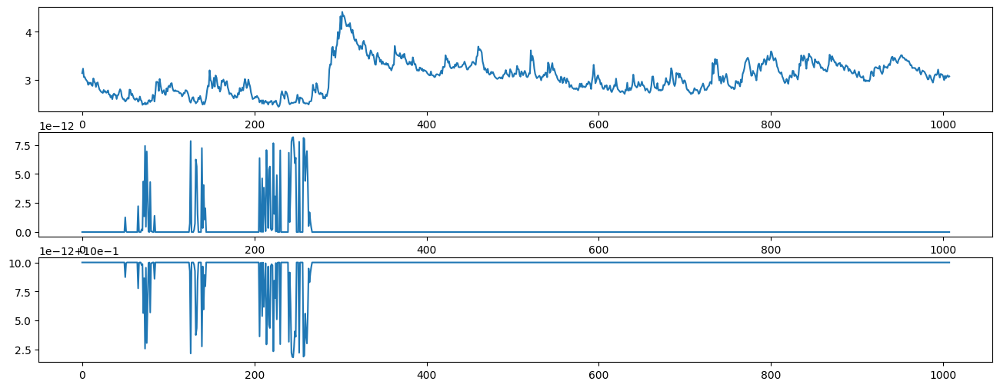


ite=6, max(diff) = 9.706870705366178

mu_hat0 = [2.52971904 3.05382796], 
sigma_hat0 = [0.01338847 0.33059937], 
P_hat0 = 
[[2.11507897e-03 9.97884921e-01]
 [2.38547578e-13 1.00000000e+00]], 
pi_hat0 = [0. 1.]



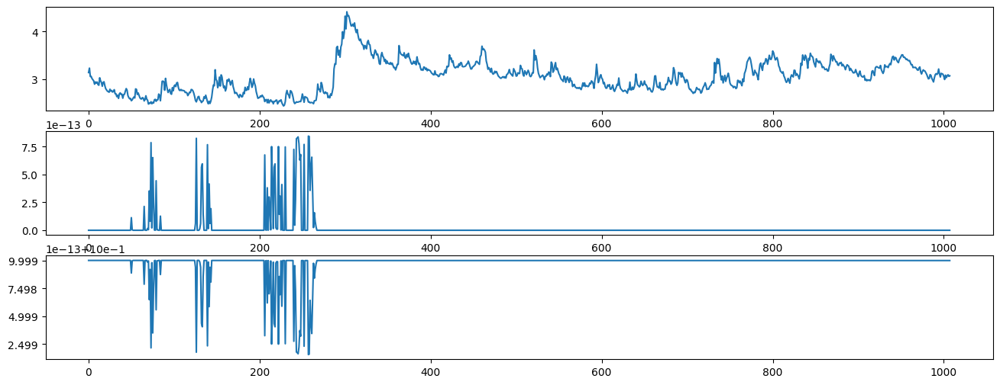


ite=7, max(diff) = 8.941082254318834

mu_hat0 = [2.53067482 3.05382796], 
sigma_hat0 = [0.01232735 0.33059937], 
P_hat0 = 
[[2.56213308e-03 9.97437867e-01]
 [2.32010838e-14 1.00000000e+00]], 
pi_hat0 = [0. 1.]



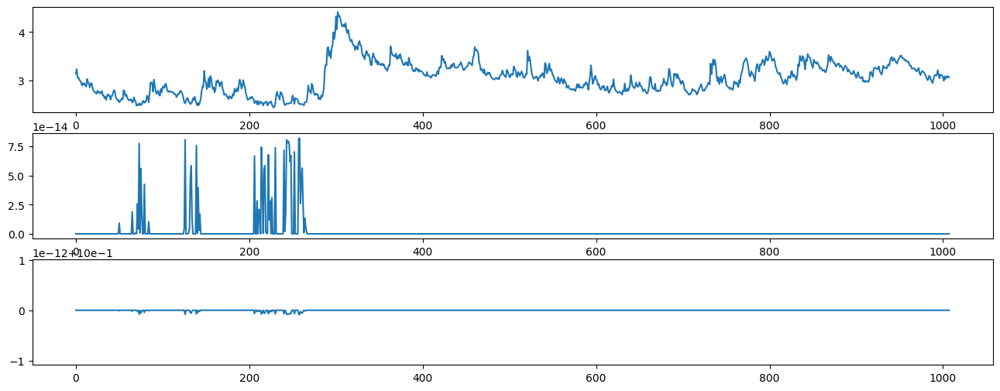


ite=8, max(diff) = 7.353965811600412

mu_hat0 = [2.53149241 3.05382796], 
sigma_hat0 = [0.01137174 0.33059937], 
P_hat0 = 
[[2.92983137e-03 9.97070169e-01]
 [2.11334395e-15 1.00000000e+00]], 
pi_hat0 = [0. 1.]



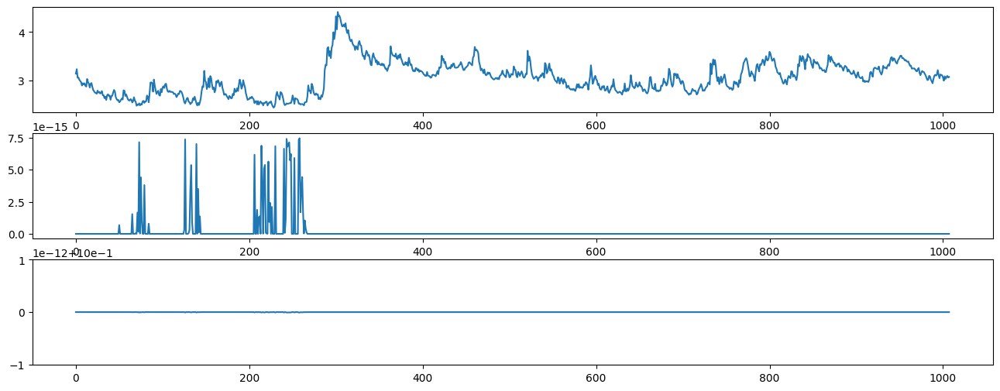


ite=9, max(diff) = 5.183072012334529

mu_hat0 = [2.5322226  3.05382796], 
sigma_hat0 = [0.01047237 0.33059937], 
P_hat0 = 
[[3.18898497e-03 9.96811015e-01]
 [1.80457784e-16 1.00000000e+00]], 
pi_hat0 = [0. 1.]



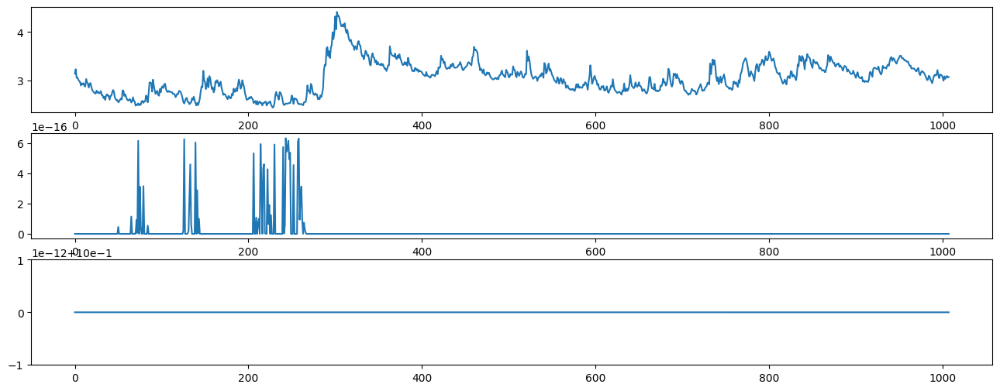


ite=10, max(diff) = 2.632132662063337

mu_hat0 = [2.5328963  3.05382796], 
sigma_hat0 = [0.00957889 0.33059937], 
P_hat0 = 
[[3.32059160e-03 9.96679408e-01]
 [1.44291573e-17 1.00000000e+00]], 
pi_hat0 = [0. 1.]



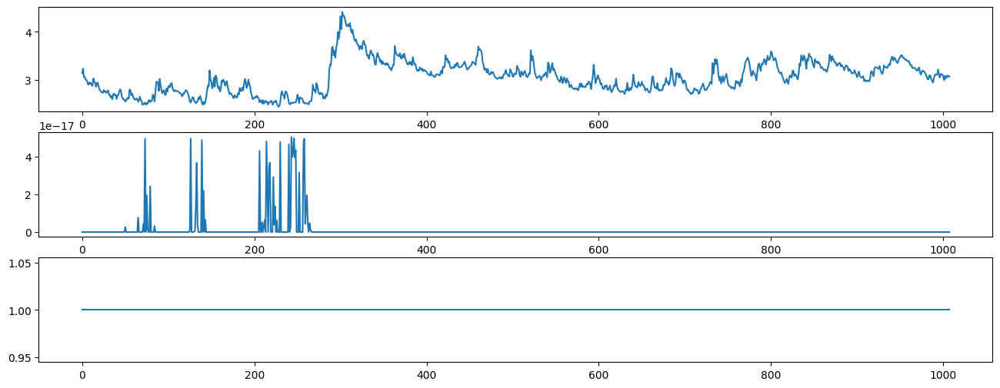


ite=11, max(diff) = 0.18282386917035715

mu_hat0 = [2.53352637 3.05382796], 
sigma_hat0 = [0.00864224 0.33059937], 
P_hat0 = 
[[3.31145041e-03 9.96688550e-01]
 [1.07582824e-18 1.00000000e+00]], 
pi_hat0 = [0. 1.]



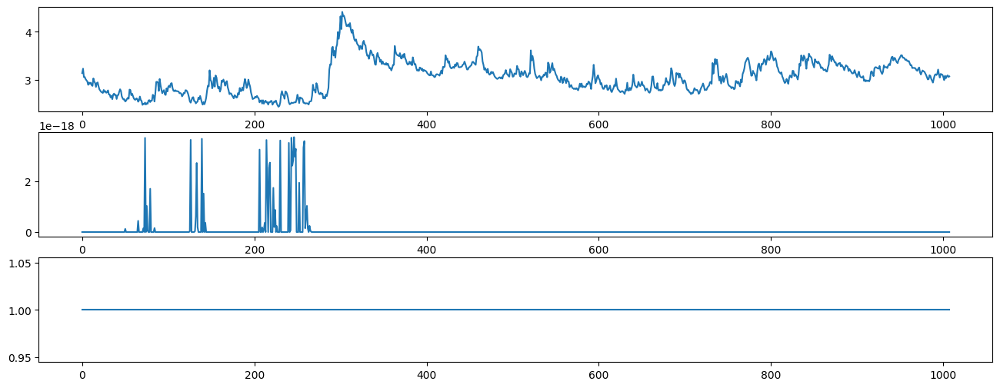


ite=12, max(diff) = 3.274893808626555

mu_hat0 = [2.53410608 3.05382796], 
sigma_hat0 = [0.00762481 0.33059937], 
P_hat0 = 
[[3.14770572e-03 9.96852294e-01]
 [7.41871697e-20 1.00000000e+00]], 
pi_hat0 = [0. 1.]



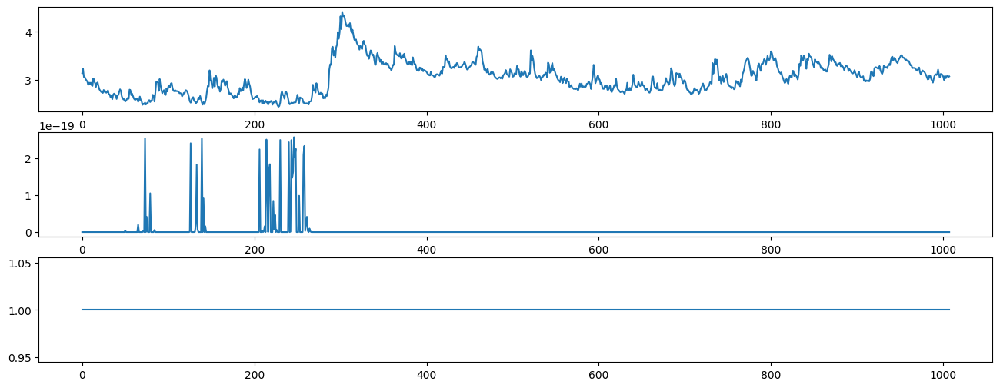


ite=13, max(diff) = 6.812254542410789

mu_hat0 = [2.53460948 3.05382796], 
sigma_hat0 = [0.00652601 0.33059937], 
P_hat0 = 
[[2.80709299e-03 9.97192907e-01]
 [4.67248833e-21 1.00000000e+00]], 
pi_hat0 = [0. 1.]



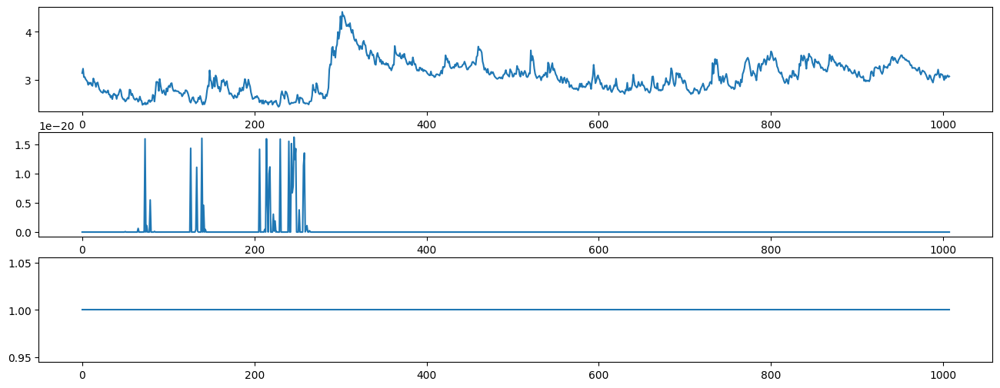


ite=14, max(diff) = 10.862065439923539

mu_hat0 = [2.5350094  3.05382796], 
sigma_hat0 = [0.00541562 0.33059937], 
P_hat0 = 
[[2.26398972e-03 9.97736010e-01]
 [2.64522940e-22 1.00000000e+00]], 
pi_hat0 = [0. 1.]



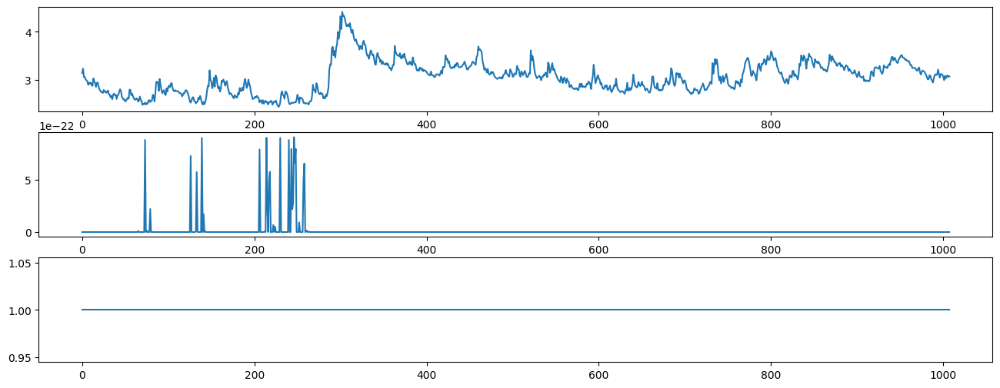


ite=15, max(diff) = 14.278469454526158

mu_hat0 = [2.53530367 3.05382796], 
sigma_hat0 = [0.00441903 0.33059937], 
P_hat0 = 
[[1.55006625e-03 9.98449934e-01]
 [1.32469938e-23 1.00000000e+00]], 
pi_hat0 = [0. 1.]



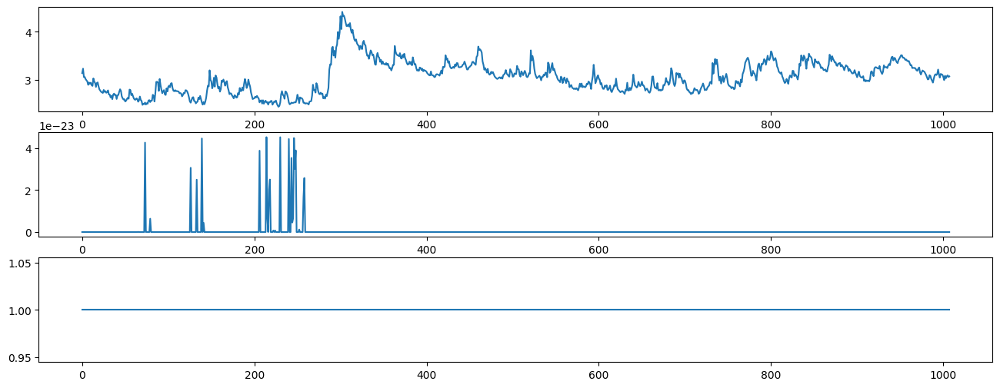


ite=16, max(diff) = 14.129911236768937

mu_hat0 = [2.53549748 3.05382796], 
sigma_hat0 = [0.00362667 0.33059937], 
P_hat0 = 
[[8.43570686e-04 9.99156429e-01]
 [5.80706299e-25 1.00000000e+00]], 
pi_hat0 = [0. 1.]



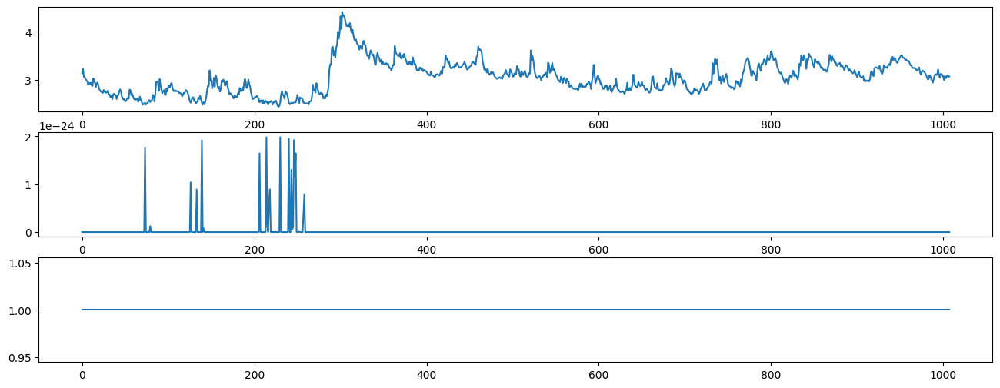


ite=17, max(diff) = 9.739390689871973

mu_hat0 = [2.53559677 3.05382796], 
sigma_hat0 = [0.00303703 0.33059937], 
P_hat0 = 
[[3.56601151e-04 9.99643399e-01]
 [2.22679602e-26 1.00000000e+00]], 
pi_hat0 = [0. 1.]



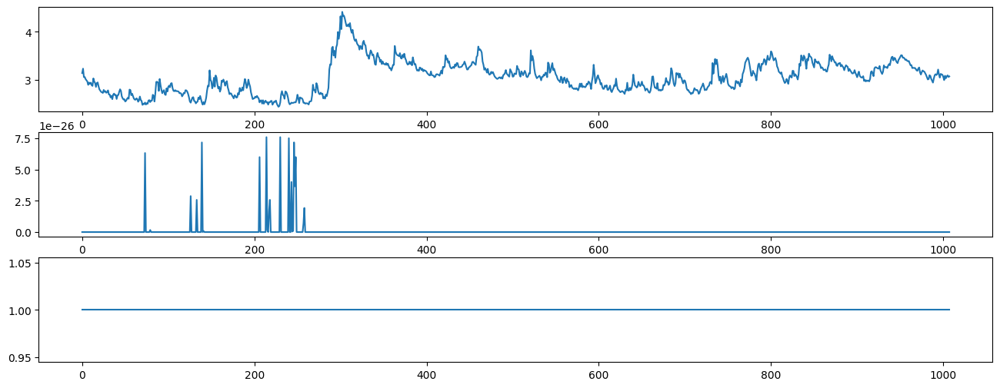


ite=18, max(diff) = 4.776035581648884

mu_hat0 = [2.53562462 3.05382796], 
sigma_hat0 = [0.00260436 0.33059937], 
P_hat0 = 
[[1.17799372e-04 9.99882201e-01]
 [7.52356470e-28 1.00000000e+00]], 
pi_hat0 = [0. 1.]



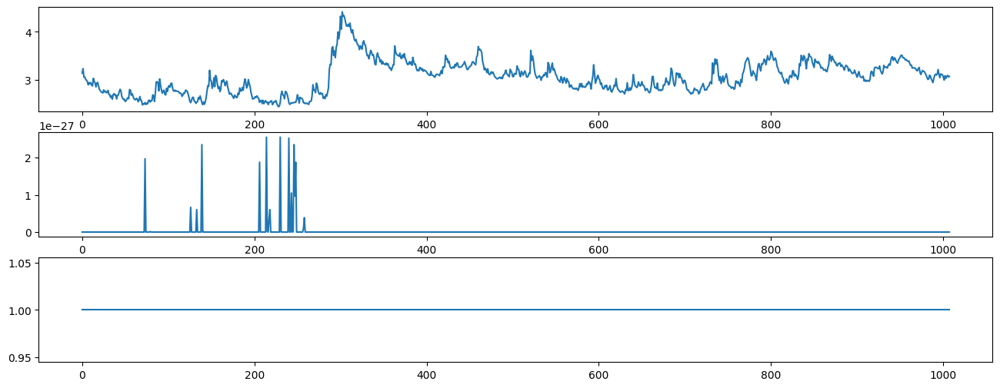


ite=19, max(diff) = 1.7546266181473125

mu_hat0 = [2.53560354 3.05382796], 
sigma_hat0 = [0.00227623 0.33059937], 
P_hat0 = 
[[3.00680413e-05 9.99969932e-01]
 [2.26553304e-29 1.00000000e+00]], 
pi_hat0 = [0. 1.]



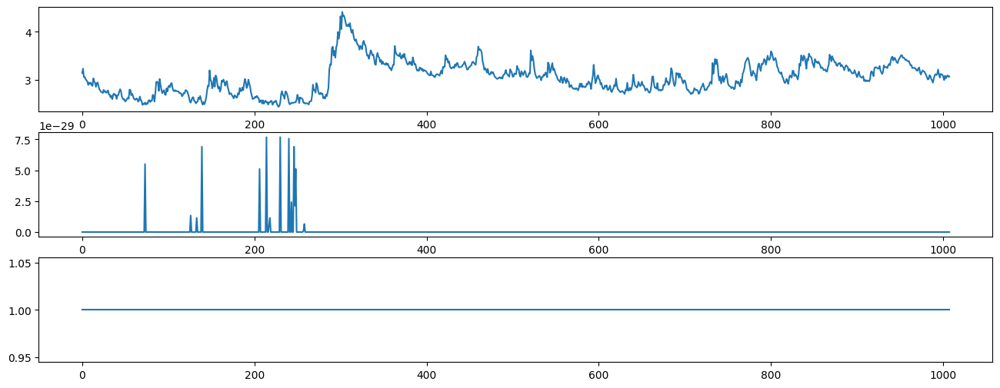


ite=20, max(diff) = 0.48847275559670167

mu_hat0 = [2.53554522 3.05382796], 
sigma_hat0 = [0.00200402 0.33059937], 
P_hat0 = 
[[5.64440353e-06 9.99994356e-01]
 [6.15034370e-31 1.00000000e+00]], 
pi_hat0 = [0. 1.]



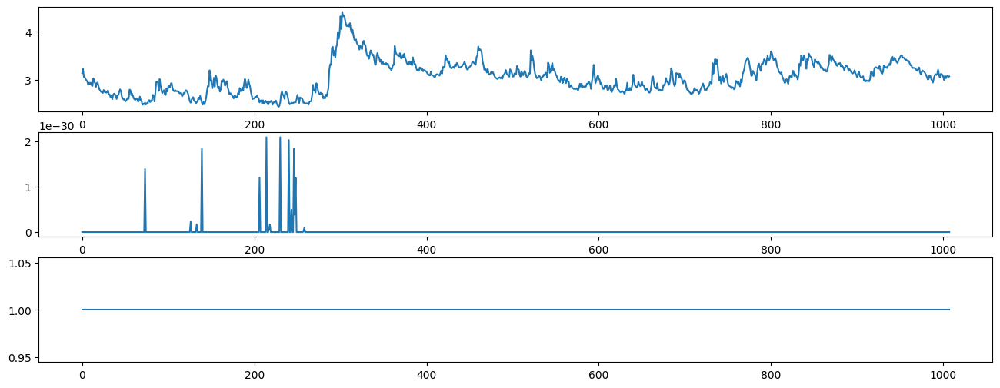


ite=21, max(diff) = 0.12101769291856153

mu_hat0 = [2.53545658 3.05382796], 
sigma_hat0 = [0.00174939 0.33059937], 
P_hat0 = 
[[6.98284440e-07 9.99999302e-01]
 [1.51482480e-32 1.00000000e+00]], 
pi_hat0 = [0. 1.]



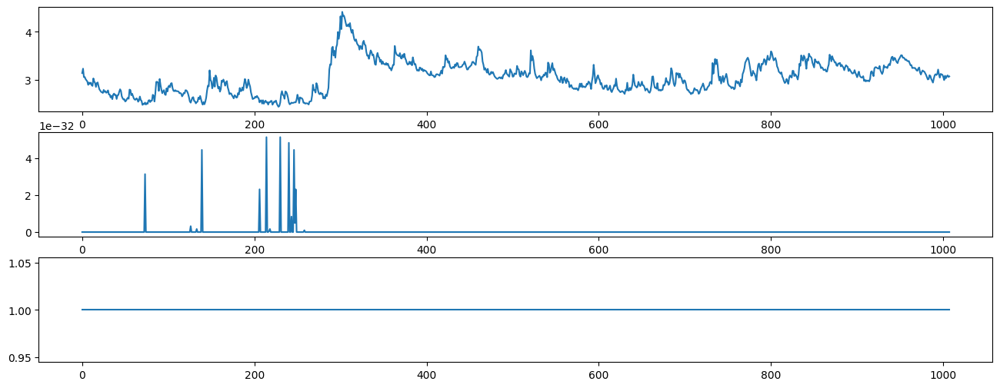


ite=22, max(diff) = 0.141859692816557

mu_hat0 = [2.53534591 3.05382796], 
sigma_hat0 = [0.00148704 0.33059937], 
P_hat0 = 
[[4.54076023e-08 9.99999955e-01]
 [3.37964964e-34 1.00000000e+00]], 
pi_hat0 = [0. 1.]



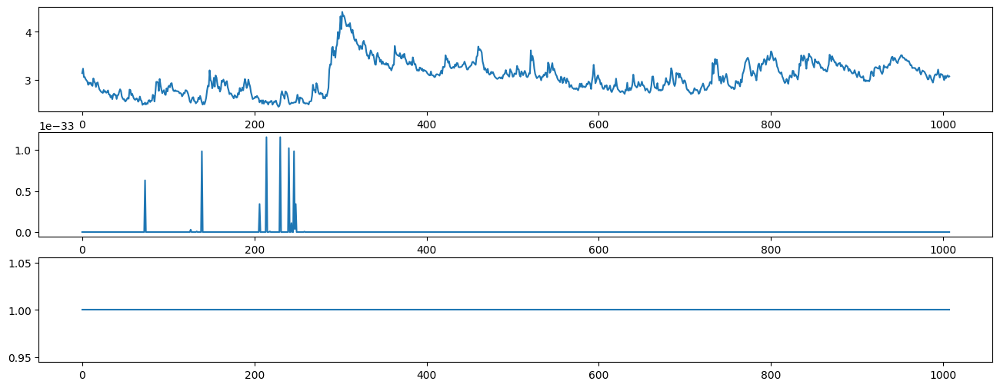


ite=23, max(diff) = 0.17408824688420602

mu_hat0 = [2.53522506 3.05382796], 
sigma_hat0 = [0.00121075 0.33059937], 
P_hat0 = 
[[9.67203521e-10 9.99999999e-01]
 [6.76537241e-36 1.00000000e+00]], 
pi_hat0 = [0. 1.]



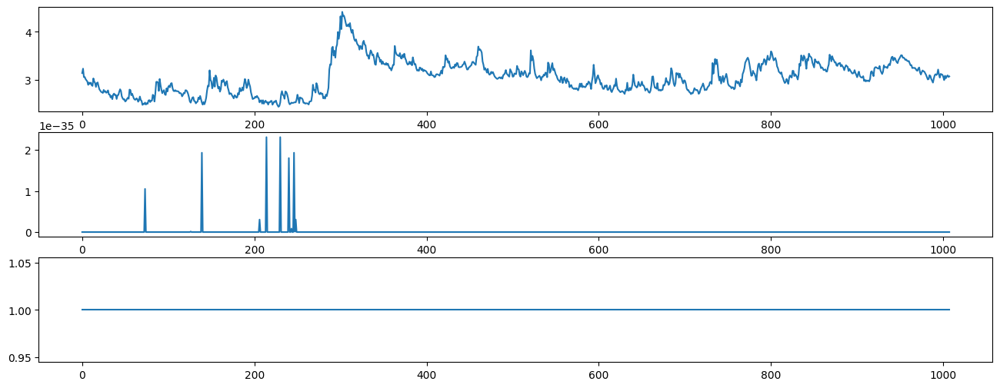


ite=24, max(diff) = 0.21073181842307917

mu_hat0 = [2.53510536 3.05382796], 
sigma_hat0 = [0.00093454 0.33059937], 
P_hat0 = 
[[2.48641354e-12 1.00000000e+00]
 [1.19792616e-37 1.00000000e+00]], 
pi_hat0 = [0. 1.]



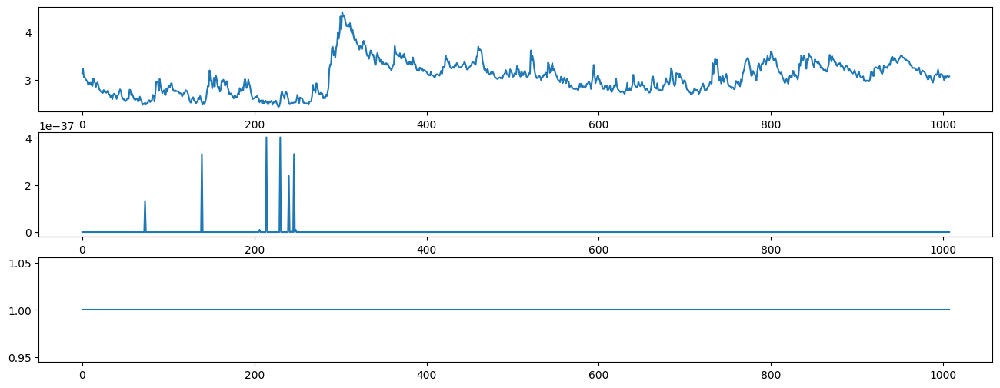


ite=25, max(diff) = 0.23216807519368152

mu_hat0 = [2.53500954 3.05382796], 
sigma_hat0 = [0.00069435 0.33059937], 
P_hat0 = 
[[8.71883318e-17 1.00000000e+00]
 [1.84777507e-39 1.00000000e+00]], 
pi_hat0 = [0. 1.]



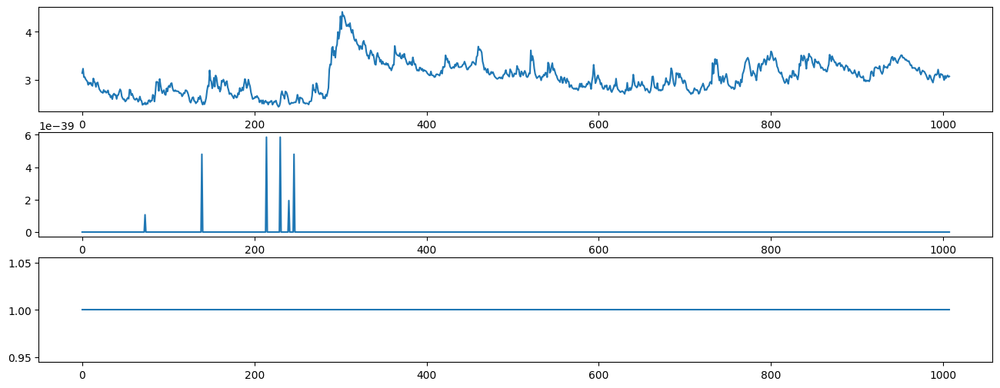


ite=26, max(diff) = 0.17380550819771143

mu_hat0 = [2.53496439 3.05382796], 
sigma_hat0 = [0.00055629 0.33059937], 
P_hat0 = 
[[5.16211861e-25 1.00000000e+00]
 [2.41447675e-41 1.00000000e+00]], 
pi_hat0 = [0. 1.]



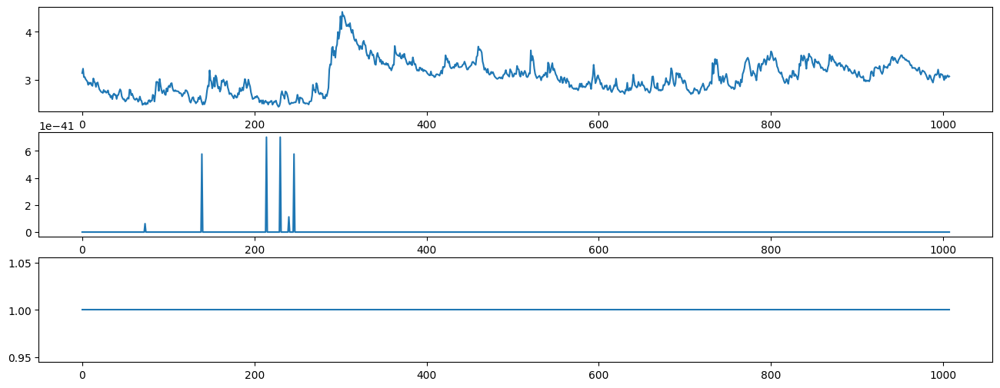


ite=27, max(diff) = 0.11058333952455358

mu_hat0 = [2.53494451 3.05382796], 
sigma_hat0 = [0.00048371 0.33059937], 
P_hat0 = 
[[5.67352701e-38 1.00000000e+00]
 [2.71096595e-43 1.00000000e+00]], 
pi_hat0 = [0. 1.]



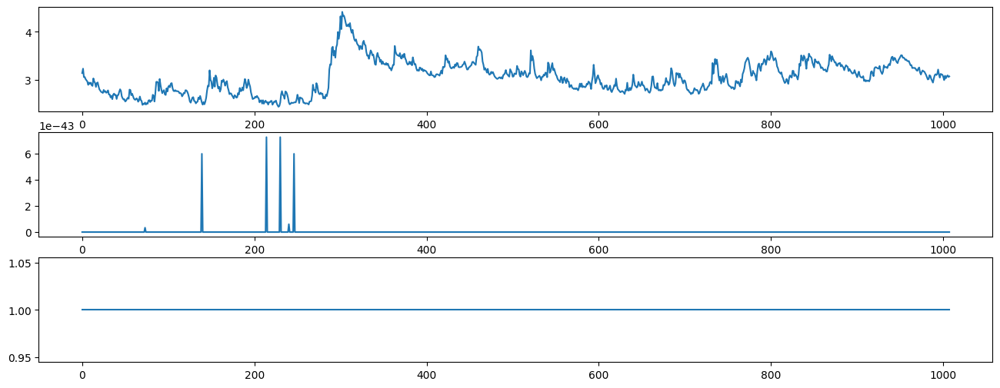


ite=28, max(diff) = 0.06693262153709018

mu_hat0 = [2.53493481 3.05382796], 
sigma_hat0 = [0.00044464 0.33059937], 
P_hat0 = 
[[3.30233079e-55 1.00000000e+00]
 [2.72512896e-45 1.00000000e+00]], 
pi_hat0 = [0. 1.]



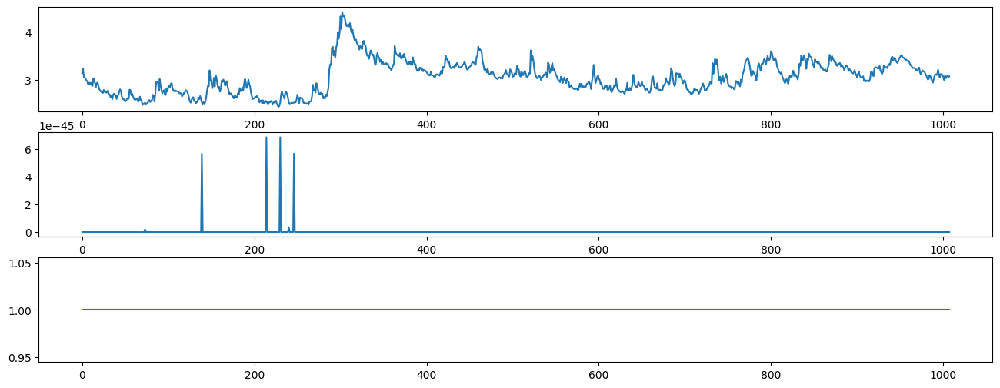


ite=29, max(diff) = 0.033639116835682124

mu_hat0 = [2.53493028 3.05382796], 
sigma_hat0 = [0.00042632 0.33059937], 
P_hat0 = 
[[1.15245830e-75 1.00000000e+00]
 [2.54437927e-47 1.00000000e+00]], 
pi_hat0 = [0. 1.]



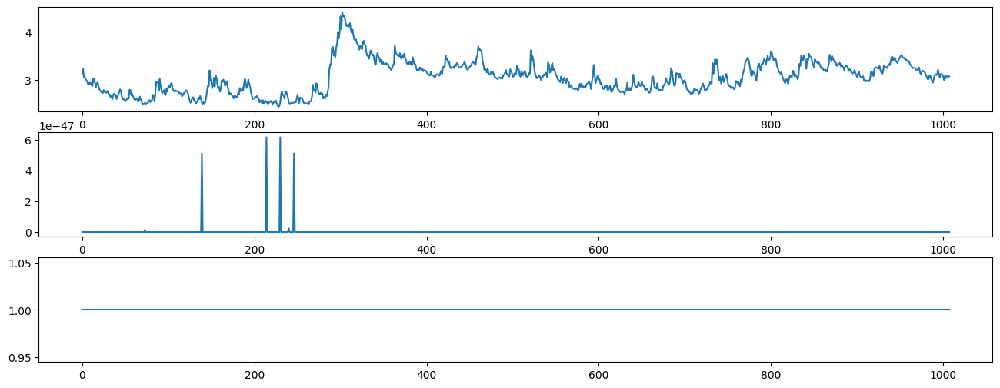


ite=30, max(diff) = 0.013942946008631982

mu_hat0 = [2.53492818 3.05382796], 
sigma_hat0 = [0.00041898 0.33059937], 
P_hat0 = 
[[5.96933362e-98 1.00000000e+00]
 [2.28347440e-49 1.00000000e+00]], 
pi_hat0 = [0. 1.]



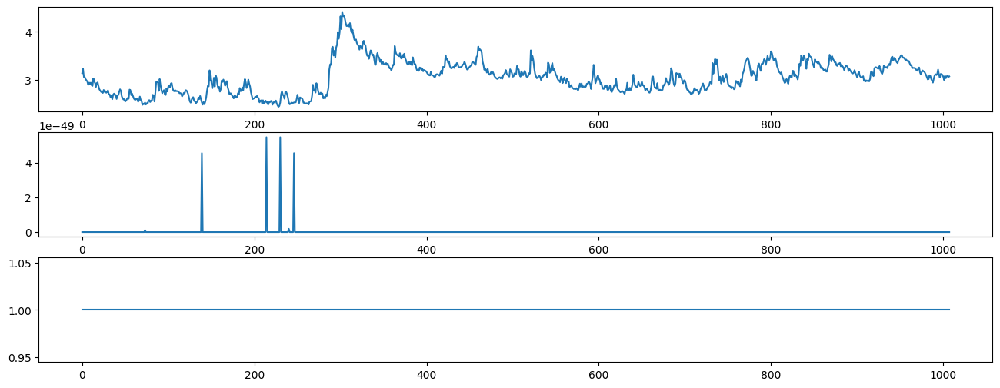


ite=31, max(diff) = 0.005102634106157239

mu_hat1 = [2.53492705 3.05382796], 
sigma_hat1 = [0.00041634 0.33059937], 
P_hat1 = 
[[4.85549578e-121 1.00000000e+000]
 [2.01490615e-051 1.00000000e+000]], 
pi_hat1 = [0. 1.]


In [ ]:
#Assume different mu same sigma
# Initialize parameters
T = len(YData)
N = 2

# SET INITIAL GUESSES

mu_hat0 = [2, 2] * np.ones((N))
sigma_hat0 = [0.1, 0.2] * np.ones((N))
P_hat0 = np.zeros((N, N))

P_hat0[0, 0] = 0.85
P_hat0[0, 1] = 1 - P_hat0[0, 0]
P_hat0[1, 1] = 0.90
P_hat0[1, 0] = 1 - P_hat0[1, 1]

pi_hat0 = [0.5, 0.5] * np.ones((N))
for t in range(1, 100):
    pi_hat0 = np.dot(P_hat0.T, pi_hat0)

# Determine maximum number of iterations until convergence and convergence tolerance
itemax = 100
itetol = 1e-2

for ite in range(0, itemax):
    #print(mu_hat0, sigma_hat0, P_hat0, pi_hat0)
    print(f"\nmu_hat0 = {mu_hat0}, \nsigma_hat0 = {sigma_hat0}, \nP_hat0 = \n{P_hat0}, \npi_hat0 = {pi_hat0}")

    # E-step
    xi_prob_t, xi_prob_t1 = forward_alg(
        pi_hat0, N, T, P_hat0, mu_hat0, sigma_hat0, YData
    )
    xi_prob_T = backward_alg(
        xi_prob_t, xi_prob_t1, N, T, P_hat0, mu_hat0, sigma_hat0, YData
    )

    print("")

    plt.subplot(3, 1, 1)
    plt.plot(YData)
    plt.subplot(3, 1, 2)
    plt.plot(xi_prob_T[:, 0])
    plt.subplot(3, 1, 3)
    plt.plot(xi_prob_T[:, 1])
    fig = plt.gcf()
    fig.set_size_inches(16, 6)
    plt.show()
    print("")

    # Compute Pr(s_t+1 = j, s_t = i)
    P_hat_T = np.zeros((N, N, T))
    for tt in range(1, T):
        for ss in range(0, N):
            for ss2 in range(0, N):
                P_hat_T[ss, ss2, tt] = (
                    P_hat0[ss, ss2]
                    * xi_prob_t[tt - 1, ss]
                    * xi_prob_T[tt, ss2]
                    / xi_prob_t1[tt - 1, ss2]
                )
    # M-step
    mu_hat1, sigma_hat1, P_hat1, pi_hat1 = M_step_func(xi_prob_T, P_hat_T, N, T, YData)

    diff = np.zeros((4))
    diff[0] = np.sum(np.absolute(mu_hat1 - mu_hat0)) / (np.min(mu_hat0) + itetol * 1e-2)
    diff[1] = np.sum(np.absolute(sigma_hat1 - sigma_hat0)) / (
        np.min(sigma_hat0) + itetol * 1e-2
    )
    diff[2] = np.sum(np.absolute(np.subtract(P_hat1, P_hat0))) / (
        np.min(P_hat0) + itetol * 1e-2
    )
    diff[3] = np.sum(np.absolute(pi_hat1 - pi_hat0)) / (np.min(pi_hat0) + itetol * 1e-2)

    print(f"ite={ite}, max(diff) = {np.max(diff)}")

    if np.max(diff) > itetol:
        mu_hat0, sigma_hat0, P_hat0, pi_hat0 = mu_hat1, sigma_hat1, P_hat1, pi_hat1
    else:
        print(f"\nmu_hat1 = {mu_hat1}, \nsigma_hat1 = {sigma_hat1}, \nP_hat1 = \n{P_hat1}, \npi_hat1 = {pi_hat1}")
        break

### different sigma same mu converged but did not behave well, this cannot be used as a regime detector.


mu_hat0 = [2. 2.], 
sigma_hat0 = [0.1 0.2], 
P_hat0 = 
[[0.85 0.15]
 [0.1  0.9 ]], 
pi_hat0 = [0.4 0.6]



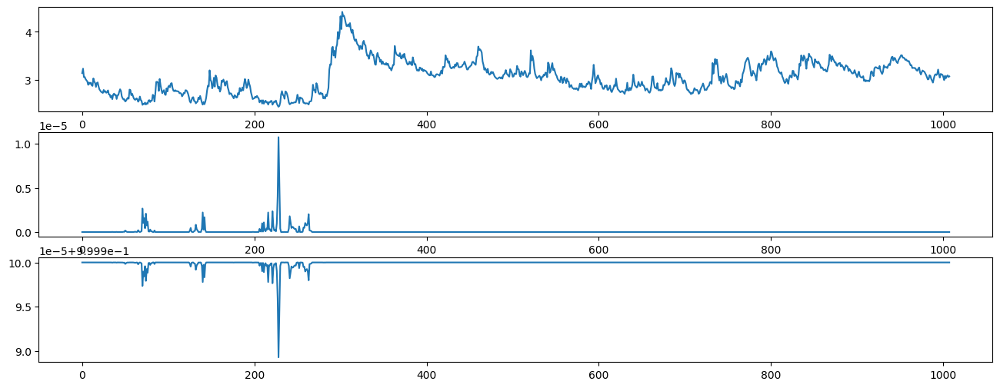


ite=0, max(diff) = 18.978847514835294

mu_hat0 = [2.49553191 3.053828  ], 
sigma_hat0 = [0.03434707 0.33059935], 
P_hat0 = 
[[1.08617652e-04 9.99891382e-01]
 [6.42303690e-08 9.99999936e-01]], 
pi_hat0 = [4.94114646e-23 1.00000000e+00]



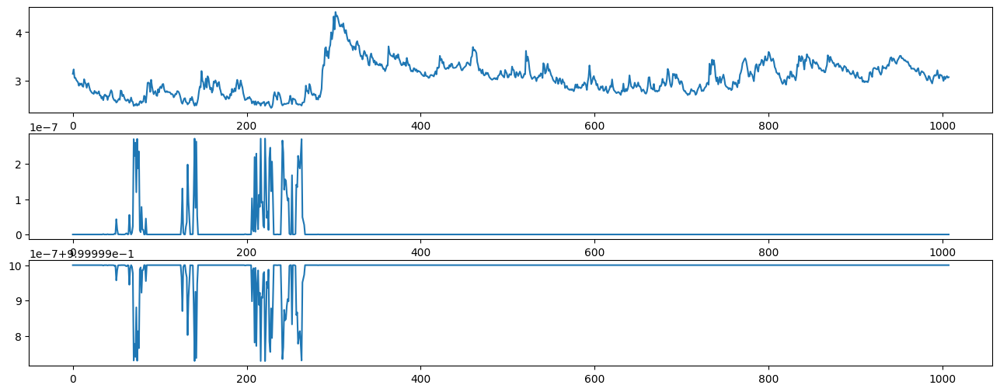


ite=1, max(diff) = 2.094503463520715

mu_hat0 = [2.51488472 3.05382797], 
sigma_hat0 = [0.02499475 0.33059937], 
P_hat0 = 
[[2.13354869e-04 9.99786645e-01]
 [9.00878837e-09 9.99999991e-01]], 
pi_hat0 = [1.16435211e-100 1.00000000e+000]



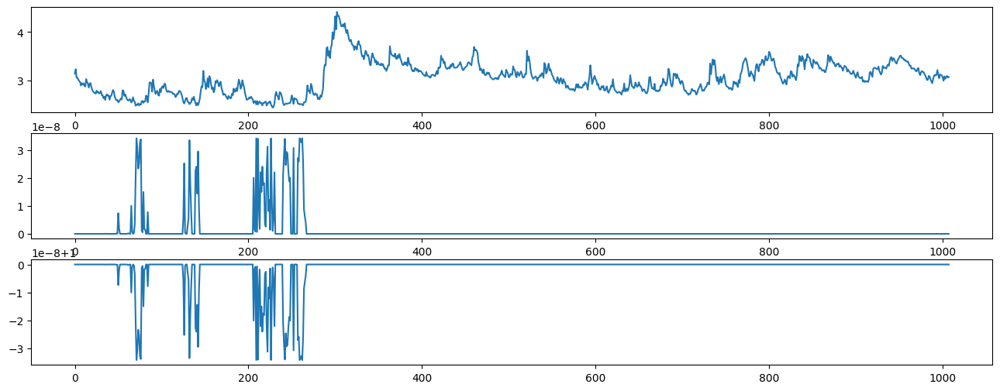


ite=2, max(diff) = 4.182902124118972

mu_hat0 = [2.5215626  3.05382796], 
sigma_hat0 = [0.02052789 0.33059937], 
P_hat0 = 
[[4.22511101e-04 9.99577489e-01]
 [1.29296290e-09 9.99999999e-01]], 
pi_hat0 = [1.1771483e-238 1.0000000e+000]



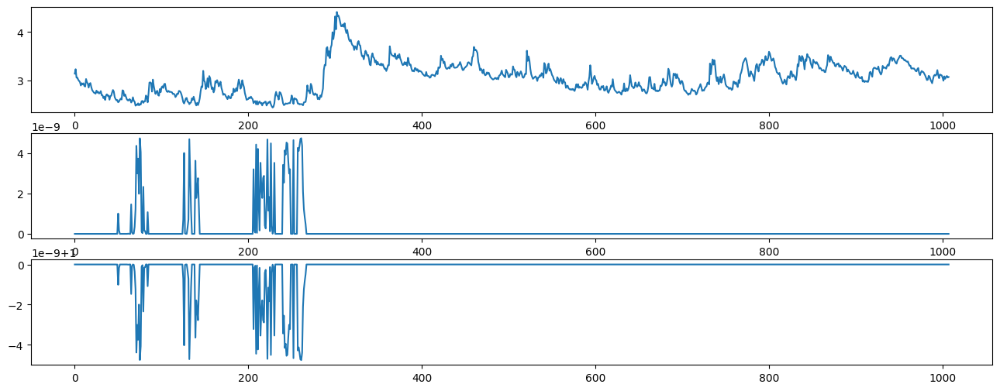


ite=3, max(diff) = 6.379902608036609

mu_hat0 = [2.52491156 3.05382796], 
sigma_hat0 = [0.01790667 0.33059937], 
P_hat0 = 
[[7.41509233e-04 9.99258491e-01]
 [1.69931859e-10 1.00000000e+00]], 
pi_hat0 = [0. 1.]



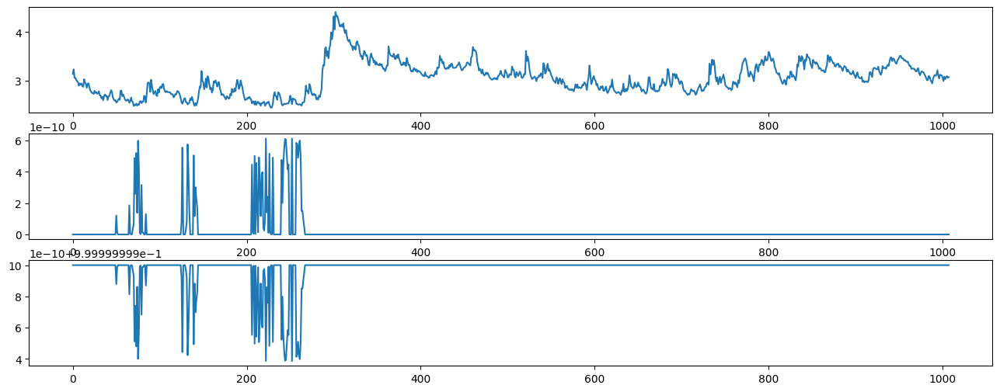


ite=4, max(diff) = 8.283638427765657

mu_hat0 = [2.52702882 3.05382796], 
sigma_hat0 = [0.01606208 0.33059937], 
P_hat0 = 
[[1.15569171e-03 9.98844308e-01]
 [2.05067030e-11 1.00000000e+00]], 
pi_hat0 = [0. 1.]



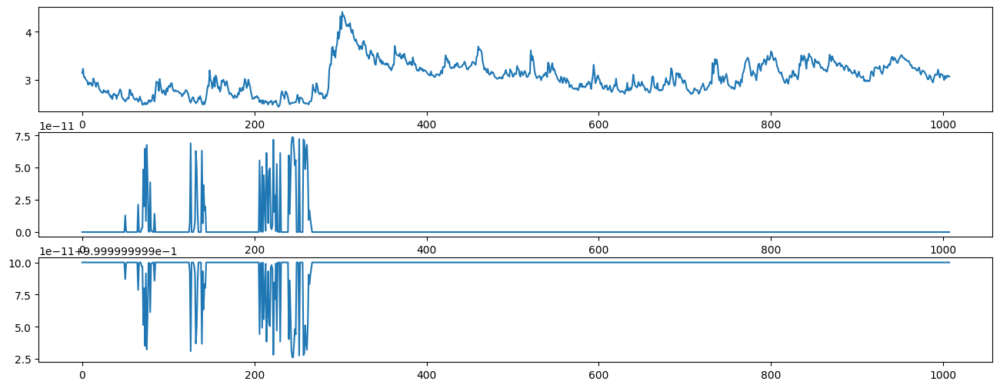


ite=5, max(diff) = 9.480872670815423

mu_hat0 = [2.5285468  3.05382796], 
sigma_hat0 = [0.0146079  0.33059937], 
P_hat0 = 
[[1.62973542e-03 9.98370265e-01]
 [2.29191955e-12 1.00000000e+00]], 
pi_hat0 = [0. 1.]



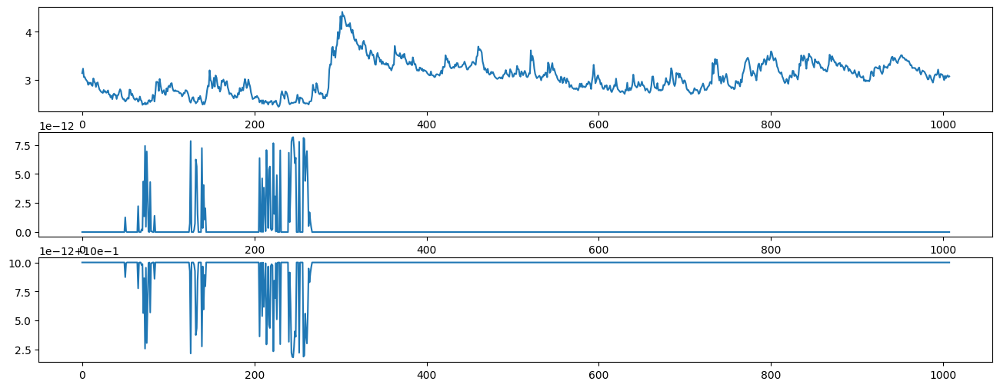


ite=6, max(diff) = 9.706870705366178

mu_hat0 = [2.52971904 3.05382796], 
sigma_hat0 = [0.01338847 0.33059937], 
P_hat0 = 
[[2.11507897e-03 9.97884921e-01]
 [2.38547578e-13 1.00000000e+00]], 
pi_hat0 = [0. 1.]



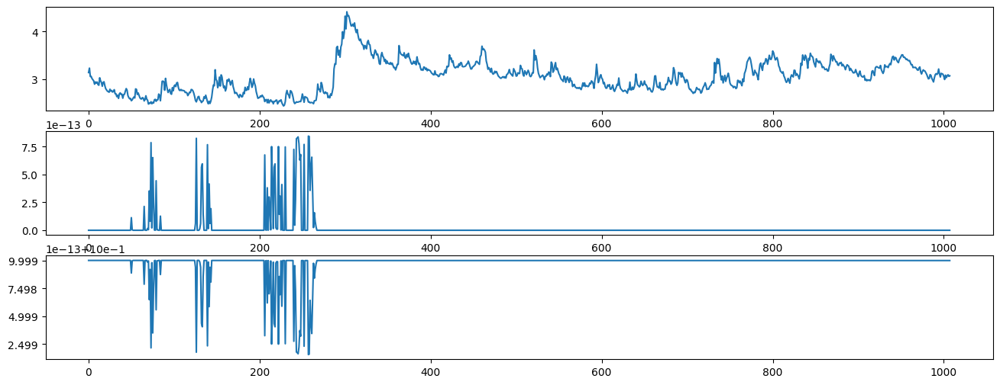


ite=7, max(diff) = 8.941082254318834

mu_hat0 = [2.53067482 3.05382796], 
sigma_hat0 = [0.01232735 0.33059937], 
P_hat0 = 
[[2.56213308e-03 9.97437867e-01]
 [2.32010838e-14 1.00000000e+00]], 
pi_hat0 = [0. 1.]



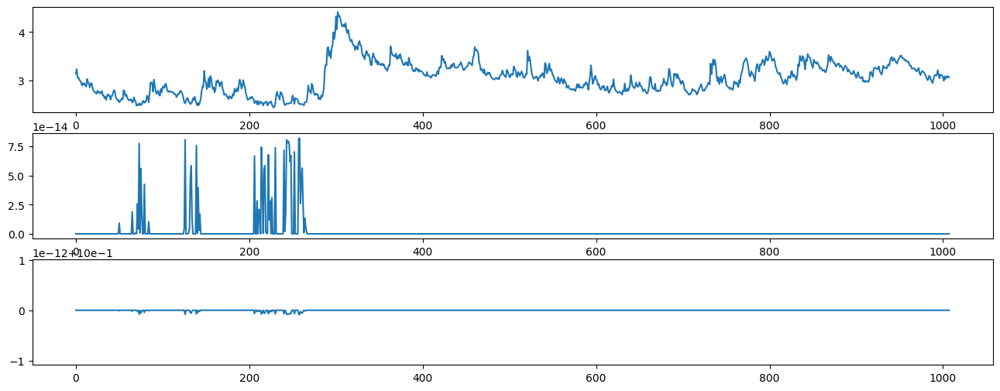


ite=8, max(diff) = 7.353965811600412

mu_hat0 = [2.53149241 3.05382796], 
sigma_hat0 = [0.01137174 0.33059937], 
P_hat0 = 
[[2.92983137e-03 9.97070169e-01]
 [2.11334395e-15 1.00000000e+00]], 
pi_hat0 = [0. 1.]



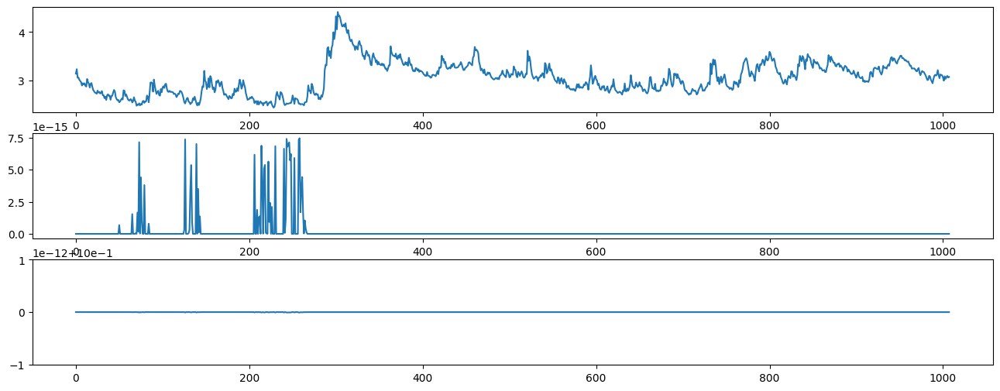


ite=9, max(diff) = 5.183072012334529

mu_hat0 = [2.5322226  3.05382796], 
sigma_hat0 = [0.01047237 0.33059937], 
P_hat0 = 
[[3.18898497e-03 9.96811015e-01]
 [1.80457784e-16 1.00000000e+00]], 
pi_hat0 = [0. 1.]



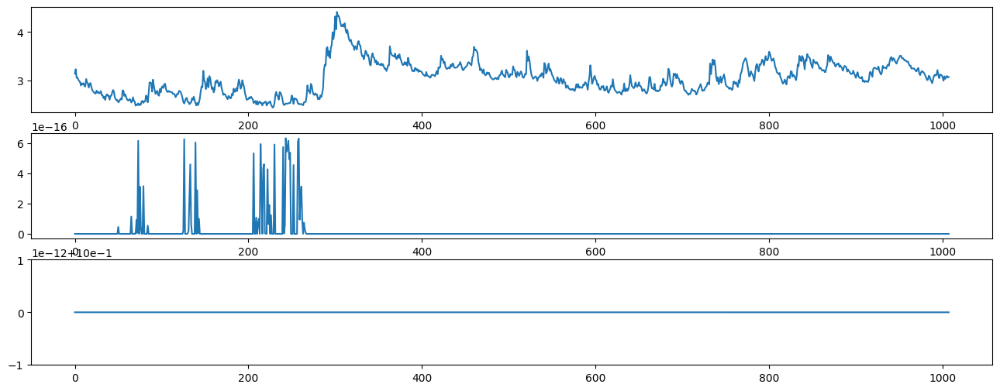


ite=10, max(diff) = 2.632132662063337

mu_hat0 = [2.5328963  3.05382796], 
sigma_hat0 = [0.00957889 0.33059937], 
P_hat0 = 
[[3.32059160e-03 9.96679408e-01]
 [1.44291573e-17 1.00000000e+00]], 
pi_hat0 = [0. 1.]



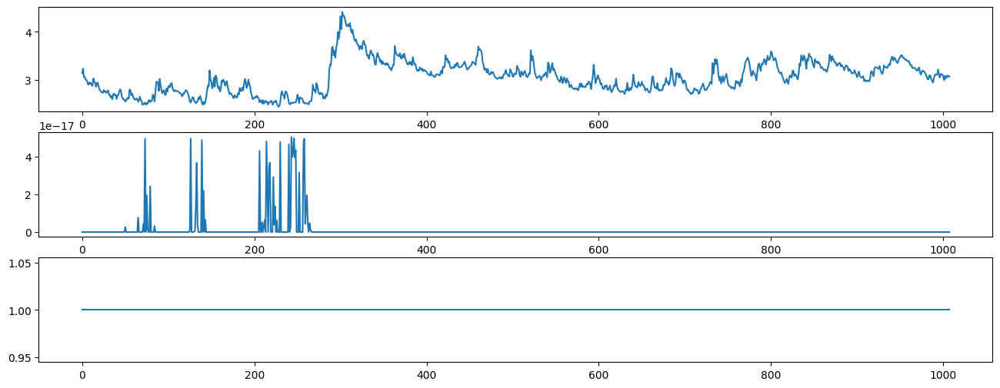


ite=11, max(diff) = 0.18282386917035715

mu_hat0 = [2.53352637 3.05382796], 
sigma_hat0 = [0.00864224 0.33059937], 
P_hat0 = 
[[3.31145041e-03 9.96688550e-01]
 [1.07582824e-18 1.00000000e+00]], 
pi_hat0 = [0. 1.]



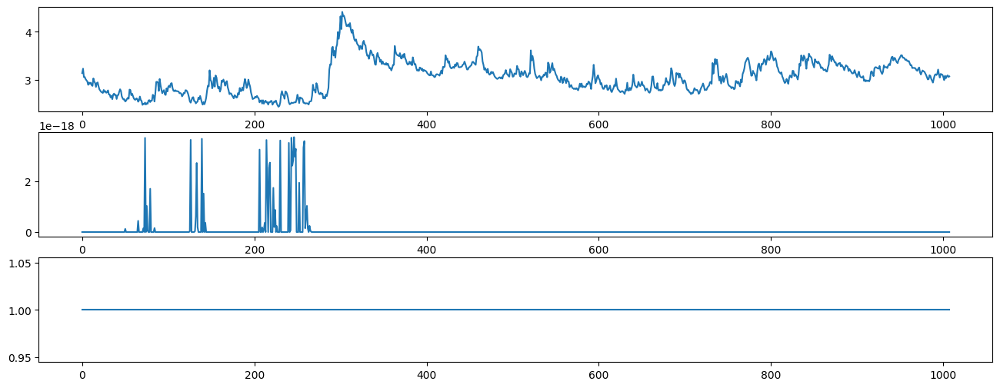


ite=12, max(diff) = 3.274893808626555

mu_hat0 = [2.53410608 3.05382796], 
sigma_hat0 = [0.00762481 0.33059937], 
P_hat0 = 
[[3.14770572e-03 9.96852294e-01]
 [7.41871697e-20 1.00000000e+00]], 
pi_hat0 = [0. 1.]



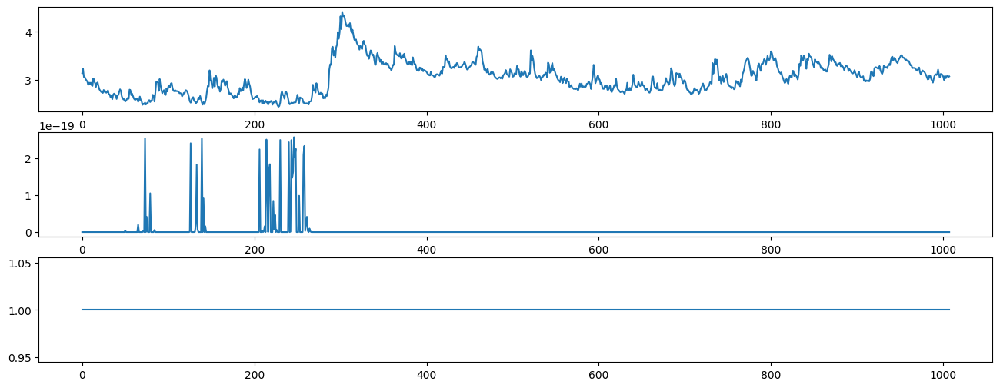


ite=13, max(diff) = 6.812254542410789

mu_hat0 = [2.53460948 3.05382796], 
sigma_hat0 = [0.00652601 0.33059937], 
P_hat0 = 
[[2.80709299e-03 9.97192907e-01]
 [4.67248833e-21 1.00000000e+00]], 
pi_hat0 = [0. 1.]



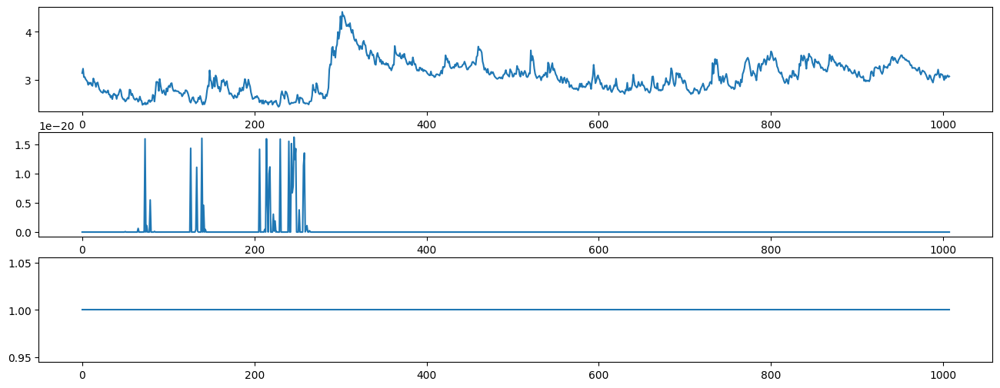


ite=14, max(diff) = 10.862065439923539

mu_hat0 = [2.5350094  3.05382796], 
sigma_hat0 = [0.00541562 0.33059937], 
P_hat0 = 
[[2.26398972e-03 9.97736010e-01]
 [2.64522940e-22 1.00000000e+00]], 
pi_hat0 = [0. 1.]



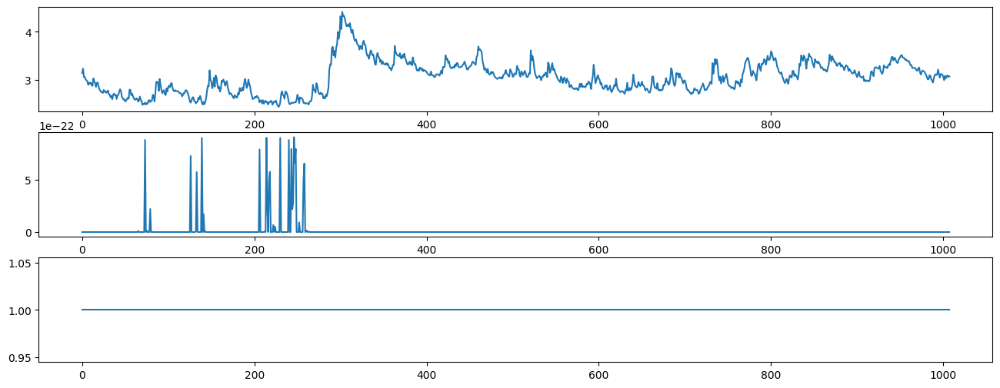


ite=15, max(diff) = 14.278469454526158

mu_hat0 = [2.53530367 3.05382796], 
sigma_hat0 = [0.00441903 0.33059937], 
P_hat0 = 
[[1.55006625e-03 9.98449934e-01]
 [1.32469938e-23 1.00000000e+00]], 
pi_hat0 = [0. 1.]



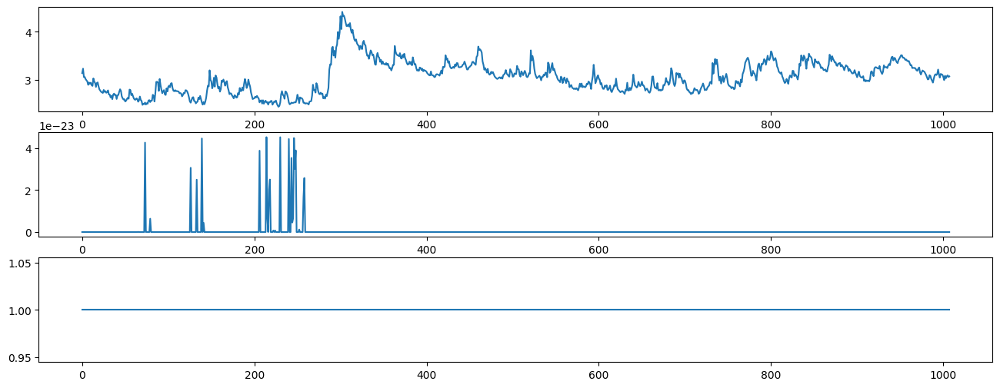


ite=16, max(diff) = 14.129911236768937

mu_hat0 = [2.53549748 3.05382796], 
sigma_hat0 = [0.00362667 0.33059937], 
P_hat0 = 
[[8.43570686e-04 9.99156429e-01]
 [5.80706299e-25 1.00000000e+00]], 
pi_hat0 = [0. 1.]



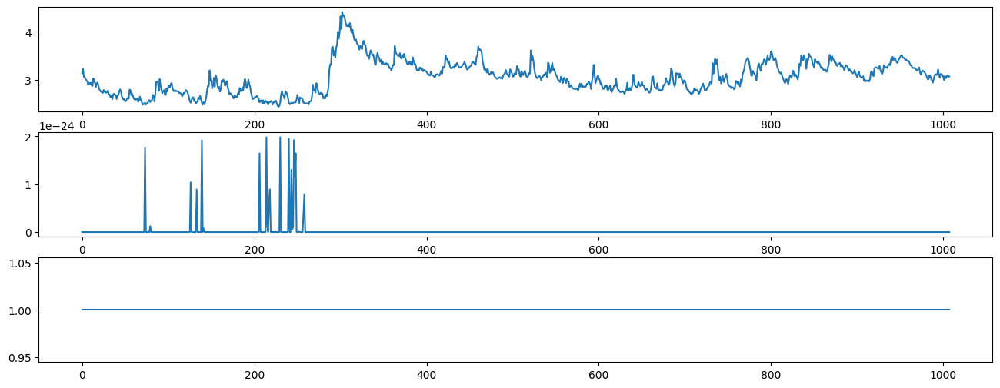


ite=17, max(diff) = 9.739390689871973

mu_hat0 = [2.53559677 3.05382796], 
sigma_hat0 = [0.00303703 0.33059937], 
P_hat0 = 
[[3.56601151e-04 9.99643399e-01]
 [2.22679602e-26 1.00000000e+00]], 
pi_hat0 = [0. 1.]



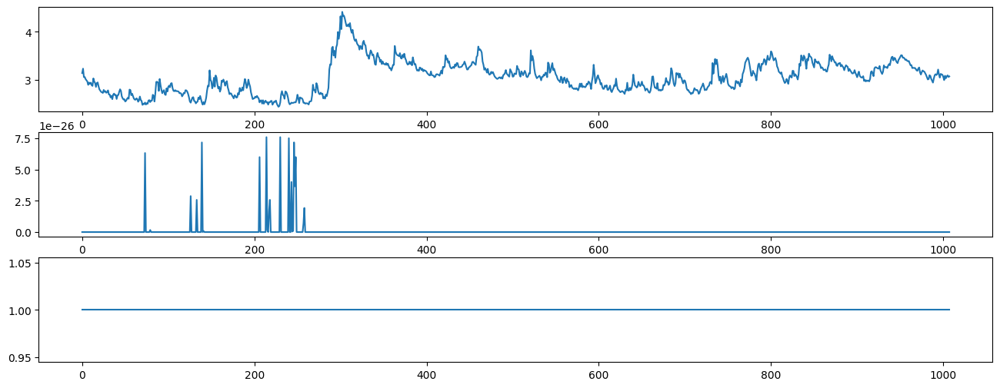


ite=18, max(diff) = 4.776035581648884

mu_hat0 = [2.53562462 3.05382796], 
sigma_hat0 = [0.00260436 0.33059937], 
P_hat0 = 
[[1.17799372e-04 9.99882201e-01]
 [7.52356470e-28 1.00000000e+00]], 
pi_hat0 = [0. 1.]



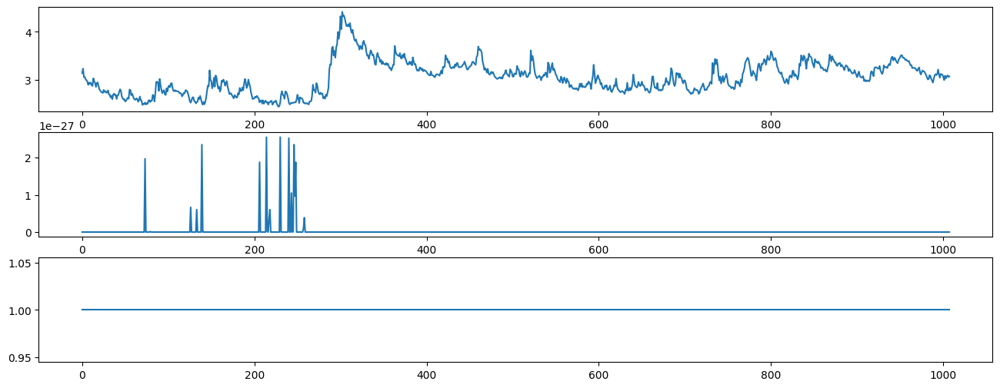


ite=19, max(diff) = 1.7546266181473125

mu_hat0 = [2.53560354 3.05382796], 
sigma_hat0 = [0.00227623 0.33059937], 
P_hat0 = 
[[3.00680413e-05 9.99969932e-01]
 [2.26553304e-29 1.00000000e+00]], 
pi_hat0 = [0. 1.]



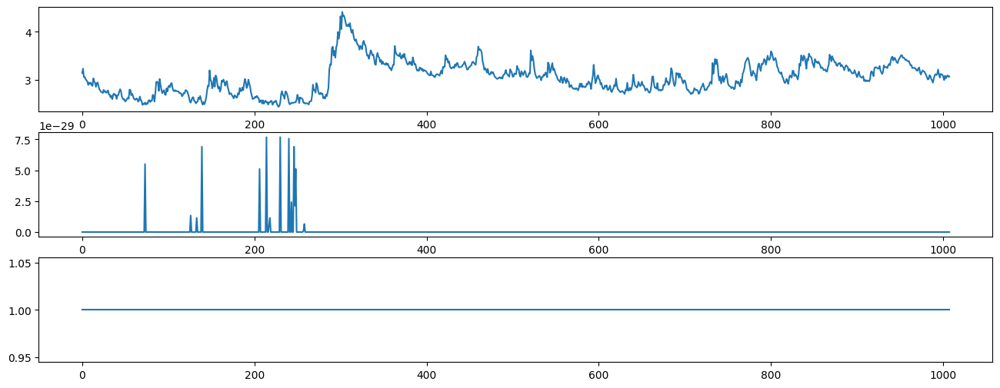


ite=20, max(diff) = 0.48847275559670167

mu_hat0 = [2.53554522 3.05382796], 
sigma_hat0 = [0.00200402 0.33059937], 
P_hat0 = 
[[5.64440353e-06 9.99994356e-01]
 [6.15034370e-31 1.00000000e+00]], 
pi_hat0 = [0. 1.]



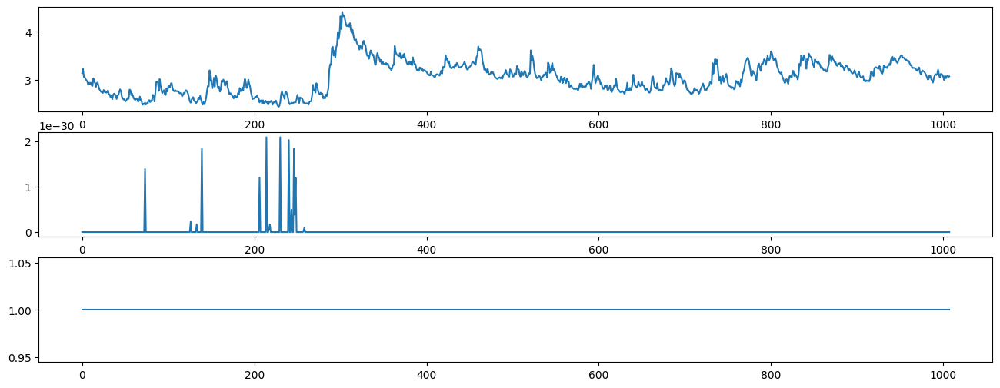


ite=21, max(diff) = 0.12101769291856153

mu_hat0 = [2.53545658 3.05382796], 
sigma_hat0 = [0.00174939 0.33059937], 
P_hat0 = 
[[6.98284440e-07 9.99999302e-01]
 [1.51482480e-32 1.00000000e+00]], 
pi_hat0 = [0. 1.]



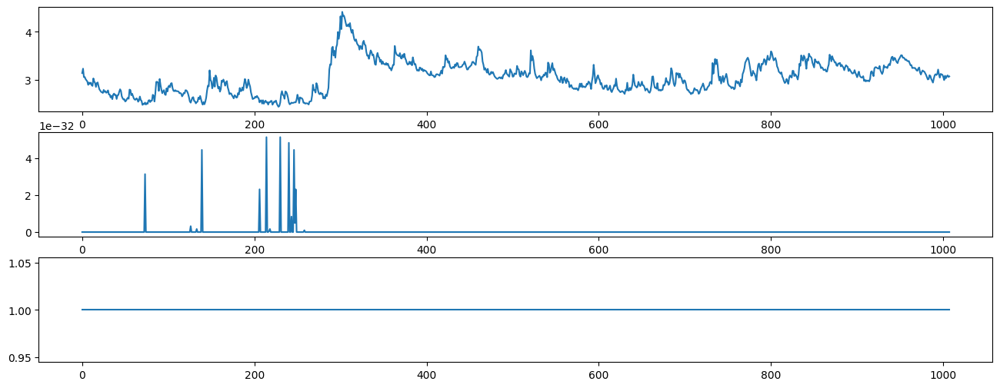


ite=22, max(diff) = 0.141859692816557

mu_hat0 = [2.53534591 3.05382796], 
sigma_hat0 = [0.00148704 0.33059937], 
P_hat0 = 
[[4.54076023e-08 9.99999955e-01]
 [3.37964964e-34 1.00000000e+00]], 
pi_hat0 = [0. 1.]



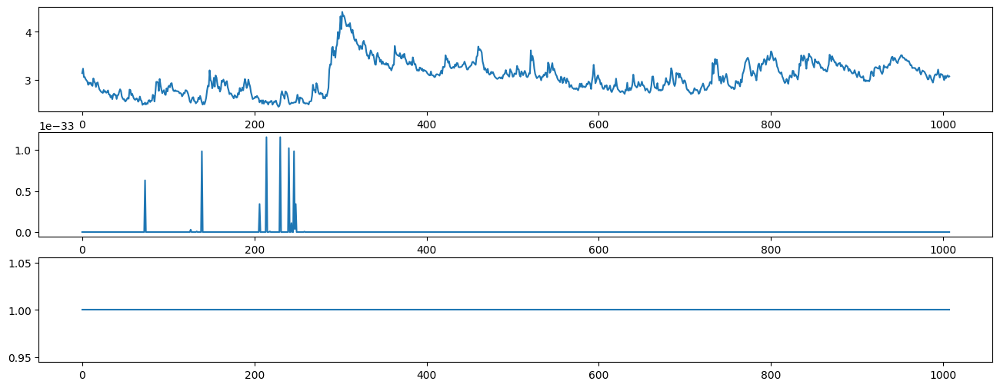


ite=23, max(diff) = 0.17408824688420602

mu_hat0 = [2.53522506 3.05382796], 
sigma_hat0 = [0.00121075 0.33059937], 
P_hat0 = 
[[9.67203521e-10 9.99999999e-01]
 [6.76537241e-36 1.00000000e+00]], 
pi_hat0 = [0. 1.]



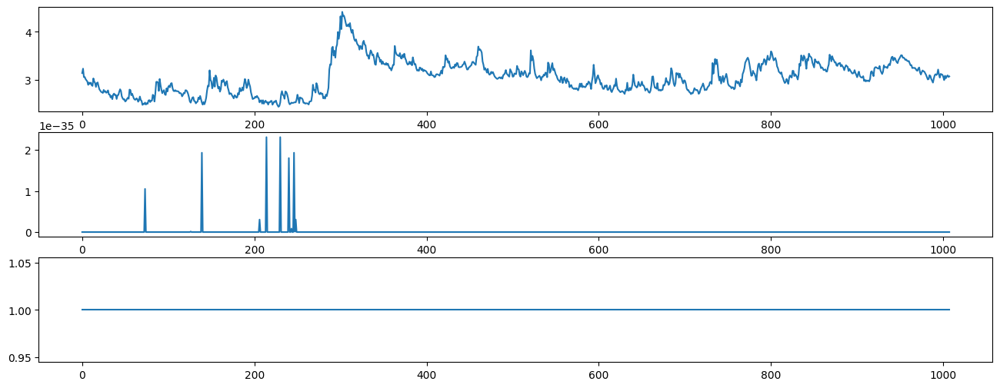


ite=24, max(diff) = 0.21073181842307917

mu_hat0 = [2.53510536 3.05382796], 
sigma_hat0 = [0.00093454 0.33059937], 
P_hat0 = 
[[2.48641354e-12 1.00000000e+00]
 [1.19792616e-37 1.00000000e+00]], 
pi_hat0 = [0. 1.]



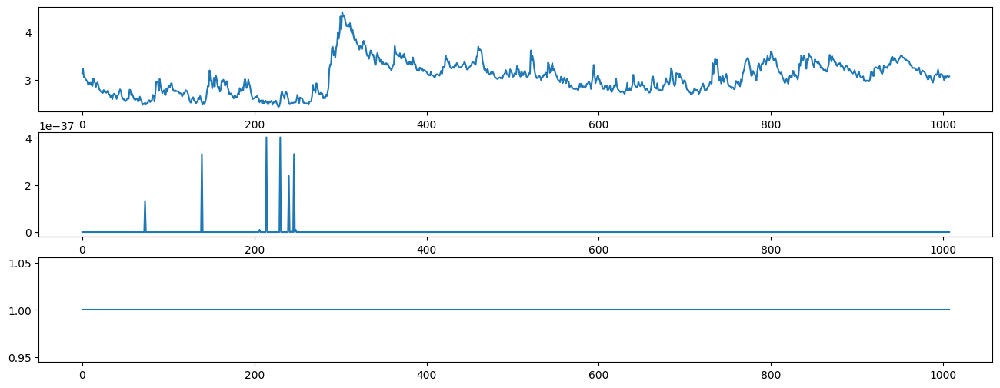


ite=25, max(diff) = 0.23216807519368152

mu_hat0 = [2.53500954 3.05382796], 
sigma_hat0 = [0.00069435 0.33059937], 
P_hat0 = 
[[8.71883318e-17 1.00000000e+00]
 [1.84777507e-39 1.00000000e+00]], 
pi_hat0 = [0. 1.]



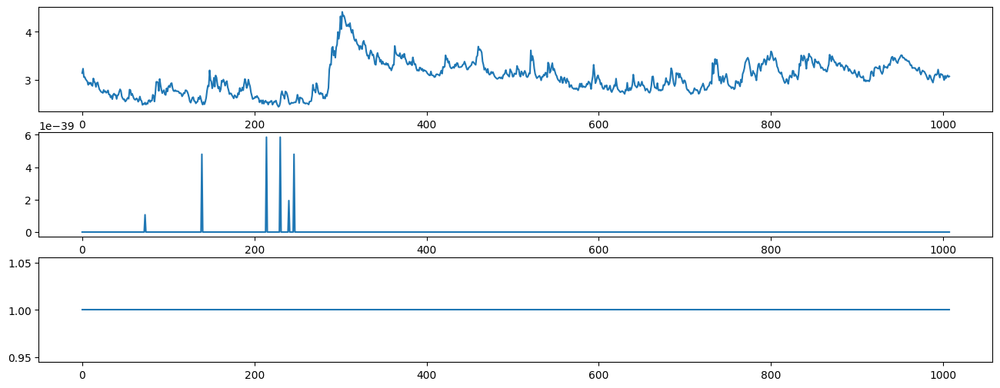


ite=26, max(diff) = 0.17380550819771143

mu_hat0 = [2.53496439 3.05382796], 
sigma_hat0 = [0.00055629 0.33059937], 
P_hat0 = 
[[5.16211861e-25 1.00000000e+00]
 [2.41447675e-41 1.00000000e+00]], 
pi_hat0 = [0. 1.]



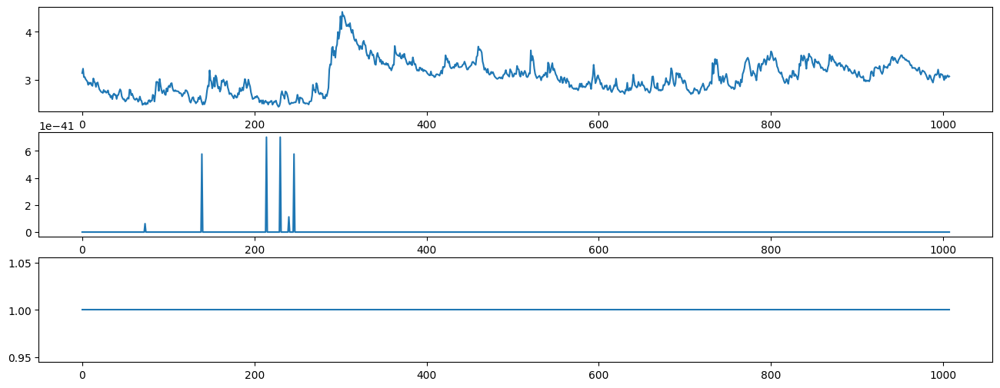


ite=27, max(diff) = 0.11058333952455358

mu_hat0 = [2.53494451 3.05382796], 
sigma_hat0 = [0.00048371 0.33059937], 
P_hat0 = 
[[5.67352701e-38 1.00000000e+00]
 [2.71096595e-43 1.00000000e+00]], 
pi_hat0 = [0. 1.]



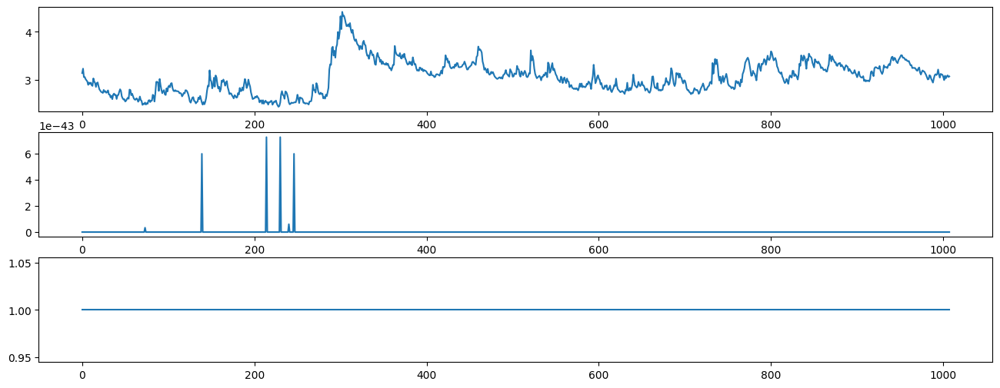


ite=28, max(diff) = 0.06693262153709018

mu_hat0 = [2.53493481 3.05382796], 
sigma_hat0 = [0.00044464 0.33059937], 
P_hat0 = 
[[3.30233079e-55 1.00000000e+00]
 [2.72512896e-45 1.00000000e+00]], 
pi_hat0 = [0. 1.]



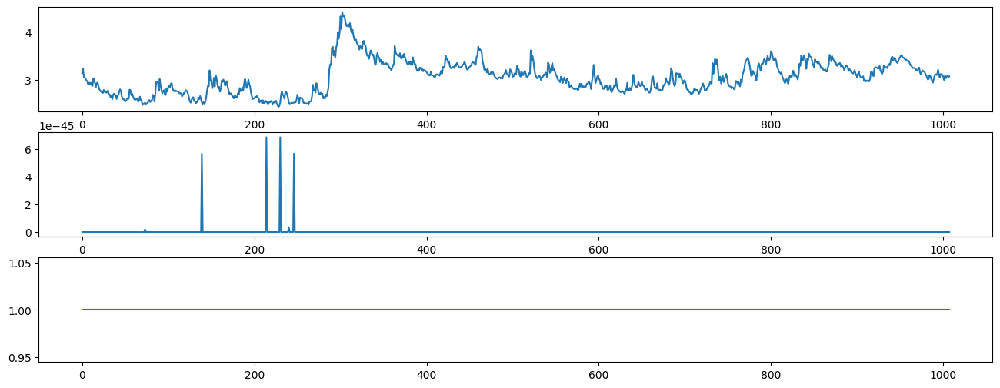


ite=29, max(diff) = 0.033639116835682124

mu_hat0 = [2.53493028 3.05382796], 
sigma_hat0 = [0.00042632 0.33059937], 
P_hat0 = 
[[1.15245830e-75 1.00000000e+00]
 [2.54437927e-47 1.00000000e+00]], 
pi_hat0 = [0. 1.]



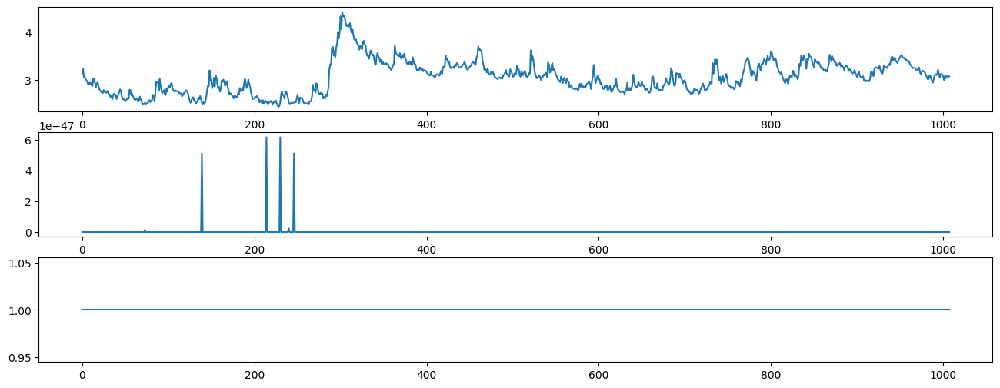


ite=30, max(diff) = 0.013942946008631982

mu_hat0 = [2.53492818 3.05382796], 
sigma_hat0 = [0.00041898 0.33059937], 
P_hat0 = 
[[5.96933362e-98 1.00000000e+00]
 [2.28347440e-49 1.00000000e+00]], 
pi_hat0 = [0. 1.]



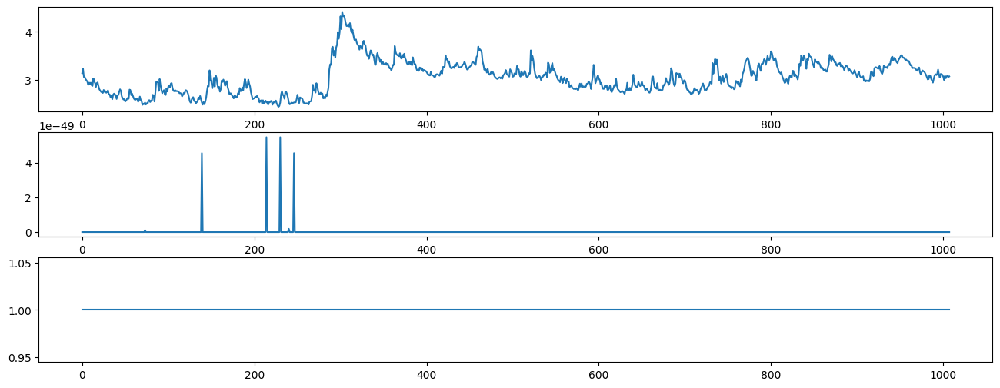


ite=31, max(diff) = 0.005102634106157239

mu_hat1 = [2.53492705 3.05382796], 
sigma_hat1 = [0.00041634 0.33059937], 
P_hat1 = 
[[4.85549578e-121 1.00000000e+000]
 [2.01490615e-051 1.00000000e+000]], 
pi_hat1 = [0. 1.]


In [ ]:
#Assume same mu different sigma
# Initialize parameters
T = len(YData)
N = 2

# SET INITIAL GUESSES

mu_hat0 = [2, 2] * np.ones((N))
sigma_hat0 = [0.1, 0.2] * np.ones((N))
P_hat0 = np.zeros((N, N))

P_hat0[0, 0] = 0.85
P_hat0[0, 1] = 1 - P_hat0[0, 0]
P_hat0[1, 1] = 0.90
P_hat0[1, 0] = 1 - P_hat0[1, 1]

pi_hat0 = [0.5, 0.5] * np.ones((N))
for t in range(1, 100):
    pi_hat0 = np.dot(P_hat0.T, pi_hat0)

# Determine maximum number of iterations until convergence and convergence tolerance
itemax = 100
itetol = 1e-2

for ite in range(0, itemax):
    #print(mu_hat0, sigma_hat0, P_hat0, pi_hat0)
    print(f"\nmu_hat0 = {mu_hat0}, \nsigma_hat0 = {sigma_hat0}, \nP_hat0 = \n{P_hat0}, \npi_hat0 = {pi_hat0}")

    # E-step
    xi_prob_t, xi_prob_t1 = forward_alg(
        pi_hat0, N, T, P_hat0, mu_hat0, sigma_hat0, YData
    )
    xi_prob_T = backward_alg(
        xi_prob_t, xi_prob_t1, N, T, P_hat0, mu_hat0, sigma_hat0, YData
    )

    print("")

    plt.subplot(3, 1, 1)
    plt.plot(YData)
    plt.subplot(3, 1, 2)
    plt.plot(xi_prob_T[:, 0])
    plt.subplot(3, 1, 3)
    plt.plot(xi_prob_T[:, 1])
    fig = plt.gcf()
    fig.set_size_inches(16, 6)
    plt.show()
    print("")

    # Compute Pr(s_t+1 = j, s_t = i)
    P_hat_T = np.zeros((N, N, T))
    for tt in range(1, T):
        for ss in range(0, N):
            for ss2 in range(0, N):
                P_hat_T[ss, ss2, tt] = (
                    P_hat0[ss, ss2]
                    * xi_prob_t[tt - 1, ss]
                    * xi_prob_T[tt, ss2]
                    / xi_prob_t1[tt - 1, ss2]
                )
    # M-step
    mu_hat1, sigma_hat1, P_hat1, pi_hat1 = M_step_func(xi_prob_T, P_hat_T, N, T, YData)

    diff = np.zeros((4))
    diff[0] = np.sum(np.absolute(mu_hat1 - mu_hat0)) / (np.min(mu_hat0) + itetol * 1e-2)
    diff[1] = np.sum(np.absolute(sigma_hat1 - sigma_hat0)) / (
        np.min(sigma_hat0) + itetol * 1e-2
    )
    diff[2] = np.sum(np.absolute(np.subtract(P_hat1, P_hat0))) / (
        np.min(P_hat0) + itetol * 1e-2
    )
    diff[3] = np.sum(np.absolute(pi_hat1 - pi_hat0)) / (np.min(pi_hat0) + itetol * 1e-2)

    print(f"ite={ite}, max(diff) = {np.max(diff)}")

    if np.max(diff) > itetol:
        mu_hat0, sigma_hat0, P_hat0, pi_hat0 = mu_hat1, sigma_hat1, P_hat1, pi_hat1
    else:
        print(f"\nmu_hat1 = {mu_hat1}, \nsigma_hat1 = {sigma_hat1}, \nP_hat1 = \n{P_hat1}, \npi_hat1 = {pi_hat1}")
        break

## STEP 2.b.iii Different mu different sigma


mu_hat0 = [2. 4.], 
sigma_hat0 = [0.1 0.2], 
P_hat0 = 
[[0.85 0.15]
 [0.1  0.9 ]], 
pi_hat0 = [0.4 0.6]



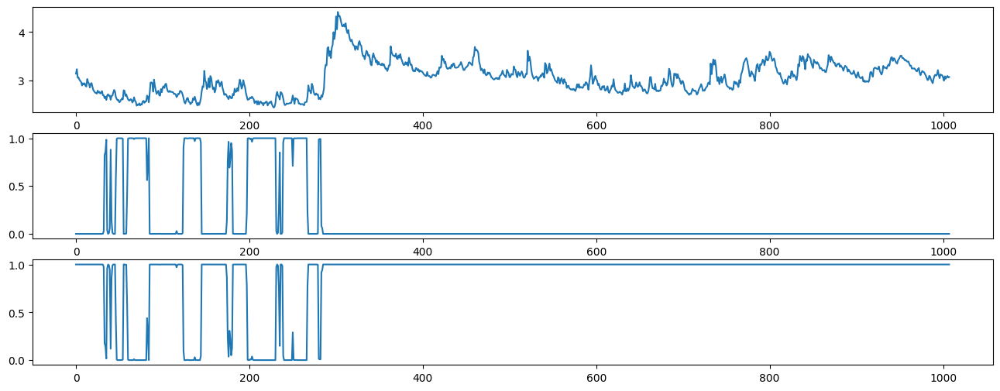


ite=0, max(diff) = 3.0489355984802993

mu_hat0 = [2.57444578 3.12384521], 
sigma_hat0 = [0.05528796 0.29384606], 
P_hat0 = 
[[0.91502463 0.08497537]
 [0.0124254  0.9875746 ]], 
pi_hat0 = [3.50662952e-26 1.00000000e+00]



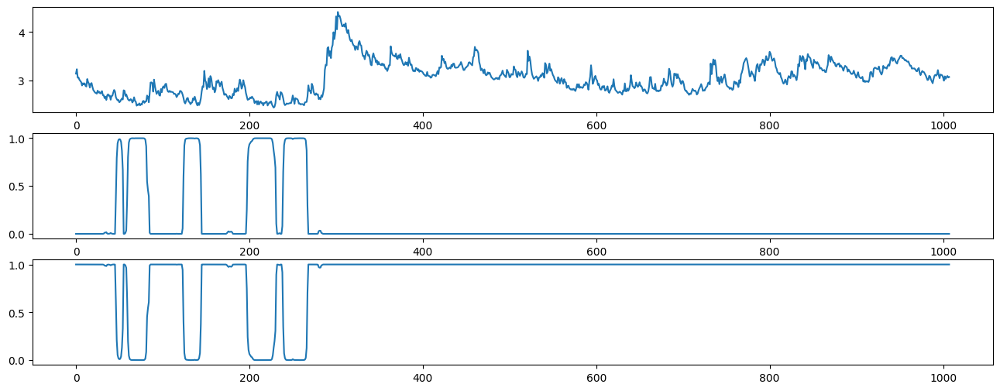


ite=1, max(diff) = 7.167513975064435

mu_hat0 = [2.56685517 3.11424275], 
sigma_hat0 = [0.05330215 0.29905289], 
P_hat0 = 
[[0.95328877 0.04671123]
 [0.00580156 0.99419844]], 
pi_hat0 = [2.26115649e-50 1.00000000e+00]



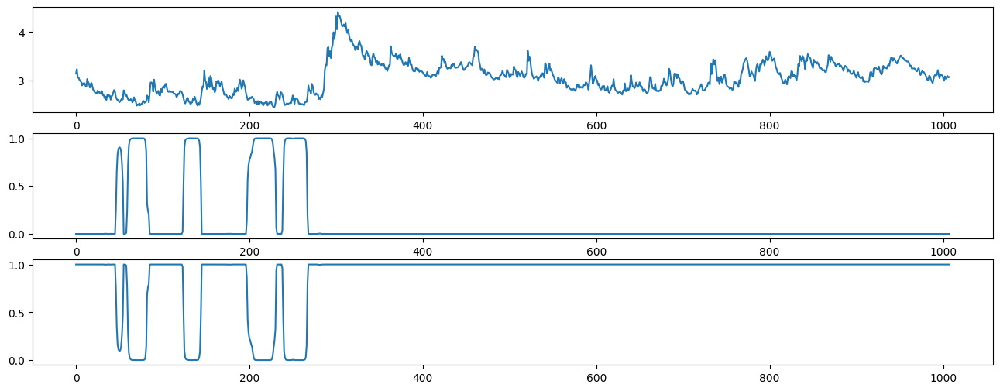


ite=2, max(diff) = 0.28522040876800764

mu_hat0 = [2.56441606 3.11209419], 
sigma_hat0 = [0.05205172 0.30012383], 
P_hat0 = 
[[0.95383147 0.04616853]
 [0.00550264 0.99449736]], 
pi_hat0 = [3.02304574e-77 1.00000000e+00]



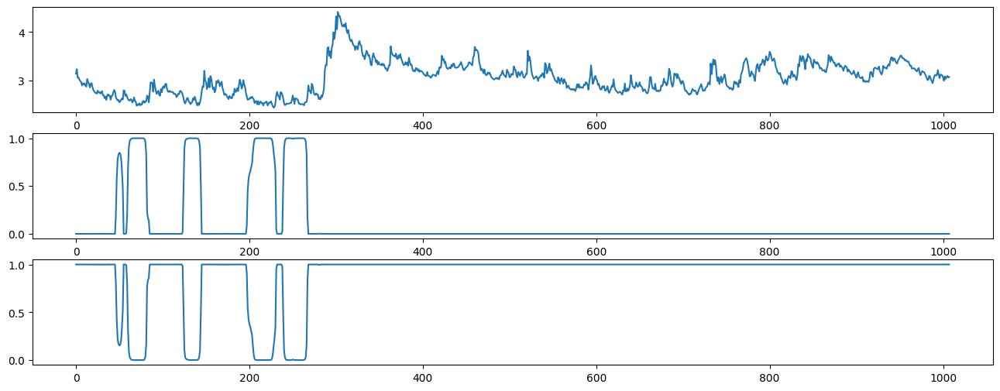


ite=3, max(diff) = 0.18346556378141882

mu_hat0 = [2.56310698 3.110879  ], 
sigma_hat0 = [0.05141826 0.30073961], 
P_hat0 = 
[[0.95339599 0.04660401]
 [0.00542417 0.99457583]], 
pi_hat0 = [1.35809987e-105 1.00000000e+000]



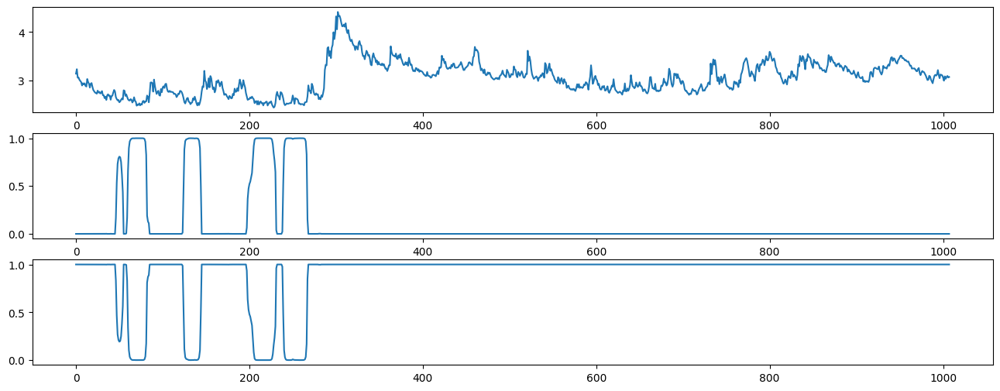


ite=4, max(diff) = 0.11929508327207004

mu_hat0 = [2.56225902 3.11011131], 
sigma_hat0 = [0.05102421 0.3011262 ], 
P_hat0 = 
[[0.9531167  0.0468833 ]
 [0.00537396 0.99462604]], 
pi_hat0 = [9.8826649e-135 1.0000000e+000]



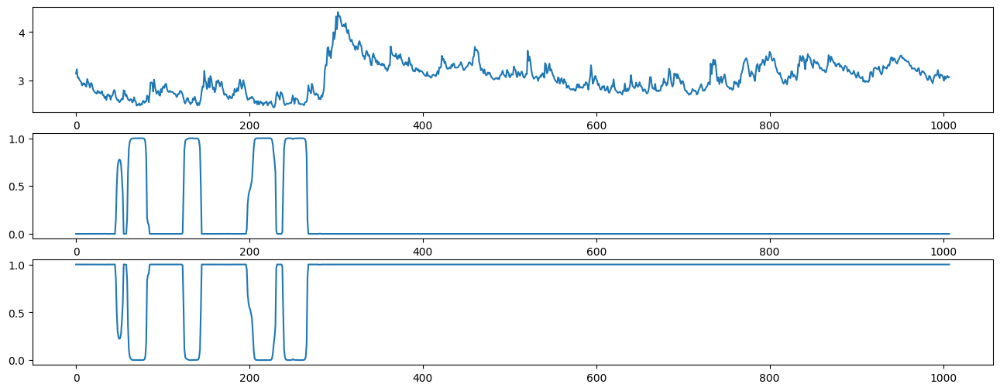


ite=5, max(diff) = 0.07644745047108731

mu_hat0 = [2.56167128 3.10958833], 
sigma_hat0 = [0.05075554 0.3013885 ], 
P_hat0 = 
[[0.9529442  0.0470558 ]
 [0.00533722 0.99466278]], 
pi_hat0 = [2.21774446e-164 1.00000000e+000]



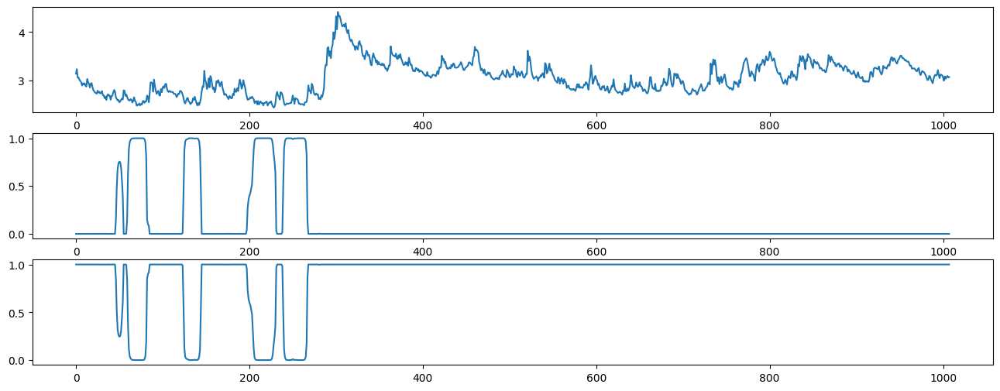


ite=6, max(diff) = 0.05048954447230941

mu_hat0 = [2.56125203 3.10921829], 
sigma_hat0 = [0.0505651  0.30157381], 
P_hat0 = 
[[0.95283453 0.04716547]
 [0.00530963 0.99469037]], 
pi_hat0 = [2.18858565e-194 1.00000000e+000]



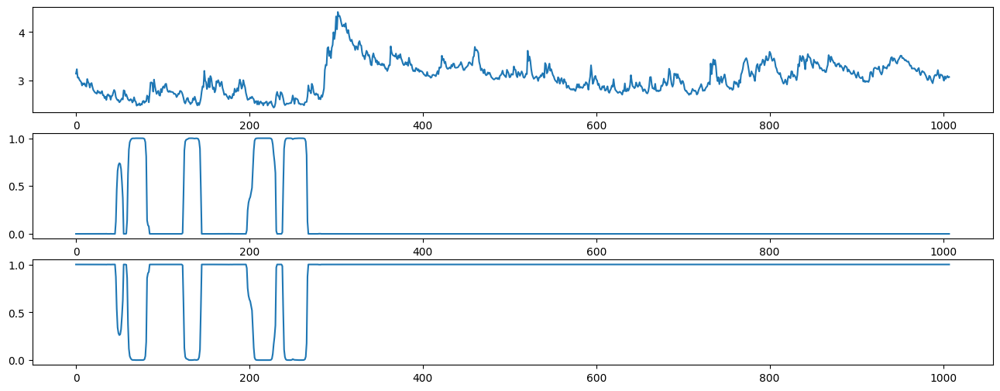


ite=7, max(diff) = 0.03400290676969755

mu_hat0 = [2.56094938 3.10895203], 
sigma_hat0 = [0.05042807 0.3017071 ], 
P_hat0 = 
[[0.95276336 0.04723664]
 [0.00528883 0.99471117]], 
pi_hat0 = [1.19523588e-224 1.00000000e+000]



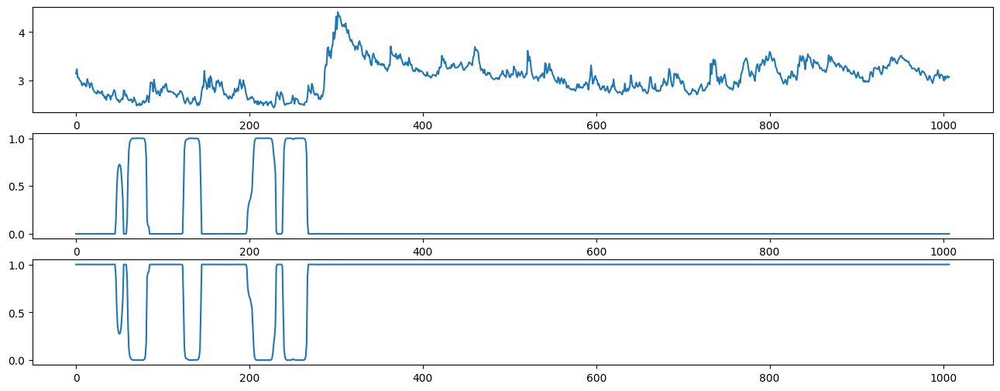


ite=8, max(diff) = 0.023190111800484147

mu_hat0 = [2.56073005 3.10875926], 
sigma_hat0 = [0.05032901 0.30180361], 
P_hat0 = 
[[0.95271649 0.04728351]
 [0.00527322 0.99472678]], 
pi_hat0 = [4.24378071e-255 1.00000000e+000]



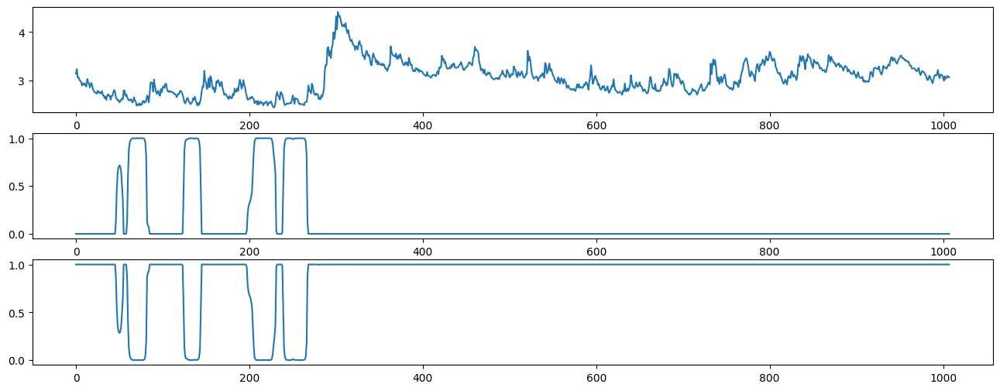


ite=9, max(diff) = 0.015966564016117426

mu_hat0 = [2.56057108 3.10861953], 
sigma_hat0 = [0.05025735 0.30187359], 
P_hat0 = 
[[0.95268523 0.04731477]
 [0.00526158 0.99473842]], 
pi_hat0 = [1.10091613e-285 1.00000000e+000]



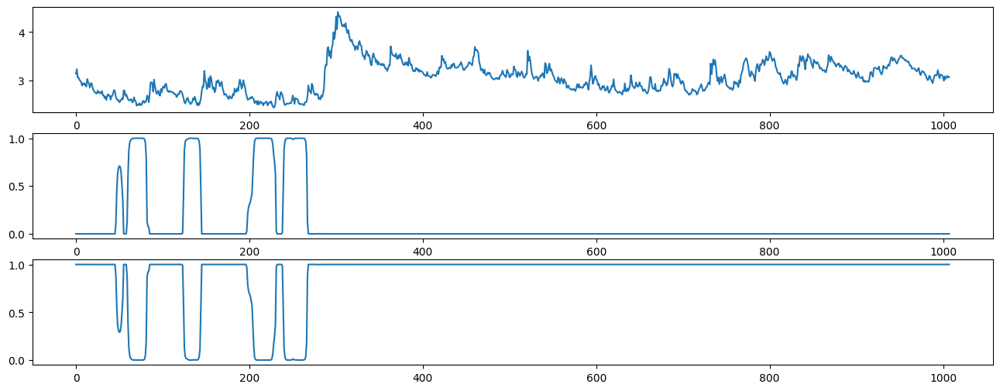


ite=10, max(diff) = 0.011080781585390288

mu_hat0 = [2.56045602 3.10851835], 
sigma_hat0 = [0.05020558 0.30192428], 
P_hat0 = 
[[0.95266412 0.04733588]
 [0.00525298 0.99474702]], 
pi_hat0 = [2.27287647e-316 1.00000000e+000]



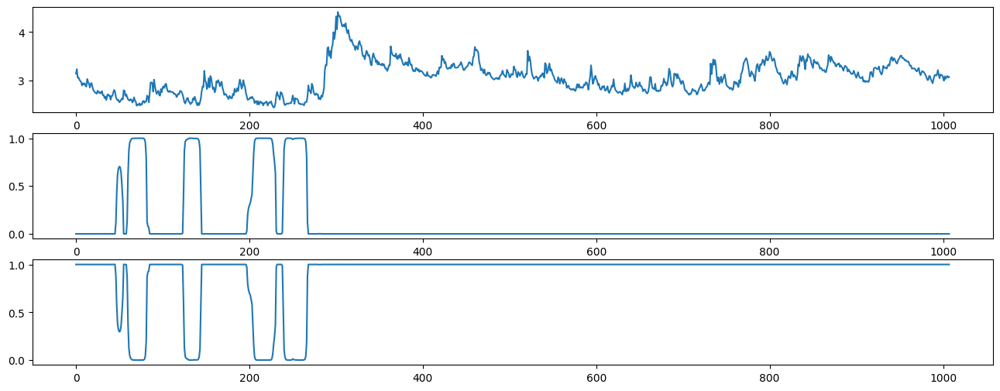


ite=11, max(diff) = 0.007742790104485148

mu_hat1 = [2.56037288 3.1084452 ], 
sigma_hat1 = [0.05016823 0.30196094], 
P_hat1 = 
[[0.95264971 0.04735029]
 [0.00524667 0.99475333]], 
pi_hat1 = [0. 1.]


In [ ]:
#Assume different mu different sigma
# Initialize parameters
T = len(YData)
N = 2

# SET INITIAL GUESSES

mu_hat0 = [2, 4] * np.ones((N))
sigma_hat0 = [0.1, 0.2] * np.ones((N))
P_hat0 = np.zeros((N, N))

P_hat0[0, 0] = 0.85
P_hat0[0, 1] = 1 - P_hat0[0, 0]
P_hat0[1, 1] = 0.90
P_hat0[1, 0] = 1 - P_hat0[1, 1]

pi_hat0 = [0.5, 0.5] * np.ones((N))
for t in range(1, 100):
    pi_hat0 = np.dot(P_hat0.T, pi_hat0)

# Determine maximum number of iterations until convergence and convergence tolerance
itemax = 100
itetol = 1e-2

for ite in range(0, itemax):
    #print(mu_hat0, sigma_hat0, P_hat0, pi_hat0)
    print(f"\nmu_hat0 = {mu_hat0}, \nsigma_hat0 = {sigma_hat0}, \nP_hat0 = \n{P_hat0}, \npi_hat0 = {pi_hat0}")

    # E-step
    xi_prob_t, xi_prob_t1 = forward_alg(
        pi_hat0, N, T, P_hat0, mu_hat0, sigma_hat0, YData
    )
    xi_prob_T = backward_alg(
        xi_prob_t, xi_prob_t1, N, T, P_hat0, mu_hat0, sigma_hat0, YData
    )

    print("")

    plt.subplot(3, 1, 1)
    plt.plot(YData)
    plt.subplot(3, 1, 2)
    plt.plot(xi_prob_T[:, 0])
    plt.subplot(3, 1, 3)
    plt.plot(xi_prob_T[:, 1])
    fig = plt.gcf()
    fig.set_size_inches(16, 6)
    plt.show()
    print("")

    # Compute Pr(s_t+1 = j, s_t = i)
    P_hat_T = np.zeros((N, N, T))
    for tt in range(1, T):
        for ss in range(0, N):
            for ss2 in range(0, N):
                P_hat_T[ss, ss2, tt] = (
                    P_hat0[ss, ss2]
                    * xi_prob_t[tt - 1, ss]
                    * xi_prob_T[tt, ss2]
                    / xi_prob_t1[tt - 1, ss2]
                )
    # M-step
    mu_hat1, sigma_hat1, P_hat1, pi_hat1 = M_step_func(xi_prob_T, P_hat_T, N, T, YData)

    diff = np.zeros((4))
    diff[0] = np.sum(np.absolute(mu_hat1 - mu_hat0)) / (np.min(mu_hat0) + itetol * 1e-2)
    diff[1] = np.sum(np.absolute(sigma_hat1 - sigma_hat0)) / (
        np.min(sigma_hat0) + itetol * 1e-2
    )
    diff[2] = np.sum(np.absolute(np.subtract(P_hat1, P_hat0))) / (
        np.min(P_hat0) + itetol * 1e-2
    )
    diff[3] = np.sum(np.absolute(pi_hat1 - pi_hat0)) / (np.min(pi_hat0) + itetol * 1e-2)

    print(f"ite={ite}, max(diff) = {np.max(diff)}")

    if np.max(diff) > itetol:
        mu_hat0, sigma_hat0, P_hat0, pi_hat0 = mu_hat1, sigma_hat1, P_hat1, pi_hat1
    else:
        print(f"\nmu_hat1 = {mu_hat1}, \nsigma_hat1 = {sigma_hat1}, \nP_hat1 = \n{P_hat1}, \npi_hat1 = {pi_hat1}")
        break

### different sigma and different mu also behaved well and may be used as a regime detector.

# STEP 3.d Performance Comparison for N = 2 and N = 3

In [ ]:
#Output under assumption of same mu and same sigma
N = 2
mu_hat1 = [3.05382796, 3.05382796]* np.ones((N))
sigma_hat1 = [0.33059937, 0.33059937]* np.ones((N))
P_hat1 = np.ones((N, N))
P_hat1[0, 0] = 0.85
P_hat1[0, 1] = 1 - P_hat1[0, 0]
P_hat1[1, 1] = 0.9
P_hat1[1, 0] = 1 - P_hat1[1, 1]
pi_hat1 = [0.4, 0.6]* np.ones((N))

#Output under assumption of different mu and same sigma
mu_hat2 = [2.56035551, 3.10842992]* np.ones((N))
sigma_hat2 = [0.05016043, 0.3019686]* np.ones((N))
P_hat2 = np.ones((N, N))
P_hat2[0, 0] = 0.95264679
P_hat2[0, 1] = 1 - P_hat1[0, 0]
P_hat2[1, 1] = 0.99475466
P_hat2[1, 0] = 1 - P_hat1[1, 1]
pi_hat2 = [0., 1.]* np.ones((N))

#Output under assumption of same mu and different sigma
mu_hat3 = [2.53492705, 3.05382796]* np.ones((N))
sigma_hat3 = [0.00041634, 0.33059937]* np.ones((N))
P_hat3 = np.ones((N, N))
P_hat3[0, 0] = 4.85549578e-121
P_hat3[0, 1] = 1 - P_hat1[0, 0]
P_hat3[1, 1] = 1.00000000e+000
P_hat3[1, 0] = 1 - P_hat1[1, 1]
pi_hat3 = [0., 1.]* np.ones((N))

#Output under under assumption of different mu and different sigma

mu_hat4 = [2.56037288, 3.1084452]* np.ones((N))
sigma_hat4 = [0.05016823, 0.30196094]* np.ones((N))
P_hat4 = np.ones((N, N))
P_hat4[0, 0] = 0.95264971
P_hat4[0, 1] = 1 - P_hat1[0, 0]
P_hat4[1, 1] = 0.99475333
P_hat4[1, 0] = 1 - P_hat1[1, 1]
pi_hat4 = [0., 1.]* np.ones((N))


N = 3

mu_hat5 = [2.55737148, 2.7017012,  3.15173827]* np.ones((N))
sigma_hat5 = [0.04825392, 0.05564275, 0.28420998]* np.ones((N))
P_hat5 = np.ones((N, N))

P_hat5[0,0] = 9.43967101e-01
P_hat5[0,1] = 3.18541130e-02
P_hat5[0,2]= 2.41787865e-02

P_hat5[1,0] = 6.48016774e-02
P_hat5[1,1] = 9.03157902e-01
P_hat5[1,2] = 3.20404208e-02

P_hat5[2,0] = 0
P_hat5[2,1] = 6.35025006e-03
P_hat5[2,2] = 9.93649750e-01

pi_hat5 = [0, 0, 1]



def log_likelihood(pi0, N, T, P, mu, sigma, Y):
    # 0. Rearrange vector of parameters

    # 1. Forward algorithm

    xi_prob_t, xi_prob_t1 = forward_alg(pi0, N, T, P, mu, sigma, Y)


    # 2. Evaluate likelihood

    y_like = np.zeros(T)
    y_like[0] = likelihood(pi0, mu, sigma, Y[0])
    for tt in range(1, T):
        y_like[tt] = likelihood(xi_prob_t1[tt - 1, :], mu, sigma, Y[tt])

    sum_log_like = -np.sum(np.log(y_like))
    # print(sum_log_like)

    return sum_log_like

N =2
log_likelihood1 = log_likelihood(pi_hat1, N, T, P_hat1, mu_hat1, sigma_hat1, YData)
log_likelihood2 = log_likelihood(pi_hat2, N, T, P_hat2, mu_hat2, sigma_hat2, YData)
log_likelihood3 = log_likelihood(pi_hat3, N, T, P_hat3, mu_hat3, sigma_hat3, YData)
log_likelihood4 = log_likelihood(pi_hat4, N, T, P_hat4, mu_hat4, sigma_hat4, YData)

N =3
log_likelihood5 = log_likelihood(pi_hat5, N, T, P_hat5, mu_hat5, sigma_hat5, YData)

# Calculate AIC score
k = N * (N-1) + 2 * N
for L in [log_likelihood1, log_likelihood2, log_likelihood3, log_likelihood4, log_likelihood5]:
  AIC = -2 * L + 2 * k
  print("With L = {:2f}, AIC score is {:.2f}".format(L, AIC))

With L = 1430.290039, AIC score is -2836.58
With L = 1443.633996, AIC score is -2863.27
With L = 1430.159694, AIC score is -2836.32
With L = 1443.642587, AIC score is -2863.29
With L = 1493.535963, AIC score is -2963.07


### When N = 3 states our last iteration with different mu and different sigma start condition run converged and showed the best result of fidelity for its lowest AIC value.